<a href="https://colab.research.google.com/github/FlorianWoelki/fashion_mnist_gan/blob/master/fashion_mnist_gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import keras
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU

In [2]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

4423680/4422102 [==============================] - 1s 0us/step


In [0]:
x_train = x_train/127.5-1

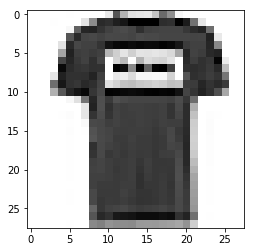

In [6]:
plt.imshow(x_train[1], cmap='Greys')

In [0]:
x_train = np.expand_dims(x_train, axis=3)

In [9]:
def create_generator():
  model = Sequential()

  model.add(Dense(256, input_dim=100))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))
  
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(1024))
  model.add(LeakyReLU(0.2))
  model.add(BatchNormalization(momentum=0.8))

  model.add(Dense(np.prod((28, 28, 1)), activation='tanh'))
  model.add(Reshape((28, 28, 1)))

  model.summary()

  noise = Input(shape=(100,))
  img = model(noise)

  return Model(noise, img)

generator = create_generator()
z = Input(shape=(100,))
img = generator(z)





Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               25856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 256)               1024      
_________________________________________________________________
dense_2 (Dense)              (None, 512)               131584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
batch_normalization_2 (Batch (None, 512)               2048      
_________________________________________________________________
dense_3 (Dense)              (None, 1024)         

In [10]:
def create_discriminator():
  model = Sequential()

  model.add(Flatten(input_shape=(28, 28, 1)))
  model.add(Dense(512))
  model.add(LeakyReLU(0.2))
  model.add(Dense(256))
  model.add(LeakyReLU(0.2))
  model.add(Dense(1, activation='sigmoid'))
  model.summary()

  img = Input(shape=(28, 28, 1))
  validity = model(img)

  return Model(img, validity)

discriminator = create_discriminator()
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])
discriminator.trainable = False

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

In [0]:
validity = discriminator(img)
combined = Model(z, validity)
combined.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

In [0]:
def sample_images(epoch):
  r, c = 5, 5
  noise = np.random.normal(0, 1, (r*c, 100))
  gen_imgs = generator.predict(noise)

  # Rescale images 0 - 1
  gen_imgs = 0.5*gen_imgs+0.5

  fig, axs = plt.subplots(r, c)
  cnt = 0
  for i in range(r):
    for j in range(c):
      axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
      axs[i, j].axis('off')
      cnt += 1
  #fig.savefig("images/%d.png" % epoch)
  plt.show()
  plt.close()

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:493: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.675576, acc.: 57.81%] [G loss: 0.958426]


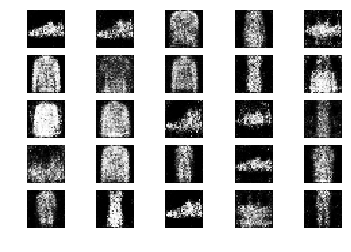

1 [D loss: 0.722301, acc.: 53.12%] [G loss: 0.871149]
2 [D loss: 0.585396, acc.: 73.44%] [G loss: 0.937948]
3 [D loss: 0.642854, acc.: 62.50%] [G loss: 0.958332]
4 [D loss: 0.661320, acc.: 57.81%] [G loss: 0.973630]
5 [D loss: 0.719432, acc.: 56.25%] [G loss: 0.964112]
6 [D loss: 0.603525, acc.: 68.75%] [G loss: 1.057700]
7 [D loss: 0.698720, acc.: 54.69%] [G loss: 0.935104]
8 [D loss: 0.665177, acc.: 60.94%] [G loss: 0.871018]
9 [D loss: 0.612975, acc.: 64.06%] [G loss: 0.996003]
10 [D loss: 0.703142, acc.: 57.81%] [G loss: 0.824176]
11 [D loss: 0.652121, acc.: 64.06%] [G loss: 0.967177]
12 [D loss: 0.629414, acc.: 62.50%] [G loss: 0.886477]
13 [D loss: 0.688658, acc.: 59.38%] [G loss: 0.977184]
14 [D loss: 0.679821, acc.: 54.69%] [G loss: 0.890000]
15 [D loss: 0.620723, acc.: 71.88%] [G loss: 0.953012]
16 [D loss: 0.624629, acc.: 65.62%] [G loss: 0.951010]
17 [D loss: 0.586746, acc.: 65.62%] [G loss: 0.836192]
18 [D loss: 0.619381, acc.: 64.06%] [G loss: 0.939585]
19 [D loss: 0.62826

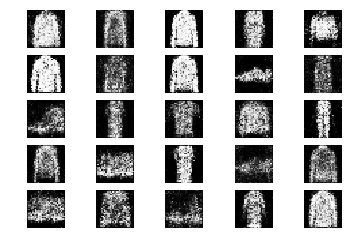

51 [D loss: 0.638913, acc.: 68.75%] [G loss: 0.916443]
52 [D loss: 0.643309, acc.: 56.25%] [G loss: 1.064202]
53 [D loss: 0.592954, acc.: 68.75%] [G loss: 0.936884]
54 [D loss: 0.637092, acc.: 65.62%] [G loss: 0.966610]
55 [D loss: 0.608844, acc.: 65.62%] [G loss: 0.923172]
56 [D loss: 0.567244, acc.: 75.00%] [G loss: 0.908463]
57 [D loss: 0.591953, acc.: 68.75%] [G loss: 0.891963]
58 [D loss: 0.678048, acc.: 59.38%] [G loss: 0.954658]
59 [D loss: 0.600940, acc.: 67.19%] [G loss: 0.963220]
60 [D loss: 0.597444, acc.: 73.44%] [G loss: 0.960111]
61 [D loss: 0.571853, acc.: 73.44%] [G loss: 0.891993]
62 [D loss: 0.595584, acc.: 75.00%] [G loss: 0.971068]
63 [D loss: 0.677588, acc.: 54.69%] [G loss: 1.029523]
64 [D loss: 0.732848, acc.: 56.25%] [G loss: 0.931746]
65 [D loss: 0.608822, acc.: 62.50%] [G loss: 0.919787]
66 [D loss: 0.616072, acc.: 67.19%] [G loss: 0.900045]
67 [D loss: 0.574116, acc.: 67.19%] [G loss: 0.961668]
68 [D loss: 0.588250, acc.: 65.62%] [G loss: 0.862036]
69 [D loss

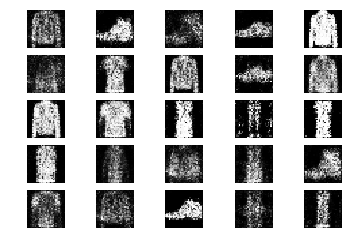

101 [D loss: 0.710578, acc.: 51.56%] [G loss: 0.912292]
102 [D loss: 0.533532, acc.: 82.81%] [G loss: 0.940815]
103 [D loss: 0.545836, acc.: 81.25%] [G loss: 0.823094]
104 [D loss: 0.654876, acc.: 62.50%] [G loss: 0.916185]
105 [D loss: 0.619334, acc.: 65.62%] [G loss: 0.924306]
106 [D loss: 0.695869, acc.: 51.56%] [G loss: 0.910581]
107 [D loss: 0.614031, acc.: 65.62%] [G loss: 0.961350]
108 [D loss: 0.620069, acc.: 70.31%] [G loss: 0.889628]
109 [D loss: 0.566404, acc.: 76.56%] [G loss: 0.881974]
110 [D loss: 0.659107, acc.: 57.81%] [G loss: 0.844770]
111 [D loss: 0.607328, acc.: 65.62%] [G loss: 0.932153]
112 [D loss: 0.614596, acc.: 73.44%] [G loss: 0.945113]
113 [D loss: 0.687564, acc.: 57.81%] [G loss: 0.983411]
114 [D loss: 0.624770, acc.: 65.62%] [G loss: 0.880355]
115 [D loss: 0.567886, acc.: 68.75%] [G loss: 0.889552]
116 [D loss: 0.696268, acc.: 57.81%] [G loss: 0.920825]
117 [D loss: 0.651458, acc.: 67.19%] [G loss: 0.945860]
118 [D loss: 0.615233, acc.: 64.06%] [G loss: 0.

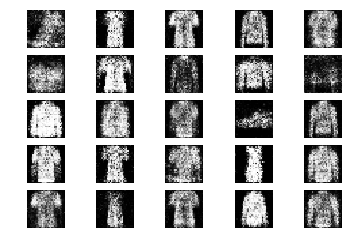

151 [D loss: 0.560189, acc.: 73.44%] [G loss: 0.851978]
152 [D loss: 0.583216, acc.: 67.19%] [G loss: 0.892229]
153 [D loss: 0.597008, acc.: 67.19%] [G loss: 0.961095]
154 [D loss: 0.608317, acc.: 62.50%] [G loss: 0.973417]
155 [D loss: 0.680548, acc.: 54.69%] [G loss: 0.919003]
156 [D loss: 0.647423, acc.: 62.50%] [G loss: 0.966363]
157 [D loss: 0.609588, acc.: 57.81%] [G loss: 1.039974]
158 [D loss: 0.624549, acc.: 59.38%] [G loss: 0.966743]
159 [D loss: 0.581303, acc.: 75.00%] [G loss: 1.025449]
160 [D loss: 0.612983, acc.: 62.50%] [G loss: 0.941144]
161 [D loss: 0.620582, acc.: 67.19%] [G loss: 0.971417]
162 [D loss: 0.554789, acc.: 75.00%] [G loss: 0.987562]
163 [D loss: 0.617771, acc.: 62.50%] [G loss: 1.032045]
164 [D loss: 0.651832, acc.: 73.44%] [G loss: 0.933719]
165 [D loss: 0.688786, acc.: 54.69%] [G loss: 0.851858]
166 [D loss: 0.598961, acc.: 62.50%] [G loss: 0.873707]
167 [D loss: 0.610384, acc.: 62.50%] [G loss: 0.886427]
168 [D loss: 0.638229, acc.: 56.25%] [G loss: 0.

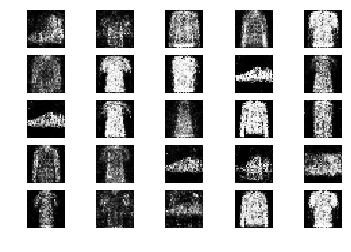

201 [D loss: 0.583304, acc.: 64.06%] [G loss: 0.962579]
202 [D loss: 0.583655, acc.: 76.56%] [G loss: 0.942204]
203 [D loss: 0.643055, acc.: 59.38%] [G loss: 0.897596]
204 [D loss: 0.586682, acc.: 65.62%] [G loss: 1.093252]
205 [D loss: 0.616604, acc.: 67.19%] [G loss: 0.918952]
206 [D loss: 0.631530, acc.: 67.19%] [G loss: 0.901642]
207 [D loss: 0.654682, acc.: 56.25%] [G loss: 0.876012]
208 [D loss: 0.619837, acc.: 68.75%] [G loss: 0.921986]
209 [D loss: 0.629665, acc.: 60.94%] [G loss: 0.944205]
210 [D loss: 0.681572, acc.: 59.38%] [G loss: 0.863634]
211 [D loss: 0.640600, acc.: 64.06%] [G loss: 1.052142]
212 [D loss: 0.660802, acc.: 62.50%] [G loss: 0.968768]
213 [D loss: 0.610764, acc.: 71.88%] [G loss: 0.993282]
214 [D loss: 0.620575, acc.: 67.19%] [G loss: 1.045653]
215 [D loss: 0.664904, acc.: 56.25%] [G loss: 0.958066]
216 [D loss: 0.594721, acc.: 60.94%] [G loss: 0.900090]
217 [D loss: 0.620139, acc.: 65.62%] [G loss: 0.900968]
218 [D loss: 0.615591, acc.: 67.19%] [G loss: 0.

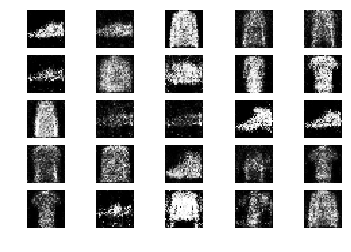

251 [D loss: 0.641025, acc.: 70.31%] [G loss: 0.961154]
252 [D loss: 0.637201, acc.: 62.50%] [G loss: 0.961226]
253 [D loss: 0.564753, acc.: 71.88%] [G loss: 0.989542]
254 [D loss: 0.617571, acc.: 59.38%] [G loss: 0.953143]
255 [D loss: 0.610191, acc.: 75.00%] [G loss: 0.930516]
256 [D loss: 0.664588, acc.: 68.75%] [G loss: 0.869285]
257 [D loss: 0.600774, acc.: 68.75%] [G loss: 0.940063]
258 [D loss: 0.727771, acc.: 60.94%] [G loss: 1.012624]
259 [D loss: 0.602000, acc.: 67.19%] [G loss: 0.910246]
260 [D loss: 0.568343, acc.: 67.19%] [G loss: 0.978754]
261 [D loss: 0.611369, acc.: 60.94%] [G loss: 0.972632]
262 [D loss: 0.611005, acc.: 67.19%] [G loss: 0.893577]
263 [D loss: 0.600796, acc.: 59.38%] [G loss: 0.973113]
264 [D loss: 0.585725, acc.: 67.19%] [G loss: 1.024679]
265 [D loss: 0.626723, acc.: 65.62%] [G loss: 0.891114]
266 [D loss: 0.693229, acc.: 51.56%] [G loss: 0.993085]
267 [D loss: 0.644861, acc.: 62.50%] [G loss: 0.957257]
268 [D loss: 0.642066, acc.: 64.06%] [G loss: 1.

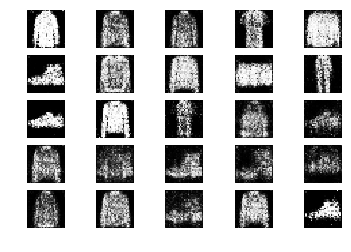

301 [D loss: 0.676248, acc.: 54.69%] [G loss: 1.006080]
302 [D loss: 0.615581, acc.: 70.31%] [G loss: 1.000920]
303 [D loss: 0.641711, acc.: 65.62%] [G loss: 0.967916]
304 [D loss: 0.716569, acc.: 57.81%] [G loss: 0.944893]
305 [D loss: 0.581776, acc.: 76.56%] [G loss: 0.997038]
306 [D loss: 0.628680, acc.: 67.19%] [G loss: 0.983092]
307 [D loss: 0.622962, acc.: 65.62%] [G loss: 0.830281]
308 [D loss: 0.685938, acc.: 59.38%] [G loss: 0.833311]
309 [D loss: 0.619704, acc.: 68.75%] [G loss: 0.859221]
310 [D loss: 0.592926, acc.: 62.50%] [G loss: 0.847080]
311 [D loss: 0.598846, acc.: 68.75%] [G loss: 0.909900]
312 [D loss: 0.576484, acc.: 68.75%] [G loss: 0.906801]
313 [D loss: 0.590685, acc.: 71.88%] [G loss: 0.980004]
314 [D loss: 0.643524, acc.: 62.50%] [G loss: 0.923373]
315 [D loss: 0.551644, acc.: 78.12%] [G loss: 0.966202]
316 [D loss: 0.606130, acc.: 68.75%] [G loss: 0.958488]
317 [D loss: 0.653993, acc.: 62.50%] [G loss: 1.031668]
318 [D loss: 0.668990, acc.: 54.69%] [G loss: 0.

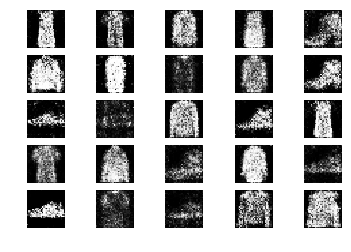

351 [D loss: 0.637608, acc.: 65.62%] [G loss: 0.910871]
352 [D loss: 0.624616, acc.: 70.31%] [G loss: 0.901400]
353 [D loss: 0.651878, acc.: 65.62%] [G loss: 0.927077]
354 [D loss: 0.597639, acc.: 71.88%] [G loss: 0.996466]
355 [D loss: 0.626768, acc.: 67.19%] [G loss: 0.898212]
356 [D loss: 0.582591, acc.: 76.56%] [G loss: 0.878068]
357 [D loss: 0.643797, acc.: 64.06%] [G loss: 0.923890]
358 [D loss: 0.701652, acc.: 51.56%] [G loss: 0.859178]
359 [D loss: 0.589328, acc.: 75.00%] [G loss: 1.016469]
360 [D loss: 0.629912, acc.: 60.94%] [G loss: 0.985794]
361 [D loss: 0.603719, acc.: 71.88%] [G loss: 0.879222]
362 [D loss: 0.600784, acc.: 64.06%] [G loss: 0.914824]
363 [D loss: 0.590639, acc.: 68.75%] [G loss: 0.915224]
364 [D loss: 0.591112, acc.: 70.31%] [G loss: 0.872868]
365 [D loss: 0.691388, acc.: 54.69%] [G loss: 0.998460]
366 [D loss: 0.623118, acc.: 65.62%] [G loss: 0.981557]
367 [D loss: 0.652558, acc.: 60.94%] [G loss: 0.969008]
368 [D loss: 0.651891, acc.: 54.69%] [G loss: 0.

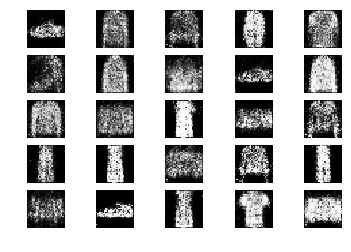

401 [D loss: 0.667104, acc.: 62.50%] [G loss: 0.878533]
402 [D loss: 0.662764, acc.: 57.81%] [G loss: 0.934280]
403 [D loss: 0.655368, acc.: 59.38%] [G loss: 0.879482]
404 [D loss: 0.655064, acc.: 67.19%] [G loss: 0.917354]
405 [D loss: 0.632629, acc.: 60.94%] [G loss: 0.948136]
406 [D loss: 0.664448, acc.: 64.06%] [G loss: 0.932890]
407 [D loss: 0.616943, acc.: 68.75%] [G loss: 0.990569]
408 [D loss: 0.626573, acc.: 68.75%] [G loss: 0.931919]
409 [D loss: 0.674792, acc.: 50.00%] [G loss: 0.951588]
410 [D loss: 0.620480, acc.: 64.06%] [G loss: 1.014047]
411 [D loss: 0.644163, acc.: 62.50%] [G loss: 0.994661]
412 [D loss: 0.614675, acc.: 68.75%] [G loss: 0.915795]
413 [D loss: 0.677338, acc.: 59.38%] [G loss: 0.901271]
414 [D loss: 0.647593, acc.: 64.06%] [G loss: 0.984400]
415 [D loss: 0.630896, acc.: 64.06%] [G loss: 0.965008]
416 [D loss: 0.589337, acc.: 67.19%] [G loss: 0.921851]
417 [D loss: 0.608049, acc.: 70.31%] [G loss: 0.963877]
418 [D loss: 0.582252, acc.: 70.31%] [G loss: 0.

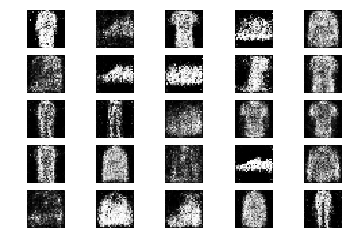

451 [D loss: 0.607029, acc.: 68.75%] [G loss: 0.970732]
452 [D loss: 0.685525, acc.: 59.38%] [G loss: 0.859028]
453 [D loss: 0.692042, acc.: 54.69%] [G loss: 0.975444]
454 [D loss: 0.716757, acc.: 54.69%] [G loss: 0.859749]
455 [D loss: 0.612531, acc.: 64.06%] [G loss: 0.941212]
456 [D loss: 0.641376, acc.: 59.38%] [G loss: 0.964623]
457 [D loss: 0.604436, acc.: 64.06%] [G loss: 0.998855]
458 [D loss: 0.752772, acc.: 50.00%] [G loss: 1.017974]
459 [D loss: 0.607532, acc.: 68.75%] [G loss: 1.052673]
460 [D loss: 0.627681, acc.: 56.25%] [G loss: 0.931945]
461 [D loss: 0.544262, acc.: 76.56%] [G loss: 1.019308]
462 [D loss: 0.514844, acc.: 81.25%] [G loss: 0.948668]
463 [D loss: 0.649784, acc.: 62.50%] [G loss: 0.982827]
464 [D loss: 0.621380, acc.: 67.19%] [G loss: 0.951452]
465 [D loss: 0.574332, acc.: 68.75%] [G loss: 0.904721]
466 [D loss: 0.670838, acc.: 62.50%] [G loss: 0.963570]
467 [D loss: 0.543857, acc.: 75.00%] [G loss: 0.899531]
468 [D loss: 0.563570, acc.: 67.19%] [G loss: 1.

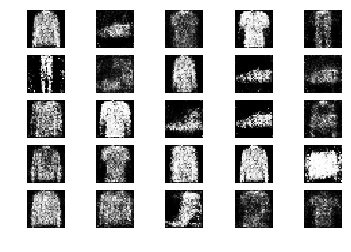

501 [D loss: 0.619096, acc.: 62.50%] [G loss: 0.897063]
502 [D loss: 0.627382, acc.: 65.62%] [G loss: 0.862413]
503 [D loss: 0.612136, acc.: 65.62%] [G loss: 0.943956]
504 [D loss: 0.577525, acc.: 67.19%] [G loss: 0.910551]
505 [D loss: 0.604369, acc.: 60.94%] [G loss: 0.964850]
506 [D loss: 0.662244, acc.: 65.62%] [G loss: 0.925527]
507 [D loss: 0.607664, acc.: 62.50%] [G loss: 1.002350]
508 [D loss: 0.654647, acc.: 67.19%] [G loss: 0.893733]
509 [D loss: 0.666139, acc.: 65.62%] [G loss: 0.812487]
510 [D loss: 0.666991, acc.: 60.94%] [G loss: 0.793532]
511 [D loss: 0.702412, acc.: 51.56%] [G loss: 0.933737]
512 [D loss: 0.685253, acc.: 54.69%] [G loss: 0.995370]
513 [D loss: 0.600681, acc.: 70.31%] [G loss: 0.953918]
514 [D loss: 0.613154, acc.: 67.19%] [G loss: 0.954944]
515 [D loss: 0.592422, acc.: 67.19%] [G loss: 0.870323]
516 [D loss: 0.654470, acc.: 64.06%] [G loss: 0.896159]
517 [D loss: 0.745968, acc.: 48.44%] [G loss: 0.859085]
518 [D loss: 0.678078, acc.: 62.50%] [G loss: 0.

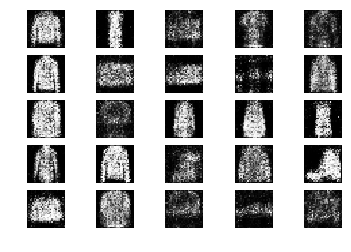

551 [D loss: 0.648309, acc.: 64.06%] [G loss: 0.951753]
552 [D loss: 0.552267, acc.: 70.31%] [G loss: 0.951879]
553 [D loss: 0.604980, acc.: 62.50%] [G loss: 0.999941]
554 [D loss: 0.686211, acc.: 54.69%] [G loss: 1.001024]
555 [D loss: 0.608602, acc.: 65.62%] [G loss: 0.906727]
556 [D loss: 0.682250, acc.: 50.00%] [G loss: 0.982805]
557 [D loss: 0.642896, acc.: 60.94%] [G loss: 0.955140]
558 [D loss: 0.542856, acc.: 75.00%] [G loss: 0.974226]
559 [D loss: 0.658524, acc.: 51.56%] [G loss: 0.924123]
560 [D loss: 0.612188, acc.: 64.06%] [G loss: 0.997940]
561 [D loss: 0.667168, acc.: 56.25%] [G loss: 0.880329]
562 [D loss: 0.596669, acc.: 68.75%] [G loss: 0.865757]
563 [D loss: 0.628672, acc.: 60.94%] [G loss: 0.906543]
564 [D loss: 0.611076, acc.: 64.06%] [G loss: 1.019908]
565 [D loss: 0.599728, acc.: 71.88%] [G loss: 1.021152]
566 [D loss: 0.603874, acc.: 67.19%] [G loss: 0.982571]
567 [D loss: 0.616071, acc.: 67.19%] [G loss: 0.989184]
568 [D loss: 0.650329, acc.: 60.94%] [G loss: 0.

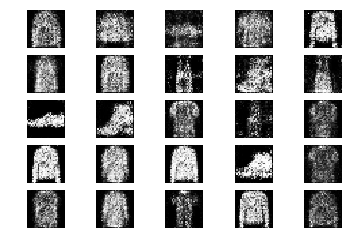

601 [D loss: 0.633642, acc.: 64.06%] [G loss: 0.924504]
602 [D loss: 0.601322, acc.: 60.94%] [G loss: 0.887498]
603 [D loss: 0.619552, acc.: 75.00%] [G loss: 0.974233]
604 [D loss: 0.583971, acc.: 71.88%] [G loss: 0.947231]
605 [D loss: 0.602307, acc.: 75.00%] [G loss: 0.935163]
606 [D loss: 0.723953, acc.: 59.38%] [G loss: 0.977156]
607 [D loss: 0.664544, acc.: 60.94%] [G loss: 0.878507]
608 [D loss: 0.675333, acc.: 71.88%] [G loss: 0.981050]
609 [D loss: 0.616046, acc.: 57.81%] [G loss: 1.008281]
610 [D loss: 0.605758, acc.: 67.19%] [G loss: 0.942959]
611 [D loss: 0.594254, acc.: 67.19%] [G loss: 0.918912]
612 [D loss: 0.680814, acc.: 57.81%] [G loss: 0.910549]
613 [D loss: 0.597219, acc.: 68.75%] [G loss: 0.944330]
614 [D loss: 0.607749, acc.: 73.44%] [G loss: 0.911300]
615 [D loss: 0.709216, acc.: 54.69%] [G loss: 1.000673]
616 [D loss: 0.664376, acc.: 56.25%] [G loss: 0.948038]
617 [D loss: 0.649750, acc.: 64.06%] [G loss: 0.997201]
618 [D loss: 0.590917, acc.: 70.31%] [G loss: 0.

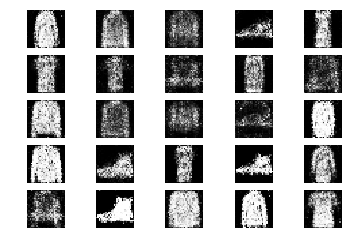

651 [D loss: 0.656722, acc.: 60.94%] [G loss: 0.967180]
652 [D loss: 0.590461, acc.: 70.31%] [G loss: 1.023833]
653 [D loss: 0.650248, acc.: 60.94%] [G loss: 1.005065]
654 [D loss: 0.658911, acc.: 57.81%] [G loss: 0.984239]
655 [D loss: 0.581063, acc.: 64.06%] [G loss: 0.921558]
656 [D loss: 0.642184, acc.: 64.06%] [G loss: 1.012808]
657 [D loss: 0.653456, acc.: 60.94%] [G loss: 0.901981]
658 [D loss: 0.564217, acc.: 70.31%] [G loss: 0.935293]
659 [D loss: 0.609085, acc.: 65.62%] [G loss: 0.857950]
660 [D loss: 0.600042, acc.: 75.00%] [G loss: 0.988095]
661 [D loss: 0.692342, acc.: 57.81%] [G loss: 0.991619]
662 [D loss: 0.635940, acc.: 65.62%] [G loss: 1.013758]
663 [D loss: 0.536384, acc.: 82.81%] [G loss: 1.071709]
664 [D loss: 0.673975, acc.: 57.81%] [G loss: 0.927922]
665 [D loss: 0.622664, acc.: 68.75%] [G loss: 0.854316]
666 [D loss: 0.657525, acc.: 54.69%] [G loss: 0.971305]
667 [D loss: 0.646684, acc.: 67.19%] [G loss: 0.953409]
668 [D loss: 0.679758, acc.: 62.50%] [G loss: 0.

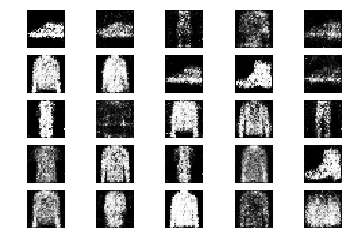

701 [D loss: 0.587972, acc.: 67.19%] [G loss: 0.951868]
702 [D loss: 0.592515, acc.: 65.62%] [G loss: 0.918259]
703 [D loss: 0.598009, acc.: 64.06%] [G loss: 1.048129]
704 [D loss: 0.645833, acc.: 60.94%] [G loss: 0.910913]
705 [D loss: 0.543532, acc.: 71.88%] [G loss: 1.038579]
706 [D loss: 0.637687, acc.: 57.81%] [G loss: 1.064172]
707 [D loss: 0.644157, acc.: 57.81%] [G loss: 0.971962]
708 [D loss: 0.596373, acc.: 68.75%] [G loss: 1.068890]
709 [D loss: 0.680320, acc.: 57.81%] [G loss: 0.961542]
710 [D loss: 0.663764, acc.: 54.69%] [G loss: 0.924758]
711 [D loss: 0.592834, acc.: 73.44%] [G loss: 0.870610]
712 [D loss: 0.662488, acc.: 54.69%] [G loss: 0.985298]
713 [D loss: 0.586133, acc.: 67.19%] [G loss: 0.957390]
714 [D loss: 0.625579, acc.: 64.06%] [G loss: 0.994195]
715 [D loss: 0.612147, acc.: 64.06%] [G loss: 0.980773]
716 [D loss: 0.639626, acc.: 65.62%] [G loss: 0.961586]
717 [D loss: 0.638948, acc.: 59.38%] [G loss: 0.978712]
718 [D loss: 0.618065, acc.: 70.31%] [G loss: 0.

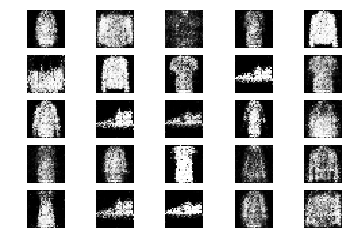

751 [D loss: 0.599962, acc.: 68.75%] [G loss: 0.991063]
752 [D loss: 0.682628, acc.: 65.62%] [G loss: 1.013358]
753 [D loss: 0.697958, acc.: 50.00%] [G loss: 0.981498]
754 [D loss: 0.685697, acc.: 57.81%] [G loss: 0.968003]
755 [D loss: 0.587928, acc.: 68.75%] [G loss: 0.945314]
756 [D loss: 0.652995, acc.: 60.94%] [G loss: 0.904176]
757 [D loss: 0.617300, acc.: 70.31%] [G loss: 0.878003]
758 [D loss: 0.614818, acc.: 65.62%] [G loss: 1.104986]
759 [D loss: 0.567085, acc.: 70.31%] [G loss: 0.981205]
760 [D loss: 0.635678, acc.: 70.31%] [G loss: 0.884747]
761 [D loss: 0.628266, acc.: 62.50%] [G loss: 0.951727]
762 [D loss: 0.564773, acc.: 64.06%] [G loss: 0.995950]
763 [D loss: 0.555041, acc.: 78.12%] [G loss: 0.911210]
764 [D loss: 0.626902, acc.: 62.50%] [G loss: 1.019247]
765 [D loss: 0.581441, acc.: 65.62%] [G loss: 0.931703]
766 [D loss: 0.660337, acc.: 59.38%] [G loss: 0.910275]
767 [D loss: 0.587542, acc.: 67.19%] [G loss: 0.937385]
768 [D loss: 0.623544, acc.: 70.31%] [G loss: 1.

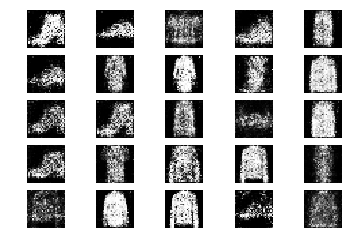

801 [D loss: 0.629219, acc.: 70.31%] [G loss: 0.941086]
802 [D loss: 0.601712, acc.: 67.19%] [G loss: 0.927687]
803 [D loss: 0.641747, acc.: 53.12%] [G loss: 1.002113]
804 [D loss: 0.644217, acc.: 65.62%] [G loss: 0.908090]
805 [D loss: 0.623154, acc.: 68.75%] [G loss: 1.015585]
806 [D loss: 0.657824, acc.: 60.94%] [G loss: 0.929247]
807 [D loss: 0.672611, acc.: 51.56%] [G loss: 0.884068]
808 [D loss: 0.686234, acc.: 56.25%] [G loss: 0.991173]
809 [D loss: 0.665338, acc.: 56.25%] [G loss: 0.890348]
810 [D loss: 0.590584, acc.: 70.31%] [G loss: 0.951883]
811 [D loss: 0.595533, acc.: 76.56%] [G loss: 0.866673]
812 [D loss: 0.637654, acc.: 64.06%] [G loss: 0.922185]
813 [D loss: 0.578632, acc.: 67.19%] [G loss: 0.905321]
814 [D loss: 0.609798, acc.: 62.50%] [G loss: 0.907728]
815 [D loss: 0.582598, acc.: 73.44%] [G loss: 0.907402]
816 [D loss: 0.589345, acc.: 68.75%] [G loss: 0.906867]
817 [D loss: 0.738096, acc.: 57.81%] [G loss: 0.868730]
818 [D loss: 0.650545, acc.: 64.06%] [G loss: 1.

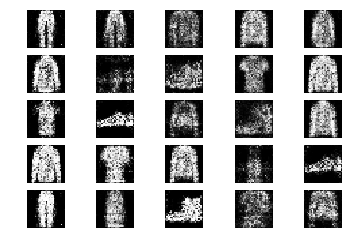

851 [D loss: 0.695018, acc.: 59.38%] [G loss: 0.912753]
852 [D loss: 0.661076, acc.: 60.94%] [G loss: 1.028290]
853 [D loss: 0.617904, acc.: 75.00%] [G loss: 0.910600]
854 [D loss: 0.641988, acc.: 60.94%] [G loss: 0.937275]
855 [D loss: 0.664784, acc.: 65.62%] [G loss: 0.971797]
856 [D loss: 0.664439, acc.: 62.50%] [G loss: 1.075103]
857 [D loss: 0.557040, acc.: 71.88%] [G loss: 0.942007]
858 [D loss: 0.623024, acc.: 68.75%] [G loss: 0.915346]
859 [D loss: 0.679451, acc.: 56.25%] [G loss: 0.872980]
860 [D loss: 0.604578, acc.: 68.75%] [G loss: 0.977120]
861 [D loss: 0.655618, acc.: 60.94%] [G loss: 0.940112]
862 [D loss: 0.642240, acc.: 64.06%] [G loss: 0.898492]
863 [D loss: 0.604720, acc.: 67.19%] [G loss: 0.912349]
864 [D loss: 0.560335, acc.: 67.19%] [G loss: 0.983658]
865 [D loss: 0.641194, acc.: 64.06%] [G loss: 0.871852]
866 [D loss: 0.681199, acc.: 60.94%] [G loss: 0.828862]
867 [D loss: 0.587920, acc.: 67.19%] [G loss: 0.795167]
868 [D loss: 0.610500, acc.: 68.75%] [G loss: 0.

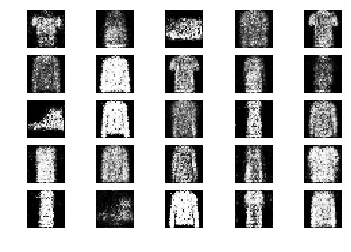

901 [D loss: 0.660728, acc.: 64.06%] [G loss: 0.936361]
902 [D loss: 0.667204, acc.: 57.81%] [G loss: 0.978562]
903 [D loss: 0.618836, acc.: 67.19%] [G loss: 0.950948]
904 [D loss: 0.641087, acc.: 54.69%] [G loss: 0.870771]
905 [D loss: 0.645564, acc.: 60.94%] [G loss: 0.889977]
906 [D loss: 0.608933, acc.: 64.06%] [G loss: 0.895748]
907 [D loss: 0.724424, acc.: 46.88%] [G loss: 0.845762]
908 [D loss: 0.594980, acc.: 59.38%] [G loss: 0.936253]
909 [D loss: 0.591498, acc.: 65.62%] [G loss: 0.944620]
910 [D loss: 0.641751, acc.: 62.50%] [G loss: 0.933237]
911 [D loss: 0.655497, acc.: 53.12%] [G loss: 0.985777]
912 [D loss: 0.667685, acc.: 53.12%] [G loss: 0.983576]
913 [D loss: 0.580633, acc.: 73.44%] [G loss: 0.946215]
914 [D loss: 0.678790, acc.: 60.94%] [G loss: 0.942268]
915 [D loss: 0.639185, acc.: 64.06%] [G loss: 0.927286]
916 [D loss: 0.776893, acc.: 51.56%] [G loss: 0.864335]
917 [D loss: 0.616963, acc.: 67.19%] [G loss: 0.962594]
918 [D loss: 0.581359, acc.: 67.19%] [G loss: 0.

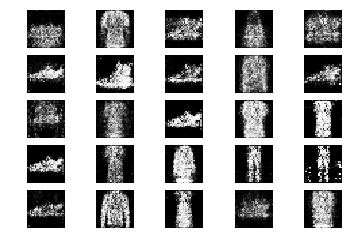

951 [D loss: 0.684287, acc.: 54.69%] [G loss: 0.912676]
952 [D loss: 0.595233, acc.: 68.75%] [G loss: 0.849285]
953 [D loss: 0.595602, acc.: 73.44%] [G loss: 0.866505]
954 [D loss: 0.684358, acc.: 56.25%] [G loss: 0.974408]
955 [D loss: 0.606987, acc.: 64.06%] [G loss: 0.891035]
956 [D loss: 0.668774, acc.: 62.50%] [G loss: 0.982688]
957 [D loss: 0.760766, acc.: 50.00%] [G loss: 1.059438]
958 [D loss: 0.660602, acc.: 57.81%] [G loss: 0.903884]
959 [D loss: 0.652301, acc.: 70.31%] [G loss: 0.853029]
960 [D loss: 0.602221, acc.: 67.19%] [G loss: 0.939626]
961 [D loss: 0.619487, acc.: 65.62%] [G loss: 0.914845]
962 [D loss: 0.650376, acc.: 59.38%] [G loss: 0.849262]
963 [D loss: 0.624690, acc.: 65.62%] [G loss: 0.932262]
964 [D loss: 0.617715, acc.: 62.50%] [G loss: 0.866185]
965 [D loss: 0.613007, acc.: 67.19%] [G loss: 0.912189]
966 [D loss: 0.591720, acc.: 73.44%] [G loss: 0.954104]
967 [D loss: 0.616209, acc.: 64.06%] [G loss: 0.902137]
968 [D loss: 0.669735, acc.: 51.56%] [G loss: 0.

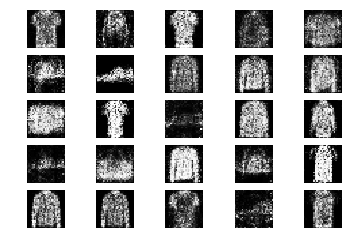

1001 [D loss: 0.654437, acc.: 62.50%] [G loss: 0.977954]
1002 [D loss: 0.615310, acc.: 68.75%] [G loss: 0.907710]
1003 [D loss: 0.629415, acc.: 64.06%] [G loss: 0.994957]
1004 [D loss: 0.679835, acc.: 53.12%] [G loss: 0.885462]
1005 [D loss: 0.707418, acc.: 57.81%] [G loss: 0.829168]
1006 [D loss: 0.634559, acc.: 62.50%] [G loss: 0.860864]
1007 [D loss: 0.645442, acc.: 59.38%] [G loss: 0.916087]
1008 [D loss: 0.665735, acc.: 62.50%] [G loss: 0.954420]
1009 [D loss: 0.659823, acc.: 56.25%] [G loss: 1.003209]
1010 [D loss: 0.667224, acc.: 56.25%] [G loss: 0.878148]
1011 [D loss: 0.652275, acc.: 53.12%] [G loss: 0.949109]
1012 [D loss: 0.647470, acc.: 64.06%] [G loss: 0.867871]
1013 [D loss: 0.640014, acc.: 62.50%] [G loss: 0.936464]
1014 [D loss: 0.641205, acc.: 62.50%] [G loss: 0.838096]
1015 [D loss: 0.702582, acc.: 45.31%] [G loss: 0.883922]
1016 [D loss: 0.675296, acc.: 53.12%] [G loss: 0.842163]
1017 [D loss: 0.556718, acc.: 73.44%] [G loss: 0.930046]
1018 [D loss: 0.678521, acc.: 5

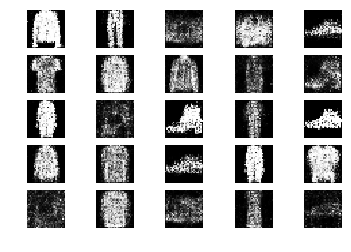

1051 [D loss: 0.616829, acc.: 67.19%] [G loss: 1.038351]
1052 [D loss: 0.661075, acc.: 54.69%] [G loss: 0.887971]
1053 [D loss: 0.679232, acc.: 51.56%] [G loss: 0.940373]
1054 [D loss: 0.689004, acc.: 56.25%] [G loss: 0.938375]
1055 [D loss: 0.624761, acc.: 68.75%] [G loss: 1.012157]
1056 [D loss: 0.616966, acc.: 64.06%] [G loss: 0.887873]
1057 [D loss: 0.636104, acc.: 54.69%] [G loss: 1.036615]
1058 [D loss: 0.653257, acc.: 57.81%] [G loss: 0.811697]
1059 [D loss: 0.647163, acc.: 62.50%] [G loss: 0.901398]
1060 [D loss: 0.629971, acc.: 67.19%] [G loss: 1.016682]
1061 [D loss: 0.600498, acc.: 64.06%] [G loss: 0.929840]
1062 [D loss: 0.693563, acc.: 53.12%] [G loss: 0.926503]
1063 [D loss: 0.620501, acc.: 67.19%] [G loss: 0.946205]
1064 [D loss: 0.630056, acc.: 67.19%] [G loss: 0.973876]
1065 [D loss: 0.701091, acc.: 54.69%] [G loss: 0.794851]
1066 [D loss: 0.609656, acc.: 75.00%] [G loss: 0.976329]
1067 [D loss: 0.693562, acc.: 50.00%] [G loss: 0.941891]
1068 [D loss: 0.598910, acc.: 6

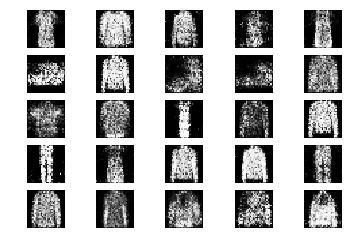

1101 [D loss: 0.645494, acc.: 62.50%] [G loss: 0.890411]
1102 [D loss: 0.640763, acc.: 64.06%] [G loss: 0.989272]
1103 [D loss: 0.627621, acc.: 62.50%] [G loss: 0.951796]
1104 [D loss: 0.656610, acc.: 64.06%] [G loss: 0.873308]
1105 [D loss: 0.669958, acc.: 60.94%] [G loss: 0.958970]
1106 [D loss: 0.647643, acc.: 65.62%] [G loss: 1.036464]
1107 [D loss: 0.644794, acc.: 57.81%] [G loss: 0.977843]
1108 [D loss: 0.665403, acc.: 62.50%] [G loss: 0.881874]
1109 [D loss: 0.677217, acc.: 57.81%] [G loss: 0.930045]
1110 [D loss: 0.640393, acc.: 67.19%] [G loss: 0.954623]
1111 [D loss: 0.657021, acc.: 62.50%] [G loss: 0.966215]
1112 [D loss: 0.631668, acc.: 65.62%] [G loss: 0.879992]
1113 [D loss: 0.659543, acc.: 54.69%] [G loss: 0.965121]
1114 [D loss: 0.620120, acc.: 65.62%] [G loss: 0.902195]
1115 [D loss: 0.673833, acc.: 62.50%] [G loss: 0.873611]
1116 [D loss: 0.664993, acc.: 62.50%] [G loss: 0.935714]
1117 [D loss: 0.661520, acc.: 59.38%] [G loss: 0.886335]
1118 [D loss: 0.716966, acc.: 5

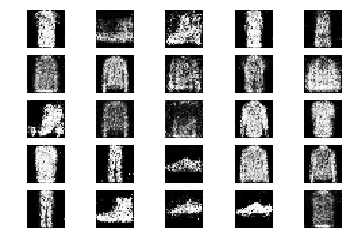

1151 [D loss: 0.734400, acc.: 59.38%] [G loss: 0.821883]
1152 [D loss: 0.639321, acc.: 59.38%] [G loss: 0.906191]
1153 [D loss: 0.577236, acc.: 71.88%] [G loss: 0.890137]
1154 [D loss: 0.603168, acc.: 67.19%] [G loss: 0.831039]
1155 [D loss: 0.610684, acc.: 68.75%] [G loss: 0.879166]
1156 [D loss: 0.639408, acc.: 65.62%] [G loss: 0.826916]
1157 [D loss: 0.669986, acc.: 60.94%] [G loss: 0.848364]
1158 [D loss: 0.711983, acc.: 50.00%] [G loss: 0.856811]
1159 [D loss: 0.678854, acc.: 53.12%] [G loss: 0.944931]
1160 [D loss: 0.637495, acc.: 67.19%] [G loss: 0.950765]
1161 [D loss: 0.666580, acc.: 60.94%] [G loss: 0.864219]
1162 [D loss: 0.678341, acc.: 64.06%] [G loss: 0.887557]
1163 [D loss: 0.663824, acc.: 53.12%] [G loss: 0.901401]
1164 [D loss: 0.713006, acc.: 50.00%] [G loss: 0.857568]
1165 [D loss: 0.645730, acc.: 54.69%] [G loss: 0.930719]
1166 [D loss: 0.598524, acc.: 70.31%] [G loss: 0.918062]
1167 [D loss: 0.622743, acc.: 68.75%] [G loss: 0.903589]
1168 [D loss: 0.657249, acc.: 6

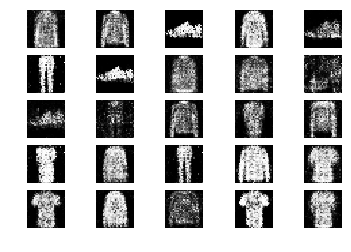

1201 [D loss: 0.689904, acc.: 59.38%] [G loss: 0.937027]
1202 [D loss: 0.641853, acc.: 60.94%] [G loss: 1.000378]
1203 [D loss: 0.633854, acc.: 62.50%] [G loss: 0.923687]
1204 [D loss: 0.708829, acc.: 46.88%] [G loss: 0.869863]
1205 [D loss: 0.697070, acc.: 54.69%] [G loss: 0.900080]
1206 [D loss: 0.670498, acc.: 54.69%] [G loss: 0.890108]
1207 [D loss: 0.633216, acc.: 57.81%] [G loss: 0.927306]
1208 [D loss: 0.623564, acc.: 60.94%] [G loss: 0.951355]
1209 [D loss: 0.667096, acc.: 64.06%] [G loss: 0.853660]
1210 [D loss: 0.713556, acc.: 53.12%] [G loss: 0.929778]
1211 [D loss: 0.595848, acc.: 64.06%] [G loss: 0.902185]
1212 [D loss: 0.718822, acc.: 60.94%] [G loss: 0.954430]
1213 [D loss: 0.632148, acc.: 60.94%] [G loss: 1.009589]
1214 [D loss: 0.676021, acc.: 45.31%] [G loss: 0.854872]
1215 [D loss: 0.569426, acc.: 71.88%] [G loss: 0.889667]
1216 [D loss: 0.655692, acc.: 62.50%] [G loss: 0.949304]
1217 [D loss: 0.662285, acc.: 57.81%] [G loss: 0.982092]
1218 [D loss: 0.663105, acc.: 5

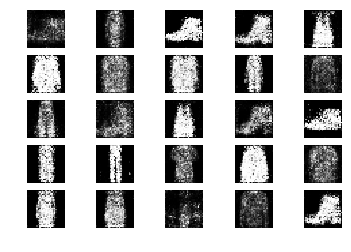

1251 [D loss: 0.685554, acc.: 62.50%] [G loss: 0.921989]
1252 [D loss: 0.632345, acc.: 62.50%] [G loss: 0.913868]
1253 [D loss: 0.601300, acc.: 65.62%] [G loss: 0.877647]
1254 [D loss: 0.710129, acc.: 43.75%] [G loss: 0.929295]
1255 [D loss: 0.652353, acc.: 65.62%] [G loss: 0.935919]
1256 [D loss: 0.636903, acc.: 59.38%] [G loss: 0.967864]
1257 [D loss: 0.706871, acc.: 51.56%] [G loss: 0.832385]
1258 [D loss: 0.627915, acc.: 60.94%] [G loss: 0.847579]
1259 [D loss: 0.656856, acc.: 54.69%] [G loss: 0.920186]
1260 [D loss: 0.653705, acc.: 60.94%] [G loss: 0.935925]
1261 [D loss: 0.667221, acc.: 62.50%] [G loss: 0.959160]
1262 [D loss: 0.616362, acc.: 65.62%] [G loss: 0.920169]
1263 [D loss: 0.587642, acc.: 65.62%] [G loss: 0.926540]
1264 [D loss: 0.604601, acc.: 68.75%] [G loss: 1.005896]
1265 [D loss: 0.726682, acc.: 50.00%] [G loss: 0.938617]
1266 [D loss: 0.700252, acc.: 51.56%] [G loss: 0.881644]
1267 [D loss: 0.647076, acc.: 56.25%] [G loss: 0.859566]
1268 [D loss: 0.690572, acc.: 5

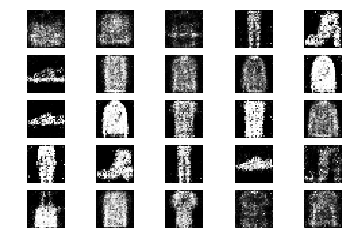

1301 [D loss: 0.636474, acc.: 59.38%] [G loss: 0.922673]
1302 [D loss: 0.665076, acc.: 60.94%] [G loss: 0.972251]
1303 [D loss: 0.646962, acc.: 64.06%] [G loss: 0.910802]
1304 [D loss: 0.556084, acc.: 79.69%] [G loss: 0.925618]
1305 [D loss: 0.644593, acc.: 56.25%] [G loss: 0.852544]
1306 [D loss: 0.680018, acc.: 57.81%] [G loss: 0.929674]
1307 [D loss: 0.608365, acc.: 60.94%] [G loss: 0.910971]
1308 [D loss: 0.693933, acc.: 51.56%] [G loss: 0.976643]
1309 [D loss: 0.551729, acc.: 73.44%] [G loss: 0.861291]
1310 [D loss: 0.600177, acc.: 64.06%] [G loss: 0.930552]
1311 [D loss: 0.664106, acc.: 59.38%] [G loss: 0.863545]
1312 [D loss: 0.697180, acc.: 59.38%] [G loss: 0.958267]
1313 [D loss: 0.650806, acc.: 59.38%] [G loss: 0.870599]
1314 [D loss: 0.605103, acc.: 70.31%] [G loss: 0.924550]
1315 [D loss: 0.747710, acc.: 57.81%] [G loss: 0.991084]
1316 [D loss: 0.625920, acc.: 67.19%] [G loss: 0.930640]
1317 [D loss: 0.711839, acc.: 50.00%] [G loss: 0.983452]
1318 [D loss: 0.654570, acc.: 6

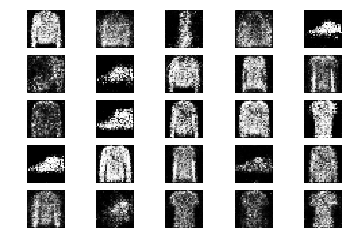

1351 [D loss: 0.603604, acc.: 60.94%] [G loss: 0.958678]
1352 [D loss: 0.676488, acc.: 65.62%] [G loss: 1.058447]
1353 [D loss: 0.625964, acc.: 68.75%] [G loss: 0.975390]
1354 [D loss: 0.635127, acc.: 64.06%] [G loss: 1.018847]
1355 [D loss: 0.643119, acc.: 65.62%] [G loss: 0.911840]
1356 [D loss: 0.582500, acc.: 65.62%] [G loss: 0.877481]
1357 [D loss: 0.669667, acc.: 60.94%] [G loss: 0.915261]
1358 [D loss: 0.714114, acc.: 50.00%] [G loss: 0.895290]
1359 [D loss: 0.648755, acc.: 59.38%] [G loss: 0.836090]
1360 [D loss: 0.674471, acc.: 56.25%] [G loss: 0.906828]
1361 [D loss: 0.681677, acc.: 62.50%] [G loss: 0.921875]
1362 [D loss: 0.661763, acc.: 57.81%] [G loss: 0.826168]
1363 [D loss: 0.680044, acc.: 54.69%] [G loss: 0.887389]
1364 [D loss: 0.679422, acc.: 54.69%] [G loss: 0.848436]
1365 [D loss: 0.588079, acc.: 67.19%] [G loss: 0.889413]
1366 [D loss: 0.593009, acc.: 70.31%] [G loss: 0.891268]
1367 [D loss: 0.649039, acc.: 59.38%] [G loss: 1.006893]
1368 [D loss: 0.677003, acc.: 6

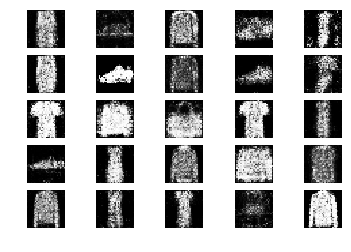

1401 [D loss: 0.715410, acc.: 56.25%] [G loss: 0.959299]
1402 [D loss: 0.660616, acc.: 64.06%] [G loss: 0.983548]
1403 [D loss: 0.682100, acc.: 56.25%] [G loss: 0.929583]
1404 [D loss: 0.602760, acc.: 65.62%] [G loss: 0.998853]
1405 [D loss: 0.653847, acc.: 51.56%] [G loss: 0.906982]
1406 [D loss: 0.654794, acc.: 60.94%] [G loss: 0.848644]
1407 [D loss: 0.633783, acc.: 62.50%] [G loss: 0.872389]
1408 [D loss: 0.655395, acc.: 62.50%] [G loss: 0.838474]
1409 [D loss: 0.556880, acc.: 71.88%] [G loss: 0.869221]
1410 [D loss: 0.682105, acc.: 56.25%] [G loss: 0.937063]
1411 [D loss: 0.654584, acc.: 68.75%] [G loss: 0.856503]
1412 [D loss: 0.673408, acc.: 60.94%] [G loss: 0.774197]
1413 [D loss: 0.653550, acc.: 64.06%] [G loss: 0.828260]
1414 [D loss: 0.643883, acc.: 70.31%] [G loss: 0.872495]
1415 [D loss: 0.616422, acc.: 64.06%] [G loss: 0.804238]
1416 [D loss: 0.621131, acc.: 60.94%] [G loss: 0.887394]
1417 [D loss: 0.693193, acc.: 57.81%] [G loss: 1.017929]
1418 [D loss: 0.602838, acc.: 6

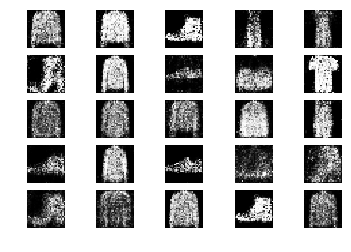

1451 [D loss: 0.628836, acc.: 65.62%] [G loss: 0.901932]
1452 [D loss: 0.574789, acc.: 73.44%] [G loss: 0.847284]
1453 [D loss: 0.715870, acc.: 51.56%] [G loss: 0.963123]
1454 [D loss: 0.681856, acc.: 60.94%] [G loss: 1.005170]
1455 [D loss: 0.634270, acc.: 62.50%] [G loss: 0.996115]
1456 [D loss: 0.601783, acc.: 68.75%] [G loss: 0.987315]
1457 [D loss: 0.634344, acc.: 60.94%] [G loss: 0.946156]
1458 [D loss: 0.591291, acc.: 75.00%] [G loss: 0.905392]
1459 [D loss: 0.598387, acc.: 71.88%] [G loss: 0.977240]
1460 [D loss: 0.645876, acc.: 65.62%] [G loss: 0.908485]
1461 [D loss: 0.606720, acc.: 71.88%] [G loss: 0.879931]
1462 [D loss: 0.627383, acc.: 59.38%] [G loss: 0.855506]
1463 [D loss: 0.550363, acc.: 76.56%] [G loss: 0.888266]
1464 [D loss: 0.590639, acc.: 75.00%] [G loss: 0.822458]
1465 [D loss: 0.660251, acc.: 56.25%] [G loss: 0.885345]
1466 [D loss: 0.691532, acc.: 57.81%] [G loss: 0.924880]
1467 [D loss: 0.710434, acc.: 54.69%] [G loss: 0.904015]
1468 [D loss: 0.591074, acc.: 6

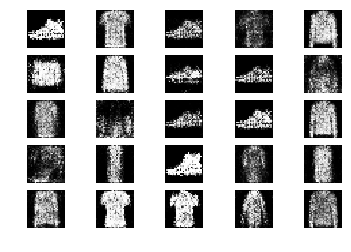

1501 [D loss: 0.605017, acc.: 68.75%] [G loss: 0.887932]
1502 [D loss: 0.744940, acc.: 45.31%] [G loss: 0.900480]
1503 [D loss: 0.678366, acc.: 60.94%] [G loss: 0.933608]
1504 [D loss: 0.657259, acc.: 62.50%] [G loss: 0.939384]
1505 [D loss: 0.695631, acc.: 53.12%] [G loss: 0.944958]
1506 [D loss: 0.648970, acc.: 62.50%] [G loss: 0.909338]
1507 [D loss: 0.628819, acc.: 64.06%] [G loss: 0.932616]
1508 [D loss: 0.603923, acc.: 71.88%] [G loss: 0.890690]
1509 [D loss: 0.607019, acc.: 64.06%] [G loss: 0.947700]
1510 [D loss: 0.671563, acc.: 56.25%] [G loss: 0.958473]
1511 [D loss: 0.668591, acc.: 59.38%] [G loss: 1.011320]
1512 [D loss: 0.626632, acc.: 67.19%] [G loss: 0.939124]
1513 [D loss: 0.672143, acc.: 57.81%] [G loss: 0.952096]
1514 [D loss: 0.709660, acc.: 54.69%] [G loss: 1.004944]
1515 [D loss: 0.651194, acc.: 64.06%] [G loss: 0.885472]
1516 [D loss: 0.634594, acc.: 68.75%] [G loss: 0.918979]
1517 [D loss: 0.646188, acc.: 64.06%] [G loss: 0.987327]
1518 [D loss: 0.657849, acc.: 6

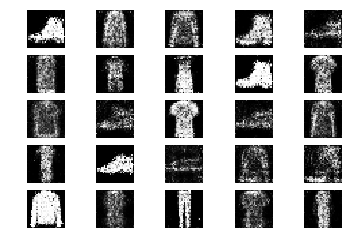

1551 [D loss: 0.611527, acc.: 64.06%] [G loss: 0.969467]
1552 [D loss: 0.625151, acc.: 67.19%] [G loss: 0.993456]
1553 [D loss: 0.579678, acc.: 70.31%] [G loss: 0.911673]
1554 [D loss: 0.674211, acc.: 56.25%] [G loss: 0.814515]
1555 [D loss: 0.640478, acc.: 57.81%] [G loss: 0.861903]
1556 [D loss: 0.609335, acc.: 67.19%] [G loss: 0.958271]
1557 [D loss: 0.721085, acc.: 53.12%] [G loss: 0.899473]
1558 [D loss: 0.675895, acc.: 60.94%] [G loss: 0.879322]
1559 [D loss: 0.591039, acc.: 73.44%] [G loss: 0.868620]
1560 [D loss: 0.622614, acc.: 62.50%] [G loss: 0.924731]
1561 [D loss: 0.627020, acc.: 68.75%] [G loss: 0.997992]
1562 [D loss: 0.606308, acc.: 62.50%] [G loss: 0.967898]
1563 [D loss: 0.659111, acc.: 60.94%] [G loss: 0.875820]
1564 [D loss: 0.646028, acc.: 62.50%] [G loss: 0.964228]
1565 [D loss: 0.649135, acc.: 64.06%] [G loss: 0.940861]
1566 [D loss: 0.619613, acc.: 60.94%] [G loss: 0.925495]
1567 [D loss: 0.624839, acc.: 68.75%] [G loss: 0.938454]
1568 [D loss: 0.621564, acc.: 5

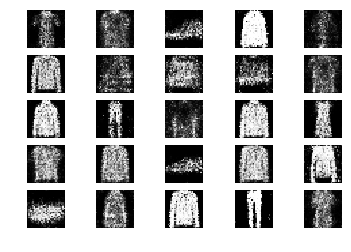

1601 [D loss: 0.635857, acc.: 68.75%] [G loss: 0.832621]
1602 [D loss: 0.696565, acc.: 53.12%] [G loss: 0.888519]
1603 [D loss: 0.614545, acc.: 68.75%] [G loss: 0.915000]
1604 [D loss: 0.642054, acc.: 62.50%] [G loss: 0.806770]
1605 [D loss: 0.718737, acc.: 62.50%] [G loss: 0.915996]
1606 [D loss: 0.645882, acc.: 64.06%] [G loss: 0.971844]
1607 [D loss: 0.621831, acc.: 62.50%] [G loss: 0.862714]
1608 [D loss: 0.638568, acc.: 64.06%] [G loss: 0.970622]
1609 [D loss: 0.649146, acc.: 59.38%] [G loss: 0.924441]
1610 [D loss: 0.659838, acc.: 56.25%] [G loss: 0.987330]
1611 [D loss: 0.627543, acc.: 67.19%] [G loss: 0.907114]
1612 [D loss: 0.691876, acc.: 56.25%] [G loss: 0.841517]
1613 [D loss: 0.625621, acc.: 70.31%] [G loss: 0.879644]
1614 [D loss: 0.609123, acc.: 70.31%] [G loss: 0.897331]
1615 [D loss: 0.633434, acc.: 64.06%] [G loss: 0.896745]
1616 [D loss: 0.575394, acc.: 78.12%] [G loss: 0.837197]
1617 [D loss: 0.655468, acc.: 59.38%] [G loss: 0.939067]
1618 [D loss: 0.634683, acc.: 6

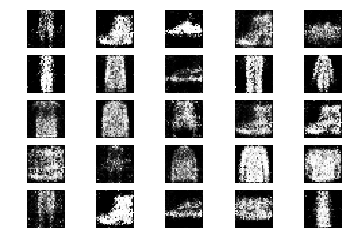

1651 [D loss: 0.637489, acc.: 59.38%] [G loss: 0.865681]
1652 [D loss: 0.661044, acc.: 53.12%] [G loss: 0.996827]
1653 [D loss: 0.679700, acc.: 56.25%] [G loss: 0.882347]
1654 [D loss: 0.642193, acc.: 67.19%] [G loss: 0.856480]
1655 [D loss: 0.596658, acc.: 67.19%] [G loss: 0.959245]
1656 [D loss: 0.671394, acc.: 50.00%] [G loss: 0.913836]
1657 [D loss: 0.637112, acc.: 67.19%] [G loss: 0.935228]
1658 [D loss: 0.685013, acc.: 51.56%] [G loss: 0.871794]
1659 [D loss: 0.636221, acc.: 65.62%] [G loss: 0.946602]
1660 [D loss: 0.661569, acc.: 62.50%] [G loss: 0.907784]
1661 [D loss: 0.628711, acc.: 64.06%] [G loss: 0.994955]
1662 [D loss: 0.647483, acc.: 67.19%] [G loss: 0.904560]
1663 [D loss: 0.614907, acc.: 65.62%] [G loss: 0.900622]
1664 [D loss: 0.730731, acc.: 54.69%] [G loss: 0.807917]
1665 [D loss: 0.683033, acc.: 64.06%] [G loss: 0.996071]
1666 [D loss: 0.606242, acc.: 71.88%] [G loss: 1.006667]
1667 [D loss: 0.657007, acc.: 59.38%] [G loss: 0.963120]
1668 [D loss: 0.602756, acc.: 6

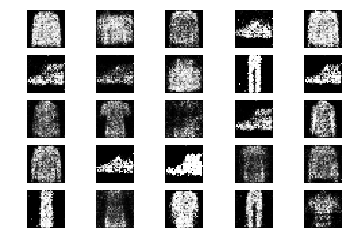

1701 [D loss: 0.626835, acc.: 67.19%] [G loss: 0.843434]
1702 [D loss: 0.733494, acc.: 53.12%] [G loss: 1.004856]
1703 [D loss: 0.670841, acc.: 53.12%] [G loss: 1.022529]
1704 [D loss: 0.641312, acc.: 59.38%] [G loss: 1.022379]
1705 [D loss: 0.685165, acc.: 64.06%] [G loss: 0.899936]
1706 [D loss: 0.580146, acc.: 70.31%] [G loss: 0.891772]
1707 [D loss: 0.594272, acc.: 68.75%] [G loss: 0.919456]
1708 [D loss: 0.718283, acc.: 57.81%] [G loss: 0.889501]
1709 [D loss: 0.591973, acc.: 67.19%] [G loss: 0.913074]
1710 [D loss: 0.620066, acc.: 67.19%] [G loss: 0.942667]
1711 [D loss: 0.610458, acc.: 59.38%] [G loss: 0.939319]
1712 [D loss: 0.638280, acc.: 64.06%] [G loss: 0.878178]
1713 [D loss: 0.678866, acc.: 56.25%] [G loss: 0.941846]
1714 [D loss: 0.710122, acc.: 59.38%] [G loss: 0.860955]
1715 [D loss: 0.648191, acc.: 68.75%] [G loss: 0.942613]
1716 [D loss: 0.625624, acc.: 60.94%] [G loss: 0.963839]
1717 [D loss: 0.635481, acc.: 62.50%] [G loss: 0.961281]
1718 [D loss: 0.673504, acc.: 5

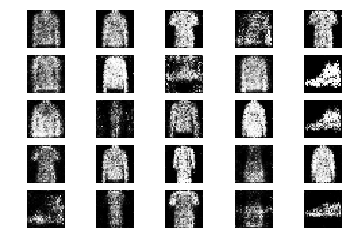

1751 [D loss: 0.667011, acc.: 60.94%] [G loss: 1.017514]
1752 [D loss: 0.643343, acc.: 56.25%] [G loss: 0.902725]
1753 [D loss: 0.681994, acc.: 60.94%] [G loss: 0.897803]
1754 [D loss: 0.588316, acc.: 70.31%] [G loss: 0.898750]
1755 [D loss: 0.667117, acc.: 62.50%] [G loss: 0.857296]
1756 [D loss: 0.665283, acc.: 60.94%] [G loss: 0.854401]
1757 [D loss: 0.689625, acc.: 56.25%] [G loss: 0.973399]
1758 [D loss: 0.641712, acc.: 62.50%] [G loss: 0.894286]
1759 [D loss: 0.624691, acc.: 67.19%] [G loss: 0.876113]
1760 [D loss: 0.645996, acc.: 64.06%] [G loss: 0.802811]
1761 [D loss: 0.700369, acc.: 53.12%] [G loss: 0.868424]
1762 [D loss: 0.629361, acc.: 64.06%] [G loss: 0.880636]
1763 [D loss: 0.671265, acc.: 60.94%] [G loss: 0.903442]
1764 [D loss: 0.627811, acc.: 56.25%] [G loss: 0.881897]
1765 [D loss: 0.644303, acc.: 60.94%] [G loss: 0.866480]
1766 [D loss: 0.679662, acc.: 57.81%] [G loss: 0.840777]
1767 [D loss: 0.615301, acc.: 60.94%] [G loss: 0.820552]
1768 [D loss: 0.697103, acc.: 5

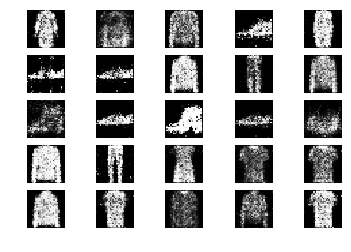

1801 [D loss: 0.632576, acc.: 56.25%] [G loss: 0.929042]
1802 [D loss: 0.639512, acc.: 56.25%] [G loss: 0.874735]
1803 [D loss: 0.696706, acc.: 53.12%] [G loss: 0.865432]
1804 [D loss: 0.704764, acc.: 57.81%] [G loss: 0.909663]
1805 [D loss: 0.611674, acc.: 65.62%] [G loss: 0.893017]
1806 [D loss: 0.719343, acc.: 45.31%] [G loss: 0.906731]
1807 [D loss: 0.655642, acc.: 64.06%] [G loss: 0.965729]
1808 [D loss: 0.662056, acc.: 59.38%] [G loss: 0.892416]
1809 [D loss: 0.656144, acc.: 65.62%] [G loss: 0.888285]
1810 [D loss: 0.652734, acc.: 59.38%] [G loss: 0.903469]
1811 [D loss: 0.641600, acc.: 64.06%] [G loss: 0.957249]
1812 [D loss: 0.625093, acc.: 68.75%] [G loss: 0.895618]
1813 [D loss: 0.674210, acc.: 60.94%] [G loss: 0.838680]
1814 [D loss: 0.654281, acc.: 60.94%] [G loss: 0.908871]
1815 [D loss: 0.604860, acc.: 65.62%] [G loss: 0.909919]
1816 [D loss: 0.609873, acc.: 68.75%] [G loss: 0.852754]
1817 [D loss: 0.627078, acc.: 60.94%] [G loss: 0.929586]
1818 [D loss: 0.600098, acc.: 6

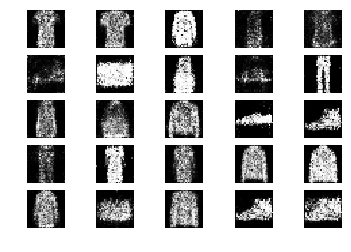

1851 [D loss: 0.640216, acc.: 65.62%] [G loss: 0.879325]
1852 [D loss: 0.674900, acc.: 56.25%] [G loss: 0.928679]
1853 [D loss: 0.645522, acc.: 59.38%] [G loss: 0.921335]
1854 [D loss: 0.651387, acc.: 57.81%] [G loss: 0.977742]
1855 [D loss: 0.560306, acc.: 76.56%] [G loss: 0.887939]
1856 [D loss: 0.623990, acc.: 59.38%] [G loss: 0.852437]
1857 [D loss: 0.647560, acc.: 56.25%] [G loss: 0.873219]
1858 [D loss: 0.609608, acc.: 67.19%] [G loss: 0.941342]
1859 [D loss: 0.684256, acc.: 59.38%] [G loss: 0.828446]
1860 [D loss: 0.704823, acc.: 60.94%] [G loss: 0.844200]
1861 [D loss: 0.670409, acc.: 62.50%] [G loss: 0.905314]
1862 [D loss: 0.602057, acc.: 65.62%] [G loss: 1.001861]
1863 [D loss: 0.646581, acc.: 68.75%] [G loss: 1.016488]
1864 [D loss: 0.624322, acc.: 70.31%] [G loss: 0.961832]
1865 [D loss: 0.565127, acc.: 75.00%] [G loss: 0.951519]
1866 [D loss: 0.678219, acc.: 62.50%] [G loss: 0.942284]
1867 [D loss: 0.665761, acc.: 60.94%] [G loss: 0.862981]
1868 [D loss: 0.648100, acc.: 6

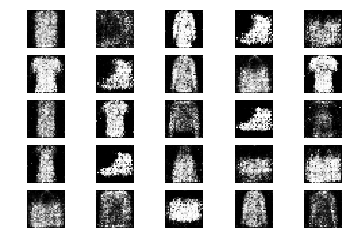

1901 [D loss: 0.661816, acc.: 53.12%] [G loss: 0.886016]
1902 [D loss: 0.623816, acc.: 65.62%] [G loss: 0.960126]
1903 [D loss: 0.606880, acc.: 64.06%] [G loss: 0.990681]
1904 [D loss: 0.675541, acc.: 57.81%] [G loss: 0.973318]
1905 [D loss: 0.631907, acc.: 65.62%] [G loss: 0.939133]
1906 [D loss: 0.621648, acc.: 62.50%] [G loss: 0.946324]
1907 [D loss: 0.610213, acc.: 70.31%] [G loss: 0.913348]
1908 [D loss: 0.668213, acc.: 64.06%] [G loss: 0.902643]
1909 [D loss: 0.646084, acc.: 60.94%] [G loss: 0.813168]
1910 [D loss: 0.667986, acc.: 60.94%] [G loss: 0.874601]
1911 [D loss: 0.675228, acc.: 60.94%] [G loss: 0.834575]
1912 [D loss: 0.671134, acc.: 60.94%] [G loss: 0.842284]
1913 [D loss: 0.695533, acc.: 56.25%] [G loss: 0.891597]
1914 [D loss: 0.583578, acc.: 71.88%] [G loss: 0.944864]
1915 [D loss: 0.618444, acc.: 68.75%] [G loss: 0.935881]
1916 [D loss: 0.596095, acc.: 75.00%] [G loss: 0.910770]
1917 [D loss: 0.595267, acc.: 71.88%] [G loss: 0.839690]
1918 [D loss: 0.610951, acc.: 6

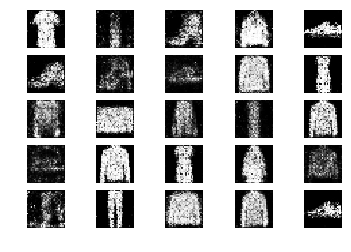

1951 [D loss: 0.608686, acc.: 64.06%] [G loss: 0.873082]
1952 [D loss: 0.598450, acc.: 70.31%] [G loss: 0.802019]
1953 [D loss: 0.654034, acc.: 60.94%] [G loss: 0.802730]
1954 [D loss: 0.688896, acc.: 56.25%] [G loss: 0.851345]
1955 [D loss: 0.650426, acc.: 62.50%] [G loss: 0.871953]
1956 [D loss: 0.701732, acc.: 57.81%] [G loss: 0.914214]
1957 [D loss: 0.582501, acc.: 70.31%] [G loss: 0.900395]
1958 [D loss: 0.585039, acc.: 65.62%] [G loss: 0.948598]
1959 [D loss: 0.599720, acc.: 70.31%] [G loss: 0.967201]
1960 [D loss: 0.648629, acc.: 60.94%] [G loss: 0.925998]
1961 [D loss: 0.602895, acc.: 60.94%] [G loss: 1.046802]
1962 [D loss: 0.629337, acc.: 57.81%] [G loss: 0.916304]
1963 [D loss: 0.672209, acc.: 54.69%] [G loss: 0.870687]
1964 [D loss: 0.622965, acc.: 60.94%] [G loss: 0.911537]
1965 [D loss: 0.658370, acc.: 62.50%] [G loss: 0.818641]
1966 [D loss: 0.634320, acc.: 65.62%] [G loss: 0.968959]
1967 [D loss: 0.631461, acc.: 60.94%] [G loss: 0.889430]
1968 [D loss: 0.571005, acc.: 7

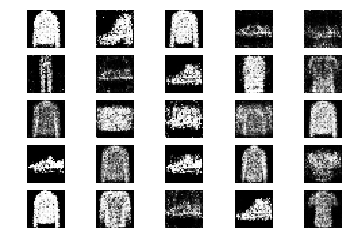

2001 [D loss: 0.645442, acc.: 64.06%] [G loss: 0.937115]
2002 [D loss: 0.684036, acc.: 56.25%] [G loss: 0.898996]
2003 [D loss: 0.712432, acc.: 46.88%] [G loss: 0.796680]
2004 [D loss: 0.683591, acc.: 57.81%] [G loss: 0.904523]
2005 [D loss: 0.569445, acc.: 71.88%] [G loss: 0.885832]
2006 [D loss: 0.635119, acc.: 68.75%] [G loss: 0.975398]
2007 [D loss: 0.681165, acc.: 62.50%] [G loss: 0.972117]
2008 [D loss: 0.635303, acc.: 67.19%] [G loss: 0.835900]
2009 [D loss: 0.692222, acc.: 53.12%] [G loss: 0.906524]
2010 [D loss: 0.637725, acc.: 71.88%] [G loss: 0.857254]
2011 [D loss: 0.636813, acc.: 62.50%] [G loss: 0.800014]
2012 [D loss: 0.659640, acc.: 64.06%] [G loss: 0.933226]
2013 [D loss: 0.592769, acc.: 73.44%] [G loss: 0.904052]
2014 [D loss: 0.619845, acc.: 65.62%] [G loss: 0.837305]
2015 [D loss: 0.686835, acc.: 60.94%] [G loss: 0.918857]
2016 [D loss: 0.707368, acc.: 57.81%] [G loss: 0.869535]
2017 [D loss: 0.676666, acc.: 59.38%] [G loss: 0.916915]
2018 [D loss: 0.642248, acc.: 5

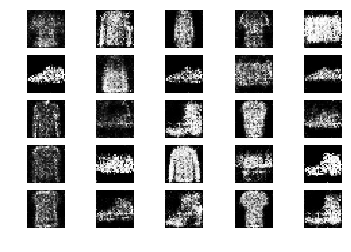

2051 [D loss: 0.657514, acc.: 62.50%] [G loss: 0.846237]
2052 [D loss: 0.640393, acc.: 62.50%] [G loss: 0.912582]
2053 [D loss: 0.671461, acc.: 62.50%] [G loss: 0.945189]
2054 [D loss: 0.650644, acc.: 62.50%] [G loss: 0.956081]
2055 [D loss: 0.577431, acc.: 73.44%] [G loss: 0.849362]
2056 [D loss: 0.693413, acc.: 54.69%] [G loss: 0.921014]
2057 [D loss: 0.672506, acc.: 59.38%] [G loss: 1.011327]
2058 [D loss: 0.698228, acc.: 53.12%] [G loss: 0.927158]
2059 [D loss: 0.664408, acc.: 57.81%] [G loss: 0.949220]
2060 [D loss: 0.611473, acc.: 68.75%] [G loss: 0.927300]
2061 [D loss: 0.605353, acc.: 71.88%] [G loss: 1.046903]
2062 [D loss: 0.619680, acc.: 67.19%] [G loss: 0.874123]
2063 [D loss: 0.714886, acc.: 59.38%] [G loss: 0.943801]
2064 [D loss: 0.597946, acc.: 65.62%] [G loss: 0.914570]
2065 [D loss: 0.680001, acc.: 59.38%] [G loss: 0.994974]
2066 [D loss: 0.577830, acc.: 70.31%] [G loss: 0.965705]
2067 [D loss: 0.682034, acc.: 64.06%] [G loss: 0.953889]
2068 [D loss: 0.601535, acc.: 7

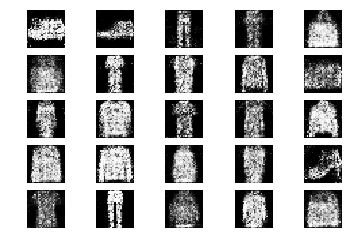

2101 [D loss: 0.712013, acc.: 56.25%] [G loss: 0.956880]
2102 [D loss: 0.674456, acc.: 60.94%] [G loss: 0.911713]
2103 [D loss: 0.618868, acc.: 67.19%] [G loss: 0.908502]
2104 [D loss: 0.692714, acc.: 57.81%] [G loss: 0.841816]
2105 [D loss: 0.635505, acc.: 60.94%] [G loss: 0.845002]
2106 [D loss: 0.701241, acc.: 51.56%] [G loss: 0.899384]
2107 [D loss: 0.631903, acc.: 62.50%] [G loss: 0.894037]
2108 [D loss: 0.651687, acc.: 59.38%] [G loss: 0.969768]
2109 [D loss: 0.697748, acc.: 59.38%] [G loss: 0.843362]
2110 [D loss: 0.688955, acc.: 62.50%] [G loss: 0.823329]
2111 [D loss: 0.651764, acc.: 64.06%] [G loss: 0.841839]
2112 [D loss: 0.679686, acc.: 59.38%] [G loss: 0.831974]
2113 [D loss: 0.707410, acc.: 45.31%] [G loss: 0.799056]
2114 [D loss: 0.615306, acc.: 64.06%] [G loss: 0.913772]
2115 [D loss: 0.632546, acc.: 60.94%] [G loss: 0.953199]
2116 [D loss: 0.681244, acc.: 54.69%] [G loss: 0.862782]
2117 [D loss: 0.650518, acc.: 62.50%] [G loss: 0.894524]
2118 [D loss: 0.610146, acc.: 6

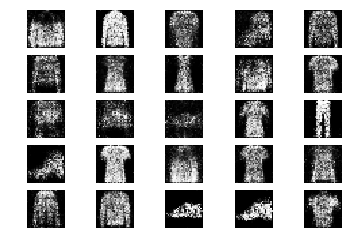

2151 [D loss: 0.703249, acc.: 42.19%] [G loss: 0.997835]
2152 [D loss: 0.591998, acc.: 65.62%] [G loss: 0.939155]
2153 [D loss: 0.650709, acc.: 57.81%] [G loss: 0.913090]
2154 [D loss: 0.639790, acc.: 71.88%] [G loss: 0.859629]
2155 [D loss: 0.652604, acc.: 60.94%] [G loss: 0.887068]
2156 [D loss: 0.615812, acc.: 60.94%] [G loss: 0.910439]
2157 [D loss: 0.634943, acc.: 64.06%] [G loss: 0.951410]
2158 [D loss: 0.683078, acc.: 64.06%] [G loss: 0.958872]
2159 [D loss: 0.631856, acc.: 64.06%] [G loss: 0.989777]
2160 [D loss: 0.674307, acc.: 56.25%] [G loss: 0.944903]
2161 [D loss: 0.644631, acc.: 64.06%] [G loss: 0.863226]
2162 [D loss: 0.686355, acc.: 60.94%] [G loss: 0.866147]
2163 [D loss: 0.656411, acc.: 56.25%] [G loss: 0.786516]
2164 [D loss: 0.596983, acc.: 73.44%] [G loss: 0.916455]
2165 [D loss: 0.673851, acc.: 51.56%] [G loss: 0.988589]
2166 [D loss: 0.636532, acc.: 60.94%] [G loss: 0.980827]
2167 [D loss: 0.615397, acc.: 75.00%] [G loss: 0.897950]
2168 [D loss: 0.636627, acc.: 6

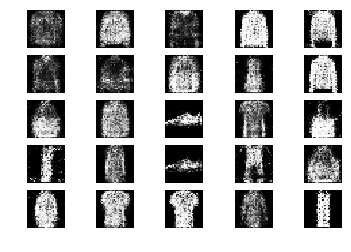

2201 [D loss: 0.562694, acc.: 75.00%] [G loss: 0.865234]
2202 [D loss: 0.621893, acc.: 71.88%] [G loss: 0.955569]
2203 [D loss: 0.653783, acc.: 60.94%] [G loss: 1.004123]
2204 [D loss: 0.594058, acc.: 65.62%] [G loss: 0.949382]
2205 [D loss: 0.633788, acc.: 64.06%] [G loss: 0.945702]
2206 [D loss: 0.644241, acc.: 67.19%] [G loss: 0.870375]
2207 [D loss: 0.704790, acc.: 59.38%] [G loss: 0.852274]
2208 [D loss: 0.693235, acc.: 53.12%] [G loss: 0.802218]
2209 [D loss: 0.598053, acc.: 73.44%] [G loss: 1.053407]
2210 [D loss: 0.595213, acc.: 78.12%] [G loss: 0.921510]
2211 [D loss: 0.672166, acc.: 62.50%] [G loss: 0.953116]
2212 [D loss: 0.618363, acc.: 60.94%] [G loss: 0.974389]
2213 [D loss: 0.690104, acc.: 60.94%] [G loss: 0.926413]
2214 [D loss: 0.671340, acc.: 62.50%] [G loss: 0.915380]
2215 [D loss: 0.662973, acc.: 57.81%] [G loss: 0.892912]
2216 [D loss: 0.650280, acc.: 59.38%] [G loss: 1.049628]
2217 [D loss: 0.712462, acc.: 54.69%] [G loss: 1.035643]
2218 [D loss: 0.696807, acc.: 5

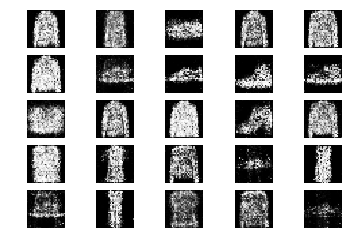

2251 [D loss: 0.643695, acc.: 53.12%] [G loss: 0.914674]
2252 [D loss: 0.616001, acc.: 67.19%] [G loss: 0.839128]
2253 [D loss: 0.608679, acc.: 67.19%] [G loss: 0.910684]
2254 [D loss: 0.657949, acc.: 57.81%] [G loss: 0.922060]
2255 [D loss: 0.582962, acc.: 76.56%] [G loss: 0.947730]
2256 [D loss: 0.558098, acc.: 75.00%] [G loss: 0.929892]
2257 [D loss: 0.596366, acc.: 68.75%] [G loss: 0.949156]
2258 [D loss: 0.625843, acc.: 67.19%] [G loss: 0.991196]
2259 [D loss: 0.652786, acc.: 60.94%] [G loss: 0.911901]
2260 [D loss: 0.635675, acc.: 59.38%] [G loss: 0.974167]
2261 [D loss: 0.628930, acc.: 68.75%] [G loss: 0.965696]
2262 [D loss: 0.677711, acc.: 57.81%] [G loss: 0.952644]
2263 [D loss: 0.640536, acc.: 65.62%] [G loss: 0.978702]
2264 [D loss: 0.658708, acc.: 60.94%] [G loss: 0.934724]
2265 [D loss: 0.636872, acc.: 60.94%] [G loss: 0.925280]
2266 [D loss: 0.578897, acc.: 70.31%] [G loss: 0.890347]
2267 [D loss: 0.628588, acc.: 65.62%] [G loss: 0.951331]
2268 [D loss: 0.626984, acc.: 6

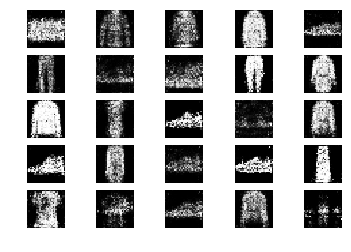

2301 [D loss: 0.639714, acc.: 57.81%] [G loss: 0.923284]
2302 [D loss: 0.635358, acc.: 70.31%] [G loss: 0.919499]
2303 [D loss: 0.629751, acc.: 62.50%] [G loss: 1.072092]
2304 [D loss: 0.638113, acc.: 62.50%] [G loss: 1.034388]
2305 [D loss: 0.674244, acc.: 59.38%] [G loss: 0.981374]
2306 [D loss: 0.667351, acc.: 60.94%] [G loss: 0.899428]
2307 [D loss: 0.646682, acc.: 64.06%] [G loss: 0.872578]
2308 [D loss: 0.628674, acc.: 67.19%] [G loss: 0.903682]
2309 [D loss: 0.727581, acc.: 51.56%] [G loss: 0.894655]
2310 [D loss: 0.646974, acc.: 64.06%] [G loss: 0.820130]
2311 [D loss: 0.693913, acc.: 53.12%] [G loss: 0.953882]
2312 [D loss: 0.627004, acc.: 67.19%] [G loss: 0.889329]
2313 [D loss: 0.663510, acc.: 68.75%] [G loss: 0.884744]
2314 [D loss: 0.674989, acc.: 60.94%] [G loss: 0.924297]
2315 [D loss: 0.718879, acc.: 59.38%] [G loss: 0.896243]
2316 [D loss: 0.662051, acc.: 60.94%] [G loss: 0.892987]
2317 [D loss: 0.628101, acc.: 70.31%] [G loss: 0.880662]
2318 [D loss: 0.660509, acc.: 6

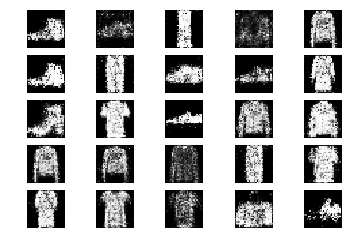

2351 [D loss: 0.585440, acc.: 68.75%] [G loss: 1.003318]
2352 [D loss: 0.664875, acc.: 60.94%] [G loss: 1.034279]
2353 [D loss: 0.594715, acc.: 65.62%] [G loss: 0.908807]
2354 [D loss: 0.646194, acc.: 71.88%] [G loss: 0.930728]
2355 [D loss: 0.624604, acc.: 67.19%] [G loss: 0.984479]
2356 [D loss: 0.646877, acc.: 67.19%] [G loss: 0.923719]
2357 [D loss: 0.633265, acc.: 65.62%] [G loss: 0.889778]
2358 [D loss: 0.639761, acc.: 65.62%] [G loss: 0.916382]
2359 [D loss: 0.651034, acc.: 54.69%] [G loss: 0.855487]
2360 [D loss: 0.674560, acc.: 57.81%] [G loss: 0.859362]
2361 [D loss: 0.643387, acc.: 71.88%] [G loss: 0.872876]
2362 [D loss: 0.634915, acc.: 65.62%] [G loss: 0.850712]
2363 [D loss: 0.605500, acc.: 62.50%] [G loss: 0.856772]
2364 [D loss: 0.711914, acc.: 48.44%] [G loss: 0.862955]
2365 [D loss: 0.614242, acc.: 67.19%] [G loss: 0.980386]
2366 [D loss: 0.620440, acc.: 65.62%] [G loss: 0.948162]
2367 [D loss: 0.661472, acc.: 54.69%] [G loss: 0.890786]
2368 [D loss: 0.722624, acc.: 4

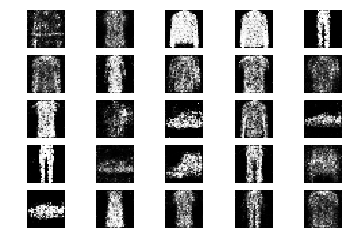

2401 [D loss: 0.711833, acc.: 59.38%] [G loss: 0.918399]
2402 [D loss: 0.613244, acc.: 65.62%] [G loss: 0.934126]
2403 [D loss: 0.672985, acc.: 57.81%] [G loss: 0.861269]
2404 [D loss: 0.693982, acc.: 46.88%] [G loss: 0.967068]
2405 [D loss: 0.602919, acc.: 68.75%] [G loss: 0.925226]
2406 [D loss: 0.639419, acc.: 68.75%] [G loss: 0.987027]
2407 [D loss: 0.697038, acc.: 53.12%] [G loss: 0.943701]
2408 [D loss: 0.662488, acc.: 54.69%] [G loss: 0.884775]
2409 [D loss: 0.660263, acc.: 62.50%] [G loss: 0.940246]
2410 [D loss: 0.628620, acc.: 67.19%] [G loss: 0.906629]
2411 [D loss: 0.636300, acc.: 60.94%] [G loss: 0.991825]
2412 [D loss: 0.709921, acc.: 53.12%] [G loss: 0.859463]
2413 [D loss: 0.616652, acc.: 67.19%] [G loss: 0.926123]
2414 [D loss: 0.642208, acc.: 60.94%] [G loss: 0.911651]
2415 [D loss: 0.603809, acc.: 65.62%] [G loss: 0.859971]
2416 [D loss: 0.606954, acc.: 65.62%] [G loss: 0.943687]
2417 [D loss: 0.595070, acc.: 75.00%] [G loss: 0.896413]
2418 [D loss: 0.591091, acc.: 6

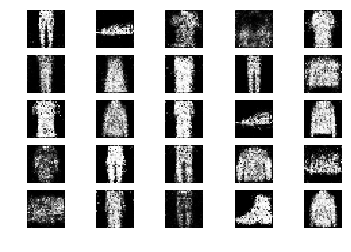

2451 [D loss: 0.611189, acc.: 71.88%] [G loss: 0.951592]
2452 [D loss: 0.638437, acc.: 65.62%] [G loss: 0.919178]
2453 [D loss: 0.629906, acc.: 65.62%] [G loss: 0.870491]
2454 [D loss: 0.594957, acc.: 67.19%] [G loss: 0.889498]
2455 [D loss: 0.608422, acc.: 70.31%] [G loss: 0.955933]
2456 [D loss: 0.655873, acc.: 56.25%] [G loss: 0.804027]
2457 [D loss: 0.668389, acc.: 56.25%] [G loss: 0.844988]
2458 [D loss: 0.670676, acc.: 54.69%] [G loss: 1.015300]
2459 [D loss: 0.530755, acc.: 82.81%] [G loss: 1.052051]
2460 [D loss: 0.671109, acc.: 60.94%] [G loss: 1.063113]
2461 [D loss: 0.622397, acc.: 62.50%] [G loss: 1.030962]
2462 [D loss: 0.694297, acc.: 50.00%] [G loss: 0.928871]
2463 [D loss: 0.664404, acc.: 65.62%] [G loss: 0.838224]
2464 [D loss: 0.617242, acc.: 68.75%] [G loss: 0.885015]
2465 [D loss: 0.692292, acc.: 51.56%] [G loss: 0.869952]
2466 [D loss: 0.625442, acc.: 64.06%] [G loss: 0.914383]
2467 [D loss: 0.613090, acc.: 62.50%] [G loss: 1.019434]
2468 [D loss: 0.629847, acc.: 6

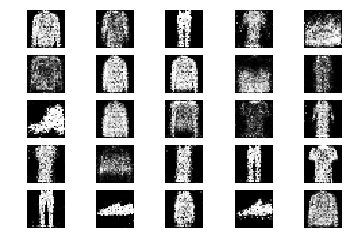

2501 [D loss: 0.664148, acc.: 57.81%] [G loss: 0.978117]
2502 [D loss: 0.585916, acc.: 73.44%] [G loss: 0.944288]
2503 [D loss: 0.649748, acc.: 60.94%] [G loss: 0.870694]
2504 [D loss: 0.656321, acc.: 57.81%] [G loss: 1.013362]
2505 [D loss: 0.624733, acc.: 65.62%] [G loss: 0.886889]
2506 [D loss: 0.644923, acc.: 68.75%] [G loss: 0.929399]
2507 [D loss: 0.684155, acc.: 54.69%] [G loss: 0.878706]
2508 [D loss: 0.658845, acc.: 64.06%] [G loss: 0.911582]
2509 [D loss: 0.697912, acc.: 56.25%] [G loss: 0.933406]
2510 [D loss: 0.649774, acc.: 60.94%] [G loss: 0.951046]
2511 [D loss: 0.644197, acc.: 65.62%] [G loss: 1.033972]
2512 [D loss: 0.670872, acc.: 57.81%] [G loss: 0.956417]
2513 [D loss: 0.656995, acc.: 60.94%] [G loss: 0.958328]
2514 [D loss: 0.630073, acc.: 57.81%] [G loss: 0.947937]
2515 [D loss: 0.655687, acc.: 57.81%] [G loss: 0.920094]
2516 [D loss: 0.640969, acc.: 56.25%] [G loss: 0.929269]
2517 [D loss: 0.603726, acc.: 57.81%] [G loss: 0.842503]
2518 [D loss: 0.626593, acc.: 6

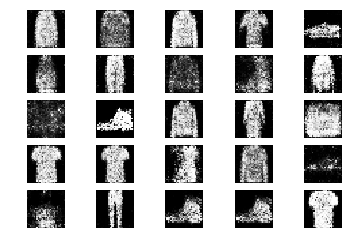

2551 [D loss: 0.626622, acc.: 59.38%] [G loss: 0.951322]
2552 [D loss: 0.761053, acc.: 46.88%] [G loss: 0.893690]
2553 [D loss: 0.622843, acc.: 65.62%] [G loss: 0.896212]
2554 [D loss: 0.612981, acc.: 60.94%] [G loss: 0.929310]
2555 [D loss: 0.682519, acc.: 59.38%] [G loss: 0.899739]
2556 [D loss: 0.699007, acc.: 54.69%] [G loss: 0.891370]
2557 [D loss: 0.636844, acc.: 67.19%] [G loss: 0.894769]
2558 [D loss: 0.614464, acc.: 76.56%] [G loss: 0.939037]
2559 [D loss: 0.664773, acc.: 59.38%] [G loss: 1.043401]
2560 [D loss: 0.700138, acc.: 56.25%] [G loss: 0.984263]
2561 [D loss: 0.592785, acc.: 73.44%] [G loss: 1.030315]
2562 [D loss: 0.631759, acc.: 64.06%] [G loss: 1.050575]
2563 [D loss: 0.662939, acc.: 53.12%] [G loss: 0.942404]
2564 [D loss: 0.667407, acc.: 59.38%] [G loss: 1.004319]
2565 [D loss: 0.602546, acc.: 68.75%] [G loss: 1.010499]
2566 [D loss: 0.561068, acc.: 73.44%] [G loss: 0.966349]
2567 [D loss: 0.718868, acc.: 53.12%] [G loss: 0.940342]
2568 [D loss: 0.696505, acc.: 4

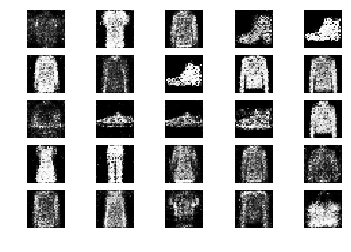

2601 [D loss: 0.650497, acc.: 56.25%] [G loss: 0.912173]
2602 [D loss: 0.608625, acc.: 62.50%] [G loss: 0.900094]
2603 [D loss: 0.691480, acc.: 56.25%] [G loss: 0.845396]
2604 [D loss: 0.587167, acc.: 75.00%] [G loss: 0.917680]
2605 [D loss: 0.693660, acc.: 65.62%] [G loss: 1.002422]
2606 [D loss: 0.587201, acc.: 70.31%] [G loss: 0.975838]
2607 [D loss: 0.643486, acc.: 59.38%] [G loss: 1.000292]
2608 [D loss: 0.726996, acc.: 56.25%] [G loss: 0.978990]
2609 [D loss: 0.614083, acc.: 68.75%] [G loss: 0.898569]
2610 [D loss: 0.715762, acc.: 51.56%] [G loss: 1.006278]
2611 [D loss: 0.701137, acc.: 54.69%] [G loss: 0.958805]
2612 [D loss: 0.688564, acc.: 68.75%] [G loss: 0.906318]
2613 [D loss: 0.671583, acc.: 60.94%] [G loss: 0.901540]
2614 [D loss: 0.617805, acc.: 67.19%] [G loss: 0.985318]
2615 [D loss: 0.683878, acc.: 54.69%] [G loss: 0.873157]
2616 [D loss: 0.563339, acc.: 78.12%] [G loss: 0.950751]
2617 [D loss: 0.625303, acc.: 57.81%] [G loss: 0.910725]
2618 [D loss: 0.648719, acc.: 6

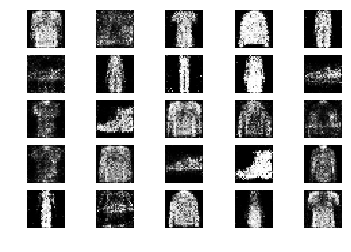

2651 [D loss: 0.640006, acc.: 62.50%] [G loss: 1.050031]
2652 [D loss: 0.704356, acc.: 57.81%] [G loss: 1.017410]
2653 [D loss: 0.612072, acc.: 73.44%] [G loss: 0.952947]
2654 [D loss: 0.603137, acc.: 67.19%] [G loss: 0.892432]
2655 [D loss: 0.644475, acc.: 62.50%] [G loss: 0.989798]
2656 [D loss: 0.643318, acc.: 57.81%] [G loss: 0.886398]
2657 [D loss: 0.648915, acc.: 68.75%] [G loss: 0.903628]
2658 [D loss: 0.622198, acc.: 68.75%] [G loss: 0.877319]
2659 [D loss: 0.632855, acc.: 64.06%] [G loss: 0.899489]
2660 [D loss: 0.686199, acc.: 60.94%] [G loss: 0.833552]
2661 [D loss: 0.658129, acc.: 56.25%] [G loss: 0.913342]
2662 [D loss: 0.636989, acc.: 62.50%] [G loss: 0.934065]
2663 [D loss: 0.647509, acc.: 64.06%] [G loss: 1.012447]
2664 [D loss: 0.686639, acc.: 57.81%] [G loss: 0.881676]
2665 [D loss: 0.622372, acc.: 62.50%] [G loss: 0.961376]
2666 [D loss: 0.653074, acc.: 68.75%] [G loss: 0.925802]
2667 [D loss: 0.569568, acc.: 70.31%] [G loss: 0.866645]
2668 [D loss: 0.673110, acc.: 5

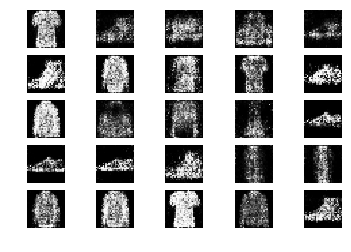

2701 [D loss: 0.608414, acc.: 68.75%] [G loss: 0.969997]
2702 [D loss: 0.622811, acc.: 64.06%] [G loss: 0.917606]
2703 [D loss: 0.582451, acc.: 71.88%] [G loss: 0.990513]
2704 [D loss: 0.629083, acc.: 68.75%] [G loss: 0.979015]
2705 [D loss: 0.583743, acc.: 75.00%] [G loss: 1.007908]
2706 [D loss: 0.677292, acc.: 57.81%] [G loss: 0.947736]
2707 [D loss: 0.633594, acc.: 70.31%] [G loss: 0.962776]
2708 [D loss: 0.682383, acc.: 53.12%] [G loss: 0.842685]
2709 [D loss: 0.598889, acc.: 67.19%] [G loss: 0.988931]
2710 [D loss: 0.671553, acc.: 56.25%] [G loss: 0.886206]
2711 [D loss: 0.661277, acc.: 54.69%] [G loss: 0.810253]
2712 [D loss: 0.670399, acc.: 62.50%] [G loss: 0.794193]
2713 [D loss: 0.606237, acc.: 70.31%] [G loss: 0.909287]
2714 [D loss: 0.597862, acc.: 62.50%] [G loss: 1.014900]
2715 [D loss: 0.646440, acc.: 65.62%] [G loss: 0.967006]
2716 [D loss: 0.730518, acc.: 53.12%] [G loss: 0.973435]
2717 [D loss: 0.637084, acc.: 59.38%] [G loss: 0.980160]
2718 [D loss: 0.647758, acc.: 6

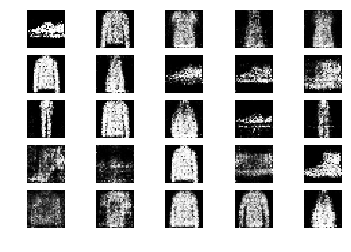

2751 [D loss: 0.541690, acc.: 81.25%] [G loss: 0.973935]
2752 [D loss: 0.680644, acc.: 56.25%] [G loss: 0.874966]
2753 [D loss: 0.663407, acc.: 62.50%] [G loss: 0.920712]
2754 [D loss: 0.696361, acc.: 59.38%] [G loss: 0.918848]
2755 [D loss: 0.602216, acc.: 65.62%] [G loss: 0.857751]
2756 [D loss: 0.705459, acc.: 50.00%] [G loss: 0.957298]
2757 [D loss: 0.615192, acc.: 65.62%] [G loss: 0.968018]
2758 [D loss: 0.680674, acc.: 62.50%] [G loss: 0.895579]
2759 [D loss: 0.569673, acc.: 71.88%] [G loss: 0.913982]
2760 [D loss: 0.720187, acc.: 50.00%] [G loss: 0.900687]
2761 [D loss: 0.541879, acc.: 82.81%] [G loss: 0.802126]
2762 [D loss: 0.706503, acc.: 54.69%] [G loss: 0.850048]
2763 [D loss: 0.618941, acc.: 62.50%] [G loss: 0.929051]
2764 [D loss: 0.616997, acc.: 65.62%] [G loss: 0.899278]
2765 [D loss: 0.665416, acc.: 62.50%] [G loss: 0.942943]
2766 [D loss: 0.699074, acc.: 46.88%] [G loss: 0.894887]
2767 [D loss: 0.606574, acc.: 67.19%] [G loss: 0.975655]
2768 [D loss: 0.636568, acc.: 6

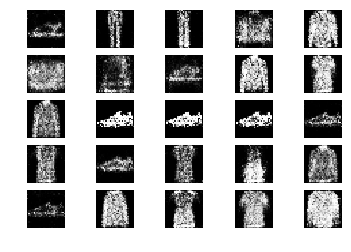

2801 [D loss: 0.638617, acc.: 59.38%] [G loss: 0.940395]
2802 [D loss: 0.642431, acc.: 73.44%] [G loss: 0.912515]
2803 [D loss: 0.708964, acc.: 51.56%] [G loss: 0.892357]
2804 [D loss: 0.607860, acc.: 73.44%] [G loss: 0.983244]
2805 [D loss: 0.682481, acc.: 57.81%] [G loss: 0.835922]
2806 [D loss: 0.609557, acc.: 62.50%] [G loss: 0.907908]
2807 [D loss: 0.680838, acc.: 62.50%] [G loss: 0.883338]
2808 [D loss: 0.684465, acc.: 57.81%] [G loss: 0.947651]
2809 [D loss: 0.692280, acc.: 59.38%] [G loss: 0.971900]
2810 [D loss: 0.625543, acc.: 64.06%] [G loss: 0.861944]
2811 [D loss: 0.674882, acc.: 53.12%] [G loss: 0.895796]
2812 [D loss: 0.618284, acc.: 60.94%] [G loss: 0.963228]
2813 [D loss: 0.658370, acc.: 64.06%] [G loss: 0.915684]
2814 [D loss: 0.628822, acc.: 65.62%] [G loss: 0.895366]
2815 [D loss: 0.628591, acc.: 70.31%] [G loss: 0.898342]
2816 [D loss: 0.716036, acc.: 48.44%] [G loss: 0.973019]
2817 [D loss: 0.661204, acc.: 59.38%] [G loss: 0.959541]
2818 [D loss: 0.645430, acc.: 6

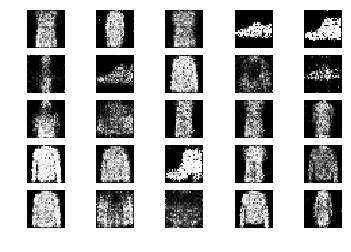

2851 [D loss: 0.636488, acc.: 64.06%] [G loss: 0.873077]
2852 [D loss: 0.713774, acc.: 56.25%] [G loss: 1.003164]
2853 [D loss: 0.598976, acc.: 73.44%] [G loss: 0.897018]
2854 [D loss: 0.629828, acc.: 59.38%] [G loss: 0.947880]
2855 [D loss: 0.647603, acc.: 67.19%] [G loss: 0.934676]
2856 [D loss: 0.635376, acc.: 62.50%] [G loss: 0.901604]
2857 [D loss: 0.607189, acc.: 73.44%] [G loss: 0.957030]
2858 [D loss: 0.683930, acc.: 56.25%] [G loss: 0.977712]
2859 [D loss: 0.611247, acc.: 67.19%] [G loss: 0.950172]
2860 [D loss: 0.634365, acc.: 60.94%] [G loss: 0.980661]
2861 [D loss: 0.691930, acc.: 53.12%] [G loss: 0.978653]
2862 [D loss: 0.634290, acc.: 70.31%] [G loss: 0.947918]
2863 [D loss: 0.654431, acc.: 64.06%] [G loss: 0.991255]
2864 [D loss: 0.668794, acc.: 57.81%] [G loss: 0.891553]
2865 [D loss: 0.640783, acc.: 59.38%] [G loss: 0.895645]
2866 [D loss: 0.653066, acc.: 64.06%] [G loss: 0.923666]
2867 [D loss: 0.594622, acc.: 65.62%] [G loss: 0.966451]
2868 [D loss: 0.640053, acc.: 6

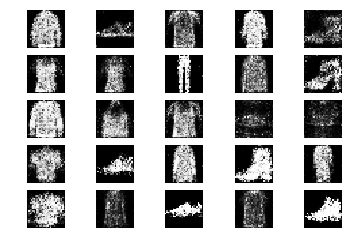

2901 [D loss: 0.667659, acc.: 54.69%] [G loss: 0.946093]
2902 [D loss: 0.683966, acc.: 54.69%] [G loss: 0.921272]
2903 [D loss: 0.614051, acc.: 67.19%] [G loss: 0.940383]
2904 [D loss: 0.655383, acc.: 56.25%] [G loss: 0.944142]
2905 [D loss: 0.641005, acc.: 59.38%] [G loss: 0.931212]
2906 [D loss: 0.634772, acc.: 70.31%] [G loss: 0.876354]
2907 [D loss: 0.652532, acc.: 70.31%] [G loss: 0.912975]
2908 [D loss: 0.654433, acc.: 59.38%] [G loss: 0.820066]
2909 [D loss: 0.561861, acc.: 73.44%] [G loss: 0.904005]
2910 [D loss: 0.669339, acc.: 64.06%] [G loss: 0.853905]
2911 [D loss: 0.610712, acc.: 67.19%] [G loss: 0.927280]
2912 [D loss: 0.570746, acc.: 68.75%] [G loss: 0.869256]
2913 [D loss: 0.601818, acc.: 75.00%] [G loss: 0.901829]
2914 [D loss: 0.625669, acc.: 62.50%] [G loss: 0.932205]
2915 [D loss: 0.647844, acc.: 59.38%] [G loss: 0.826595]
2916 [D loss: 0.639194, acc.: 54.69%] [G loss: 0.910187]
2917 [D loss: 0.659001, acc.: 56.25%] [G loss: 0.839543]
2918 [D loss: 0.677177, acc.: 5

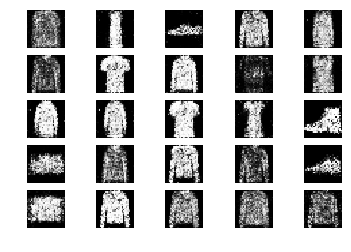

2951 [D loss: 0.646626, acc.: 62.50%] [G loss: 0.936939]
2952 [D loss: 0.737563, acc.: 53.12%] [G loss: 0.960978]
2953 [D loss: 0.690794, acc.: 54.69%] [G loss: 0.953551]
2954 [D loss: 0.625977, acc.: 65.62%] [G loss: 0.931821]
2955 [D loss: 0.632211, acc.: 62.50%] [G loss: 0.894828]
2956 [D loss: 0.600051, acc.: 75.00%] [G loss: 0.840308]
2957 [D loss: 0.616511, acc.: 67.19%] [G loss: 0.947146]
2958 [D loss: 0.651036, acc.: 62.50%] [G loss: 0.922908]
2959 [D loss: 0.612170, acc.: 67.19%] [G loss: 0.954576]
2960 [D loss: 0.642582, acc.: 60.94%] [G loss: 0.995706]
2961 [D loss: 0.690186, acc.: 57.81%] [G loss: 0.940949]
2962 [D loss: 0.639059, acc.: 62.50%] [G loss: 0.884437]
2963 [D loss: 0.650636, acc.: 65.62%] [G loss: 0.980952]
2964 [D loss: 0.625638, acc.: 67.19%] [G loss: 0.841923]
2965 [D loss: 0.692604, acc.: 53.12%] [G loss: 0.932703]
2966 [D loss: 0.584292, acc.: 67.19%] [G loss: 0.864640]
2967 [D loss: 0.660320, acc.: 64.06%] [G loss: 0.836217]
2968 [D loss: 0.654978, acc.: 5

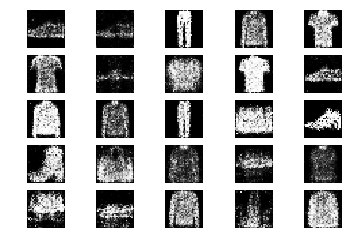

3001 [D loss: 0.680132, acc.: 51.56%] [G loss: 0.951934]
3002 [D loss: 0.673040, acc.: 59.38%] [G loss: 0.826695]
3003 [D loss: 0.613921, acc.: 62.50%] [G loss: 0.909525]
3004 [D loss: 0.639575, acc.: 57.81%] [G loss: 0.815379]
3005 [D loss: 0.656723, acc.: 56.25%] [G loss: 0.833661]
3006 [D loss: 0.676275, acc.: 53.12%] [G loss: 0.880845]
3007 [D loss: 0.604989, acc.: 73.44%] [G loss: 0.890288]
3008 [D loss: 0.630277, acc.: 62.50%] [G loss: 0.902322]
3009 [D loss: 0.602481, acc.: 65.62%] [G loss: 0.935513]
3010 [D loss: 0.598427, acc.: 68.75%] [G loss: 0.894186]
3011 [D loss: 0.689172, acc.: 62.50%] [G loss: 1.009005]
3012 [D loss: 0.591895, acc.: 67.19%] [G loss: 0.927022]
3013 [D loss: 0.675907, acc.: 62.50%] [G loss: 0.964683]
3014 [D loss: 0.687216, acc.: 54.69%] [G loss: 0.970992]
3015 [D loss: 0.625483, acc.: 60.94%] [G loss: 0.864414]
3016 [D loss: 0.640628, acc.: 65.62%] [G loss: 0.932162]
3017 [D loss: 0.633178, acc.: 65.62%] [G loss: 0.869175]
3018 [D loss: 0.629668, acc.: 5

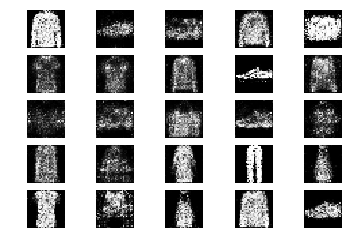

3051 [D loss: 0.728735, acc.: 54.69%] [G loss: 0.887823]
3052 [D loss: 0.640038, acc.: 62.50%] [G loss: 0.920191]
3053 [D loss: 0.631431, acc.: 64.06%] [G loss: 0.886166]
3054 [D loss: 0.660177, acc.: 57.81%] [G loss: 0.890673]
3055 [D loss: 0.614580, acc.: 68.75%] [G loss: 0.941700]
3056 [D loss: 0.616227, acc.: 60.94%] [G loss: 0.921455]
3057 [D loss: 0.587951, acc.: 79.69%] [G loss: 0.959595]
3058 [D loss: 0.622084, acc.: 67.19%] [G loss: 0.894864]
3059 [D loss: 0.680137, acc.: 64.06%] [G loss: 0.945144]
3060 [D loss: 0.614962, acc.: 60.94%] [G loss: 0.904881]
3061 [D loss: 0.598920, acc.: 71.88%] [G loss: 0.920395]
3062 [D loss: 0.647144, acc.: 65.62%] [G loss: 0.908421]
3063 [D loss: 0.633865, acc.: 64.06%] [G loss: 0.892076]
3064 [D loss: 0.627834, acc.: 64.06%] [G loss: 0.971818]
3065 [D loss: 0.626456, acc.: 73.44%] [G loss: 0.934590]
3066 [D loss: 0.617914, acc.: 73.44%] [G loss: 0.854959]
3067 [D loss: 0.644896, acc.: 64.06%] [G loss: 0.859076]
3068 [D loss: 0.765600, acc.: 4

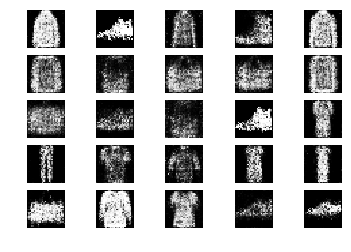

3101 [D loss: 0.586007, acc.: 68.75%] [G loss: 0.971212]
3102 [D loss: 0.704300, acc.: 48.44%] [G loss: 0.965141]
3103 [D loss: 0.599667, acc.: 68.75%] [G loss: 0.941787]
3104 [D loss: 0.679115, acc.: 59.38%] [G loss: 0.901185]
3105 [D loss: 0.608173, acc.: 60.94%] [G loss: 0.894224]
3106 [D loss: 0.623306, acc.: 67.19%] [G loss: 0.975817]
3107 [D loss: 0.584696, acc.: 76.56%] [G loss: 0.943103]
3108 [D loss: 0.608912, acc.: 68.75%] [G loss: 0.962180]
3109 [D loss: 0.620492, acc.: 68.75%] [G loss: 1.061857]
3110 [D loss: 0.648265, acc.: 56.25%] [G loss: 0.935679]
3111 [D loss: 0.643384, acc.: 62.50%] [G loss: 1.009842]
3112 [D loss: 0.593210, acc.: 73.44%] [G loss: 0.978033]
3113 [D loss: 0.724925, acc.: 54.69%] [G loss: 0.937433]
3114 [D loss: 0.641451, acc.: 67.19%] [G loss: 0.965552]
3115 [D loss: 0.667328, acc.: 57.81%] [G loss: 0.938817]
3116 [D loss: 0.664234, acc.: 62.50%] [G loss: 0.934084]
3117 [D loss: 0.582008, acc.: 73.44%] [G loss: 0.874451]
3118 [D loss: 0.629635, acc.: 6

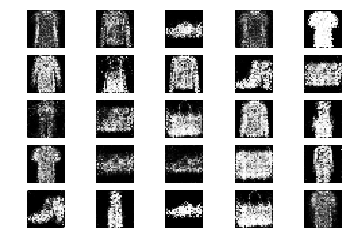

3151 [D loss: 0.602836, acc.: 76.56%] [G loss: 0.945862]
3152 [D loss: 0.692681, acc.: 48.44%] [G loss: 0.924127]
3153 [D loss: 0.565648, acc.: 78.12%] [G loss: 0.989861]
3154 [D loss: 0.636444, acc.: 64.06%] [G loss: 0.970518]
3155 [D loss: 0.690006, acc.: 56.25%] [G loss: 1.005868]
3156 [D loss: 0.621642, acc.: 64.06%] [G loss: 0.961617]
3157 [D loss: 0.596587, acc.: 67.19%] [G loss: 0.974779]
3158 [D loss: 0.656055, acc.: 59.38%] [G loss: 0.987388]
3159 [D loss: 0.638070, acc.: 67.19%] [G loss: 0.854597]
3160 [D loss: 0.634859, acc.: 59.38%] [G loss: 0.930719]
3161 [D loss: 0.594886, acc.: 67.19%] [G loss: 0.997792]
3162 [D loss: 0.628896, acc.: 60.94%] [G loss: 0.984943]
3163 [D loss: 0.654800, acc.: 62.50%] [G loss: 0.883273]
3164 [D loss: 0.664995, acc.: 59.38%] [G loss: 0.967568]
3165 [D loss: 0.591778, acc.: 67.19%] [G loss: 0.925490]
3166 [D loss: 0.664644, acc.: 50.00%] [G loss: 0.990303]
3167 [D loss: 0.592903, acc.: 70.31%] [G loss: 0.941817]
3168 [D loss: 0.621730, acc.: 6

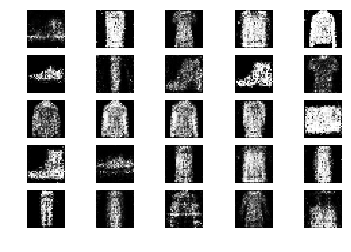

3201 [D loss: 0.670000, acc.: 57.81%] [G loss: 1.006370]
3202 [D loss: 0.667690, acc.: 53.12%] [G loss: 1.012987]
3203 [D loss: 0.628080, acc.: 62.50%] [G loss: 1.008197]
3204 [D loss: 0.661939, acc.: 64.06%] [G loss: 0.947636]
3205 [D loss: 0.657451, acc.: 59.38%] [G loss: 0.997817]
3206 [D loss: 0.601825, acc.: 65.62%] [G loss: 0.913261]
3207 [D loss: 0.660676, acc.: 62.50%] [G loss: 0.973901]
3208 [D loss: 0.652417, acc.: 64.06%] [G loss: 0.919141]
3209 [D loss: 0.590483, acc.: 70.31%] [G loss: 0.915109]
3210 [D loss: 0.652810, acc.: 57.81%] [G loss: 0.968864]
3211 [D loss: 0.588981, acc.: 76.56%] [G loss: 0.976001]
3212 [D loss: 0.718956, acc.: 50.00%] [G loss: 0.949914]
3213 [D loss: 0.676898, acc.: 60.94%] [G loss: 0.908665]
3214 [D loss: 0.662470, acc.: 57.81%] [G loss: 0.973661]
3215 [D loss: 0.692364, acc.: 53.12%] [G loss: 0.944022]
3216 [D loss: 0.715469, acc.: 59.38%] [G loss: 0.959766]
3217 [D loss: 0.685654, acc.: 51.56%] [G loss: 0.899776]
3218 [D loss: 0.664229, acc.: 5

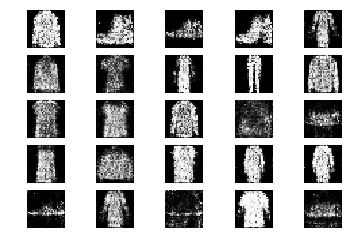

3251 [D loss: 0.639012, acc.: 62.50%] [G loss: 0.921634]
3252 [D loss: 0.713279, acc.: 50.00%] [G loss: 0.983901]
3253 [D loss: 0.678482, acc.: 59.38%] [G loss: 0.888158]
3254 [D loss: 0.635588, acc.: 57.81%] [G loss: 0.912608]
3255 [D loss: 0.611984, acc.: 68.75%] [G loss: 0.993843]
3256 [D loss: 0.665432, acc.: 59.38%] [G loss: 0.913604]
3257 [D loss: 0.631934, acc.: 62.50%] [G loss: 0.967303]
3258 [D loss: 0.606128, acc.: 68.75%] [G loss: 0.915760]
3259 [D loss: 0.696200, acc.: 57.81%] [G loss: 0.855437]
3260 [D loss: 0.627873, acc.: 71.88%] [G loss: 0.970690]
3261 [D loss: 0.745416, acc.: 46.88%] [G loss: 1.001543]
3262 [D loss: 0.630854, acc.: 65.62%] [G loss: 0.888315]
3263 [D loss: 0.667477, acc.: 67.19%] [G loss: 0.979822]
3264 [D loss: 0.671994, acc.: 59.38%] [G loss: 0.981480]
3265 [D loss: 0.650470, acc.: 62.50%] [G loss: 0.961342]
3266 [D loss: 0.617641, acc.: 65.62%] [G loss: 0.936127]
3267 [D loss: 0.623099, acc.: 62.50%] [G loss: 0.995487]
3268 [D loss: 0.658289, acc.: 6

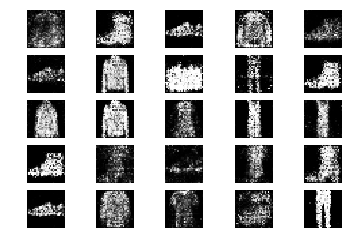

3301 [D loss: 0.644481, acc.: 70.31%] [G loss: 1.051915]
3302 [D loss: 0.622771, acc.: 68.75%] [G loss: 0.920196]
3303 [D loss: 0.594784, acc.: 71.88%] [G loss: 0.975087]
3304 [D loss: 0.681011, acc.: 54.69%] [G loss: 0.945614]
3305 [D loss: 0.694589, acc.: 62.50%] [G loss: 0.939783]
3306 [D loss: 0.648734, acc.: 64.06%] [G loss: 1.016415]
3307 [D loss: 0.634764, acc.: 64.06%] [G loss: 0.894695]
3308 [D loss: 0.623752, acc.: 68.75%] [G loss: 0.965634]
3309 [D loss: 0.618701, acc.: 73.44%] [G loss: 0.962072]
3310 [D loss: 0.723473, acc.: 51.56%] [G loss: 0.929790]
3311 [D loss: 0.637627, acc.: 64.06%] [G loss: 0.971198]
3312 [D loss: 0.627551, acc.: 67.19%] [G loss: 0.903822]
3313 [D loss: 0.639689, acc.: 62.50%] [G loss: 0.929666]
3314 [D loss: 0.646710, acc.: 65.62%] [G loss: 0.930386]
3315 [D loss: 0.654165, acc.: 57.81%] [G loss: 0.951586]
3316 [D loss: 0.574663, acc.: 68.75%] [G loss: 0.954333]
3317 [D loss: 0.678402, acc.: 59.38%] [G loss: 0.986184]
3318 [D loss: 0.654591, acc.: 6

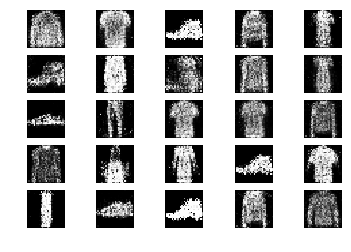

3351 [D loss: 0.617958, acc.: 70.31%] [G loss: 0.934660]
3352 [D loss: 0.697282, acc.: 54.69%] [G loss: 0.936443]
3353 [D loss: 0.698822, acc.: 48.44%] [G loss: 0.930872]
3354 [D loss: 0.624080, acc.: 65.62%] [G loss: 0.922984]
3355 [D loss: 0.540360, acc.: 81.25%] [G loss: 0.932780]
3356 [D loss: 0.704198, acc.: 53.12%] [G loss: 1.020404]
3357 [D loss: 0.677762, acc.: 60.94%] [G loss: 0.948350]
3358 [D loss: 0.654788, acc.: 56.25%] [G loss: 0.915718]
3359 [D loss: 0.682917, acc.: 54.69%] [G loss: 0.919943]
3360 [D loss: 0.591708, acc.: 78.12%] [G loss: 0.942083]
3361 [D loss: 0.640786, acc.: 57.81%] [G loss: 0.926872]
3362 [D loss: 0.613126, acc.: 67.19%] [G loss: 0.856555]
3363 [D loss: 0.671636, acc.: 57.81%] [G loss: 1.060508]
3364 [D loss: 0.589058, acc.: 75.00%] [G loss: 1.038302]
3365 [D loss: 0.644494, acc.: 65.62%] [G loss: 0.967161]
3366 [D loss: 0.665852, acc.: 57.81%] [G loss: 0.938154]
3367 [D loss: 0.660422, acc.: 62.50%] [G loss: 0.944466]
3368 [D loss: 0.662551, acc.: 5

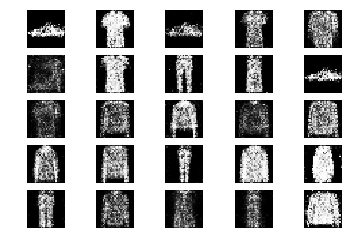

3401 [D loss: 0.684573, acc.: 60.94%] [G loss: 0.924517]
3402 [D loss: 0.669303, acc.: 60.94%] [G loss: 0.964483]
3403 [D loss: 0.642051, acc.: 51.56%] [G loss: 0.971236]
3404 [D loss: 0.693743, acc.: 57.81%] [G loss: 0.989930]
3405 [D loss: 0.662659, acc.: 64.06%] [G loss: 0.956429]
3406 [D loss: 0.678043, acc.: 64.06%] [G loss: 0.889728]
3407 [D loss: 0.628051, acc.: 65.62%] [G loss: 0.941698]
3408 [D loss: 0.692089, acc.: 50.00%] [G loss: 0.922195]
3409 [D loss: 0.561479, acc.: 79.69%] [G loss: 1.036205]
3410 [D loss: 0.666740, acc.: 67.19%] [G loss: 0.961586]
3411 [D loss: 0.605486, acc.: 67.19%] [G loss: 1.000192]
3412 [D loss: 0.570125, acc.: 71.88%] [G loss: 0.904254]
3413 [D loss: 0.655454, acc.: 56.25%] [G loss: 0.963024]
3414 [D loss: 0.649401, acc.: 68.75%] [G loss: 0.923969]
3415 [D loss: 0.693525, acc.: 57.81%] [G loss: 0.900648]
3416 [D loss: 0.706415, acc.: 56.25%] [G loss: 0.870648]
3417 [D loss: 0.633906, acc.: 53.12%] [G loss: 0.859566]
3418 [D loss: 0.665745, acc.: 5

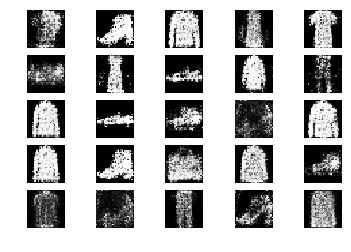

3451 [D loss: 0.617748, acc.: 70.31%] [G loss: 0.888444]
3452 [D loss: 0.611914, acc.: 68.75%] [G loss: 0.943787]
3453 [D loss: 0.614666, acc.: 68.75%] [G loss: 0.923345]
3454 [D loss: 0.583141, acc.: 67.19%] [G loss: 0.951428]
3455 [D loss: 0.640012, acc.: 57.81%] [G loss: 0.851407]
3456 [D loss: 0.718266, acc.: 64.06%] [G loss: 0.939003]
3457 [D loss: 0.676281, acc.: 59.38%] [G loss: 0.948190]
3458 [D loss: 0.648260, acc.: 64.06%] [G loss: 0.848070]
3459 [D loss: 0.603637, acc.: 68.75%] [G loss: 0.881610]
3460 [D loss: 0.637383, acc.: 64.06%] [G loss: 0.957348]
3461 [D loss: 0.739225, acc.: 57.81%] [G loss: 0.876844]
3462 [D loss: 0.653777, acc.: 59.38%] [G loss: 0.854171]
3463 [D loss: 0.681072, acc.: 57.81%] [G loss: 0.970773]
3464 [D loss: 0.628974, acc.: 67.19%] [G loss: 0.951824]
3465 [D loss: 0.645268, acc.: 59.38%] [G loss: 0.974052]
3466 [D loss: 0.718922, acc.: 46.88%] [G loss: 0.935950]
3467 [D loss: 0.657466, acc.: 57.81%] [G loss: 0.900003]
3468 [D loss: 0.650244, acc.: 5

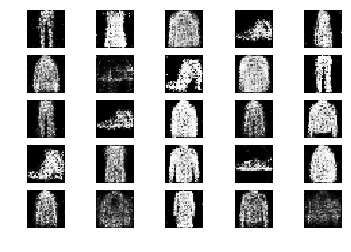

3501 [D loss: 0.656139, acc.: 64.06%] [G loss: 0.880883]
3502 [D loss: 0.610252, acc.: 65.62%] [G loss: 0.900831]
3503 [D loss: 0.728854, acc.: 51.56%] [G loss: 0.960987]
3504 [D loss: 0.709179, acc.: 59.38%] [G loss: 0.944031]
3505 [D loss: 0.699240, acc.: 59.38%] [G loss: 0.893561]
3506 [D loss: 0.643366, acc.: 56.25%] [G loss: 0.959431]
3507 [D loss: 0.599093, acc.: 65.62%] [G loss: 0.935699]
3508 [D loss: 0.598031, acc.: 68.75%] [G loss: 0.894221]
3509 [D loss: 0.630292, acc.: 59.38%] [G loss: 0.889200]
3510 [D loss: 0.679643, acc.: 54.69%] [G loss: 0.791294]
3511 [D loss: 0.624797, acc.: 62.50%] [G loss: 0.883672]
3512 [D loss: 0.622278, acc.: 65.62%] [G loss: 0.895504]
3513 [D loss: 0.671074, acc.: 64.06%] [G loss: 0.870724]
3514 [D loss: 0.655494, acc.: 62.50%] [G loss: 0.962046]
3515 [D loss: 0.614409, acc.: 71.88%] [G loss: 0.950733]
3516 [D loss: 0.593206, acc.: 71.88%] [G loss: 0.936168]
3517 [D loss: 0.618638, acc.: 65.62%] [G loss: 0.857659]
3518 [D loss: 0.642914, acc.: 6

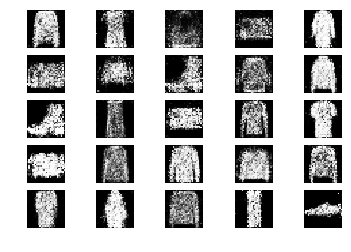

3551 [D loss: 0.715171, acc.: 54.69%] [G loss: 0.959177]
3552 [D loss: 0.657546, acc.: 60.94%] [G loss: 0.952652]
3553 [D loss: 0.649621, acc.: 60.94%] [G loss: 0.965129]
3554 [D loss: 0.623625, acc.: 68.75%] [G loss: 0.842630]
3555 [D loss: 0.671885, acc.: 54.69%] [G loss: 0.977890]
3556 [D loss: 0.599410, acc.: 65.62%] [G loss: 1.017568]
3557 [D loss: 0.642749, acc.: 57.81%] [G loss: 1.010597]
3558 [D loss: 0.681411, acc.: 57.81%] [G loss: 0.914123]
3559 [D loss: 0.657482, acc.: 54.69%] [G loss: 0.960171]
3560 [D loss: 0.672593, acc.: 43.75%] [G loss: 0.932832]
3561 [D loss: 0.671384, acc.: 60.94%] [G loss: 0.931084]
3562 [D loss: 0.674364, acc.: 57.81%] [G loss: 0.916687]
3563 [D loss: 0.665897, acc.: 62.50%] [G loss: 0.941128]
3564 [D loss: 0.663581, acc.: 53.12%] [G loss: 0.943022]
3565 [D loss: 0.653596, acc.: 60.94%] [G loss: 0.922385]
3566 [D loss: 0.632885, acc.: 59.38%] [G loss: 0.926841]
3567 [D loss: 0.646055, acc.: 60.94%] [G loss: 0.963189]
3568 [D loss: 0.612201, acc.: 5

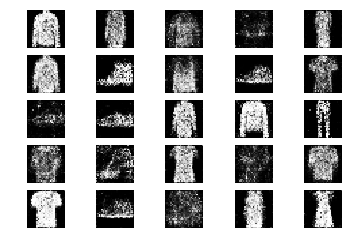

3601 [D loss: 0.683510, acc.: 57.81%] [G loss: 0.948093]
3602 [D loss: 0.638270, acc.: 53.12%] [G loss: 0.935672]
3603 [D loss: 0.585942, acc.: 67.19%] [G loss: 0.842176]
3604 [D loss: 0.618698, acc.: 68.75%] [G loss: 0.924285]
3605 [D loss: 0.641078, acc.: 65.62%] [G loss: 0.915848]
3606 [D loss: 0.679317, acc.: 50.00%] [G loss: 0.938611]
3607 [D loss: 0.652692, acc.: 54.69%] [G loss: 0.999838]
3608 [D loss: 0.625191, acc.: 60.94%] [G loss: 0.990719]
3609 [D loss: 0.658334, acc.: 57.81%] [G loss: 1.023472]
3610 [D loss: 0.630008, acc.: 56.25%] [G loss: 0.989015]
3611 [D loss: 0.633243, acc.: 67.19%] [G loss: 0.954514]
3612 [D loss: 0.671443, acc.: 57.81%] [G loss: 0.954437]
3613 [D loss: 0.672391, acc.: 59.38%] [G loss: 0.941697]
3614 [D loss: 0.617210, acc.: 71.88%] [G loss: 0.989626]
3615 [D loss: 0.606484, acc.: 64.06%] [G loss: 1.026952]
3616 [D loss: 0.574330, acc.: 78.12%] [G loss: 0.894319]
3617 [D loss: 0.612947, acc.: 65.62%] [G loss: 0.850510]
3618 [D loss: 0.674714, acc.: 6

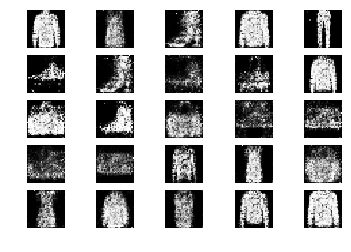

3651 [D loss: 0.647008, acc.: 59.38%] [G loss: 0.977129]
3652 [D loss: 0.618362, acc.: 65.62%] [G loss: 1.078791]
3653 [D loss: 0.588485, acc.: 70.31%] [G loss: 1.060614]
3654 [D loss: 0.751556, acc.: 40.62%] [G loss: 0.902613]
3655 [D loss: 0.679606, acc.: 53.12%] [G loss: 0.894532]
3656 [D loss: 0.627585, acc.: 62.50%] [G loss: 0.914460]
3657 [D loss: 0.625027, acc.: 70.31%] [G loss: 0.862478]
3658 [D loss: 0.686390, acc.: 51.56%] [G loss: 0.839953]
3659 [D loss: 0.622287, acc.: 70.31%] [G loss: 0.929136]
3660 [D loss: 0.577039, acc.: 75.00%] [G loss: 0.909453]
3661 [D loss: 0.704524, acc.: 53.12%] [G loss: 0.828600]
3662 [D loss: 0.705773, acc.: 56.25%] [G loss: 0.930775]
3663 [D loss: 0.679300, acc.: 57.81%] [G loss: 0.846667]
3664 [D loss: 0.629363, acc.: 71.88%] [G loss: 0.954093]
3665 [D loss: 0.664349, acc.: 59.38%] [G loss: 0.926697]
3666 [D loss: 0.641766, acc.: 57.81%] [G loss: 0.925132]
3667 [D loss: 0.634670, acc.: 67.19%] [G loss: 0.982311]
3668 [D loss: 0.663985, acc.: 6

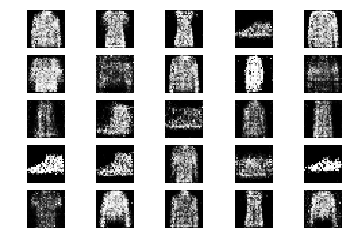

3701 [D loss: 0.592125, acc.: 70.31%] [G loss: 0.967815]
3702 [D loss: 0.620252, acc.: 62.50%] [G loss: 0.799304]
3703 [D loss: 0.644299, acc.: 64.06%] [G loss: 0.982462]
3704 [D loss: 0.631218, acc.: 62.50%] [G loss: 0.820643]
3705 [D loss: 0.650406, acc.: 67.19%] [G loss: 0.825516]
3706 [D loss: 0.595368, acc.: 62.50%] [G loss: 0.810893]
3707 [D loss: 0.588796, acc.: 75.00%] [G loss: 0.904303]
3708 [D loss: 0.614241, acc.: 67.19%] [G loss: 0.930425]
3709 [D loss: 0.630828, acc.: 54.69%] [G loss: 0.847959]
3710 [D loss: 0.659388, acc.: 60.94%] [G loss: 0.893346]
3711 [D loss: 0.684550, acc.: 50.00%] [G loss: 0.883683]
3712 [D loss: 0.592238, acc.: 70.31%] [G loss: 0.878679]
3713 [D loss: 0.618339, acc.: 70.31%] [G loss: 0.937121]
3714 [D loss: 0.714774, acc.: 54.69%] [G loss: 1.109811]
3715 [D loss: 0.581036, acc.: 75.00%] [G loss: 0.912784]
3716 [D loss: 0.648425, acc.: 60.94%] [G loss: 0.972613]
3717 [D loss: 0.679806, acc.: 60.94%] [G loss: 0.955746]
3718 [D loss: 0.588952, acc.: 6

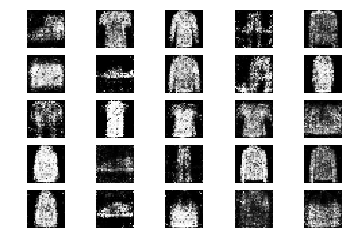

3751 [D loss: 0.664762, acc.: 59.38%] [G loss: 0.917708]
3752 [D loss: 0.631322, acc.: 64.06%] [G loss: 0.988481]
3753 [D loss: 0.581864, acc.: 65.62%] [G loss: 0.849575]
3754 [D loss: 0.684259, acc.: 60.94%] [G loss: 0.943280]
3755 [D loss: 0.658145, acc.: 67.19%] [G loss: 0.992031]
3756 [D loss: 0.689880, acc.: 56.25%] [G loss: 0.890714]
3757 [D loss: 0.660999, acc.: 64.06%] [G loss: 0.881642]
3758 [D loss: 0.594602, acc.: 67.19%] [G loss: 0.841601]
3759 [D loss: 0.608062, acc.: 70.31%] [G loss: 0.941638]
3760 [D loss: 0.704330, acc.: 53.12%] [G loss: 0.897772]
3761 [D loss: 0.739704, acc.: 42.19%] [G loss: 0.821732]
3762 [D loss: 0.613855, acc.: 68.75%] [G loss: 1.012566]
3763 [D loss: 0.632174, acc.: 62.50%] [G loss: 1.036551]
3764 [D loss: 0.696208, acc.: 59.38%] [G loss: 1.010733]
3765 [D loss: 0.620213, acc.: 68.75%] [G loss: 0.937330]
3766 [D loss: 0.637529, acc.: 60.94%] [G loss: 0.924204]
3767 [D loss: 0.676821, acc.: 56.25%] [G loss: 0.911893]
3768 [D loss: 0.647904, acc.: 6

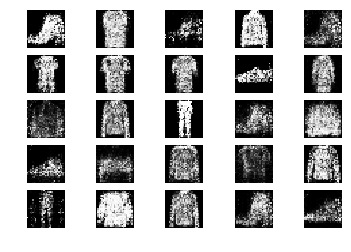

3801 [D loss: 0.603755, acc.: 68.75%] [G loss: 0.906423]
3802 [D loss: 0.674959, acc.: 54.69%] [G loss: 0.858423]
3803 [D loss: 0.707065, acc.: 59.38%] [G loss: 0.998883]
3804 [D loss: 0.620840, acc.: 67.19%] [G loss: 1.081876]
3805 [D loss: 0.651114, acc.: 60.94%] [G loss: 1.033401]
3806 [D loss: 0.691616, acc.: 48.44%] [G loss: 1.041852]
3807 [D loss: 0.603476, acc.: 64.06%] [G loss: 1.007068]
3808 [D loss: 0.646159, acc.: 60.94%] [G loss: 0.938609]
3809 [D loss: 0.614828, acc.: 71.88%] [G loss: 0.929075]
3810 [D loss: 0.711910, acc.: 57.81%] [G loss: 0.857292]
3811 [D loss: 0.651386, acc.: 59.38%] [G loss: 0.889040]
3812 [D loss: 0.636631, acc.: 65.62%] [G loss: 0.894866]
3813 [D loss: 0.610458, acc.: 75.00%] [G loss: 0.914122]
3814 [D loss: 0.648287, acc.: 62.50%] [G loss: 0.957967]
3815 [D loss: 0.659110, acc.: 60.94%] [G loss: 0.954085]
3816 [D loss: 0.626751, acc.: 62.50%] [G loss: 0.960622]
3817 [D loss: 0.616776, acc.: 70.31%] [G loss: 0.946389]
3818 [D loss: 0.745775, acc.: 5

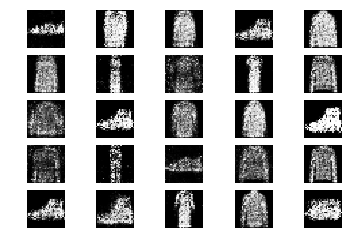

3851 [D loss: 0.679268, acc.: 59.38%] [G loss: 0.900955]
3852 [D loss: 0.610299, acc.: 62.50%] [G loss: 0.866482]
3853 [D loss: 0.572960, acc.: 73.44%] [G loss: 0.838399]
3854 [D loss: 0.653306, acc.: 64.06%] [G loss: 0.922175]
3855 [D loss: 0.629714, acc.: 64.06%] [G loss: 0.944752]
3856 [D loss: 0.652383, acc.: 68.75%] [G loss: 0.885282]
3857 [D loss: 0.684764, acc.: 59.38%] [G loss: 0.934103]
3858 [D loss: 0.697204, acc.: 57.81%] [G loss: 0.929251]
3859 [D loss: 0.619222, acc.: 67.19%] [G loss: 0.958751]
3860 [D loss: 0.616345, acc.: 70.31%] [G loss: 0.991042]
3861 [D loss: 0.680310, acc.: 57.81%] [G loss: 0.901736]
3862 [D loss: 0.608171, acc.: 62.50%] [G loss: 0.960720]
3863 [D loss: 0.698674, acc.: 51.56%] [G loss: 0.951004]
3864 [D loss: 0.593724, acc.: 68.75%] [G loss: 1.000295]
3865 [D loss: 0.643401, acc.: 64.06%] [G loss: 0.924845]
3866 [D loss: 0.621255, acc.: 70.31%] [G loss: 0.954479]
3867 [D loss: 0.716957, acc.: 56.25%] [G loss: 0.909426]
3868 [D loss: 0.597181, acc.: 6

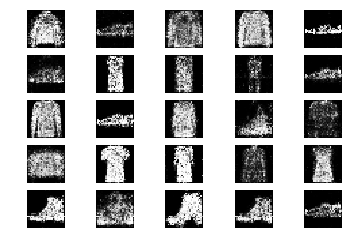

3901 [D loss: 0.706238, acc.: 57.81%] [G loss: 0.878213]
3902 [D loss: 0.652016, acc.: 64.06%] [G loss: 0.934692]
3903 [D loss: 0.624911, acc.: 62.50%] [G loss: 0.966709]
3904 [D loss: 0.681677, acc.: 56.25%] [G loss: 0.997816]
3905 [D loss: 0.725967, acc.: 50.00%] [G loss: 0.867805]
3906 [D loss: 0.630145, acc.: 60.94%] [G loss: 0.848437]
3907 [D loss: 0.650354, acc.: 68.75%] [G loss: 0.901129]
3908 [D loss: 0.649975, acc.: 65.62%] [G loss: 1.034609]
3909 [D loss: 0.665977, acc.: 64.06%] [G loss: 0.963988]
3910 [D loss: 0.662211, acc.: 59.38%] [G loss: 0.971887]
3911 [D loss: 0.594700, acc.: 68.75%] [G loss: 1.037524]
3912 [D loss: 0.615879, acc.: 68.75%] [G loss: 0.971169]
3913 [D loss: 0.625179, acc.: 57.81%] [G loss: 0.965733]
3914 [D loss: 0.597794, acc.: 67.19%] [G loss: 0.964803]
3915 [D loss: 0.663861, acc.: 59.38%] [G loss: 0.851230]
3916 [D loss: 0.693821, acc.: 56.25%] [G loss: 0.834703]
3917 [D loss: 0.699044, acc.: 53.12%] [G loss: 0.837638]
3918 [D loss: 0.656253, acc.: 6

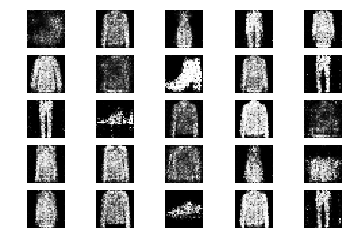

3951 [D loss: 0.640134, acc.: 65.62%] [G loss: 0.903135]
3952 [D loss: 0.684420, acc.: 57.81%] [G loss: 0.905302]
3953 [D loss: 0.607645, acc.: 70.31%] [G loss: 0.957215]
3954 [D loss: 0.684723, acc.: 46.88%] [G loss: 0.970876]
3955 [D loss: 0.705446, acc.: 56.25%] [G loss: 0.929174]
3956 [D loss: 0.608745, acc.: 64.06%] [G loss: 0.956484]
3957 [D loss: 0.719564, acc.: 56.25%] [G loss: 0.805307]
3958 [D loss: 0.596636, acc.: 73.44%] [G loss: 0.892751]
3959 [D loss: 0.587833, acc.: 67.19%] [G loss: 0.912475]
3960 [D loss: 0.701675, acc.: 57.81%] [G loss: 1.005506]
3961 [D loss: 0.631436, acc.: 62.50%] [G loss: 0.898138]
3962 [D loss: 0.749046, acc.: 45.31%] [G loss: 0.870142]
3963 [D loss: 0.637610, acc.: 60.94%] [G loss: 0.818338]
3964 [D loss: 0.643164, acc.: 64.06%] [G loss: 0.862572]
3965 [D loss: 0.582625, acc.: 68.75%] [G loss: 0.895940]
3966 [D loss: 0.627407, acc.: 60.94%] [G loss: 1.010473]
3967 [D loss: 0.631427, acc.: 60.94%] [G loss: 0.968810]
3968 [D loss: 0.751008, acc.: 5

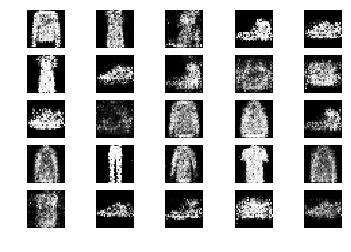

4001 [D loss: 0.679766, acc.: 56.25%] [G loss: 0.901387]
4002 [D loss: 0.607491, acc.: 62.50%] [G loss: 0.882786]
4003 [D loss: 0.684475, acc.: 57.81%] [G loss: 0.843372]
4004 [D loss: 0.626090, acc.: 59.38%] [G loss: 0.813216]
4005 [D loss: 0.656535, acc.: 60.94%] [G loss: 0.887957]
4006 [D loss: 0.628129, acc.: 71.88%] [G loss: 0.948293]
4007 [D loss: 0.660408, acc.: 59.38%] [G loss: 0.855404]
4008 [D loss: 0.712112, acc.: 56.25%] [G loss: 0.841644]
4009 [D loss: 0.600036, acc.: 65.62%] [G loss: 0.944565]
4010 [D loss: 0.583085, acc.: 71.88%] [G loss: 0.925739]
4011 [D loss: 0.676279, acc.: 59.38%] [G loss: 0.914220]
4012 [D loss: 0.620200, acc.: 64.06%] [G loss: 0.956212]
4013 [D loss: 0.652798, acc.: 62.50%] [G loss: 0.906972]
4014 [D loss: 0.673280, acc.: 56.25%] [G loss: 0.866063]
4015 [D loss: 0.646287, acc.: 57.81%] [G loss: 0.859593]
4016 [D loss: 0.636892, acc.: 70.31%] [G loss: 0.914747]
4017 [D loss: 0.657478, acc.: 57.81%] [G loss: 1.051250]
4018 [D loss: 0.646406, acc.: 6

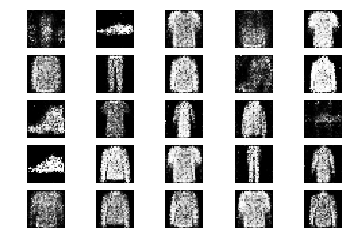

4051 [D loss: 0.633197, acc.: 67.19%] [G loss: 0.919806]
4052 [D loss: 0.595242, acc.: 64.06%] [G loss: 0.916244]
4053 [D loss: 0.631210, acc.: 68.75%] [G loss: 0.991812]
4054 [D loss: 0.714823, acc.: 56.25%] [G loss: 0.978527]
4055 [D loss: 0.664471, acc.: 57.81%] [G loss: 1.040271]
4056 [D loss: 0.675873, acc.: 60.94%] [G loss: 1.058357]
4057 [D loss: 0.654284, acc.: 59.38%] [G loss: 0.979867]
4058 [D loss: 0.590795, acc.: 73.44%] [G loss: 0.985861]
4059 [D loss: 0.670583, acc.: 62.50%] [G loss: 0.825996]
4060 [D loss: 0.660221, acc.: 57.81%] [G loss: 0.910137]
4061 [D loss: 0.595619, acc.: 70.31%] [G loss: 0.930160]
4062 [D loss: 0.629178, acc.: 65.62%] [G loss: 0.941172]
4063 [D loss: 0.690529, acc.: 59.38%] [G loss: 0.899905]
4064 [D loss: 0.619310, acc.: 68.75%] [G loss: 0.840578]
4065 [D loss: 0.654280, acc.: 62.50%] [G loss: 0.940332]
4066 [D loss: 0.672673, acc.: 60.94%] [G loss: 0.905012]
4067 [D loss: 0.682543, acc.: 54.69%] [G loss: 1.006102]
4068 [D loss: 0.639539, acc.: 6

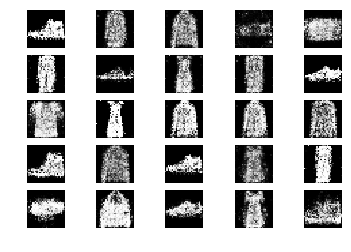

4101 [D loss: 0.662293, acc.: 64.06%] [G loss: 0.945054]
4102 [D loss: 0.653109, acc.: 65.62%] [G loss: 0.913134]
4103 [D loss: 0.709292, acc.: 56.25%] [G loss: 0.953578]
4104 [D loss: 0.640553, acc.: 64.06%] [G loss: 0.983666]
4105 [D loss: 0.647221, acc.: 57.81%] [G loss: 0.949166]
4106 [D loss: 0.623543, acc.: 68.75%] [G loss: 0.981467]
4107 [D loss: 0.709098, acc.: 46.88%] [G loss: 0.941689]
4108 [D loss: 0.611501, acc.: 59.38%] [G loss: 0.966743]
4109 [D loss: 0.606420, acc.: 68.75%] [G loss: 0.864672]
4110 [D loss: 0.616704, acc.: 65.62%] [G loss: 0.915222]
4111 [D loss: 0.628980, acc.: 62.50%] [G loss: 0.897800]
4112 [D loss: 0.586614, acc.: 71.88%] [G loss: 0.966810]
4113 [D loss: 0.633339, acc.: 60.94%] [G loss: 1.004442]
4114 [D loss: 0.701368, acc.: 59.38%] [G loss: 0.987517]
4115 [D loss: 0.656003, acc.: 57.81%] [G loss: 0.855268]
4116 [D loss: 0.604357, acc.: 65.62%] [G loss: 0.921563]
4117 [D loss: 0.691035, acc.: 53.12%] [G loss: 0.938492]
4118 [D loss: 0.610251, acc.: 6

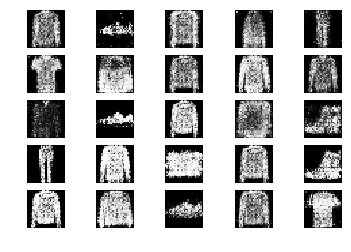

4151 [D loss: 0.633208, acc.: 59.38%] [G loss: 0.979899]
4152 [D loss: 0.645071, acc.: 67.19%] [G loss: 1.023402]
4153 [D loss: 0.660722, acc.: 67.19%] [G loss: 0.877456]
4154 [D loss: 0.663611, acc.: 64.06%] [G loss: 0.971204]
4155 [D loss: 0.715949, acc.: 51.56%] [G loss: 0.940825]
4156 [D loss: 0.658202, acc.: 70.31%] [G loss: 0.834911]
4157 [D loss: 0.646073, acc.: 65.62%] [G loss: 0.858960]
4158 [D loss: 0.649944, acc.: 62.50%] [G loss: 0.929728]
4159 [D loss: 0.629792, acc.: 64.06%] [G loss: 0.896883]
4160 [D loss: 0.658276, acc.: 64.06%] [G loss: 0.885966]
4161 [D loss: 0.643388, acc.: 64.06%] [G loss: 0.944743]
4162 [D loss: 0.605305, acc.: 64.06%] [G loss: 0.922773]
4163 [D loss: 0.588803, acc.: 71.88%] [G loss: 0.862720]
4164 [D loss: 0.644857, acc.: 56.25%] [G loss: 0.899863]
4165 [D loss: 0.694333, acc.: 53.12%] [G loss: 0.842515]
4166 [D loss: 0.654040, acc.: 56.25%] [G loss: 0.874349]
4167 [D loss: 0.674303, acc.: 59.38%] [G loss: 0.851711]
4168 [D loss: 0.628251, acc.: 6

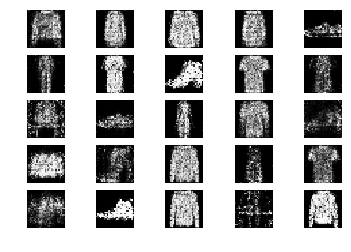

4201 [D loss: 0.691425, acc.: 54.69%] [G loss: 0.959085]
4202 [D loss: 0.594738, acc.: 73.44%] [G loss: 0.928889]
4203 [D loss: 0.674840, acc.: 53.12%] [G loss: 0.864268]
4204 [D loss: 0.570939, acc.: 75.00%] [G loss: 0.913857]
4205 [D loss: 0.664062, acc.: 54.69%] [G loss: 0.961422]
4206 [D loss: 0.614248, acc.: 68.75%] [G loss: 1.044082]
4207 [D loss: 0.643678, acc.: 70.31%] [G loss: 0.887364]
4208 [D loss: 0.633484, acc.: 64.06%] [G loss: 0.925729]
4209 [D loss: 0.703956, acc.: 50.00%] [G loss: 0.960041]
4210 [D loss: 0.619846, acc.: 70.31%] [G loss: 0.960081]
4211 [D loss: 0.657745, acc.: 62.50%] [G loss: 0.885505]
4212 [D loss: 0.610417, acc.: 78.12%] [G loss: 0.888188]
4213 [D loss: 0.702638, acc.: 54.69%] [G loss: 0.856366]
4214 [D loss: 0.637026, acc.: 59.38%] [G loss: 0.934462]
4215 [D loss: 0.705796, acc.: 57.81%] [G loss: 0.862301]
4216 [D loss: 0.647405, acc.: 68.75%] [G loss: 0.923109]
4217 [D loss: 0.683195, acc.: 59.38%] [G loss: 0.860538]
4218 [D loss: 0.634109, acc.: 6

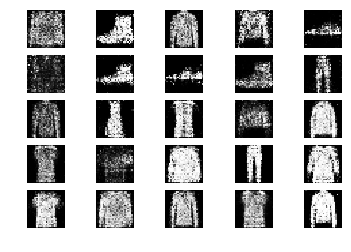

4251 [D loss: 0.625061, acc.: 56.25%] [G loss: 0.853566]
4252 [D loss: 0.681097, acc.: 56.25%] [G loss: 0.796618]
4253 [D loss: 0.736431, acc.: 40.62%] [G loss: 0.823619]
4254 [D loss: 0.653120, acc.: 57.81%] [G loss: 0.876132]
4255 [D loss: 0.645810, acc.: 64.06%] [G loss: 0.978276]
4256 [D loss: 0.658218, acc.: 64.06%] [G loss: 0.959538]
4257 [D loss: 0.599023, acc.: 75.00%] [G loss: 0.915563]
4258 [D loss: 0.637449, acc.: 57.81%] [G loss: 0.967098]
4259 [D loss: 0.660039, acc.: 54.69%] [G loss: 0.968843]
4260 [D loss: 0.607640, acc.: 67.19%] [G loss: 0.909744]
4261 [D loss: 0.597336, acc.: 73.44%] [G loss: 0.834291]
4262 [D loss: 0.610509, acc.: 67.19%] [G loss: 0.862681]
4263 [D loss: 0.715252, acc.: 46.88%] [G loss: 0.820544]
4264 [D loss: 0.617372, acc.: 56.25%] [G loss: 0.908205]
4265 [D loss: 0.574046, acc.: 73.44%] [G loss: 0.978629]
4266 [D loss: 0.669271, acc.: 60.94%] [G loss: 0.967230]
4267 [D loss: 0.673664, acc.: 53.12%] [G loss: 0.885806]
4268 [D loss: 0.646382, acc.: 5

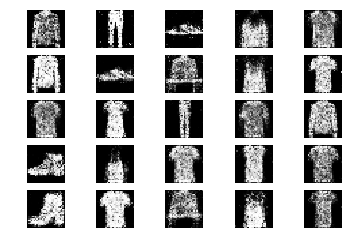

4301 [D loss: 0.667530, acc.: 56.25%] [G loss: 0.874640]
4302 [D loss: 0.688027, acc.: 62.50%] [G loss: 0.888612]
4303 [D loss: 0.731408, acc.: 50.00%] [G loss: 0.936943]
4304 [D loss: 0.656072, acc.: 54.69%] [G loss: 0.968812]
4305 [D loss: 0.691653, acc.: 56.25%] [G loss: 0.929486]
4306 [D loss: 0.651459, acc.: 67.19%] [G loss: 0.968231]
4307 [D loss: 0.591413, acc.: 75.00%] [G loss: 0.950617]
4308 [D loss: 0.653075, acc.: 59.38%] [G loss: 0.978120]
4309 [D loss: 0.663709, acc.: 57.81%] [G loss: 1.008987]
4310 [D loss: 0.590193, acc.: 73.44%] [G loss: 0.881783]
4311 [D loss: 0.679790, acc.: 57.81%] [G loss: 0.922092]
4312 [D loss: 0.634020, acc.: 60.94%] [G loss: 1.057411]
4313 [D loss: 0.695464, acc.: 51.56%] [G loss: 0.988093]
4314 [D loss: 0.657350, acc.: 59.38%] [G loss: 0.940495]
4315 [D loss: 0.572754, acc.: 71.88%] [G loss: 0.979467]
4316 [D loss: 0.598930, acc.: 67.19%] [G loss: 1.034014]
4317 [D loss: 0.638417, acc.: 67.19%] [G loss: 0.867021]
4318 [D loss: 0.620472, acc.: 7

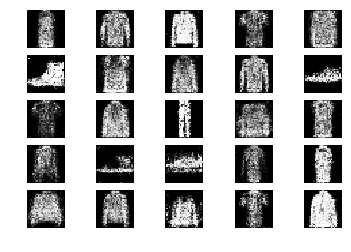

4351 [D loss: 0.769569, acc.: 43.75%] [G loss: 0.935534]
4352 [D loss: 0.630569, acc.: 64.06%] [G loss: 0.962093]
4353 [D loss: 0.629414, acc.: 67.19%] [G loss: 0.860083]
4354 [D loss: 0.616152, acc.: 62.50%] [G loss: 0.950250]
4355 [D loss: 0.678507, acc.: 56.25%] [G loss: 0.897964]
4356 [D loss: 0.627887, acc.: 62.50%] [G loss: 0.934846]
4357 [D loss: 0.664742, acc.: 62.50%] [G loss: 0.883543]
4358 [D loss: 0.713064, acc.: 56.25%] [G loss: 0.893024]
4359 [D loss: 0.659169, acc.: 65.62%] [G loss: 0.955985]
4360 [D loss: 0.656785, acc.: 59.38%] [G loss: 0.972872]
4361 [D loss: 0.668838, acc.: 59.38%] [G loss: 0.969347]
4362 [D loss: 0.703044, acc.: 53.12%] [G loss: 0.977648]
4363 [D loss: 0.683639, acc.: 57.81%] [G loss: 0.824435]
4364 [D loss: 0.643655, acc.: 64.06%] [G loss: 0.920269]
4365 [D loss: 0.618892, acc.: 64.06%] [G loss: 0.916813]
4366 [D loss: 0.631171, acc.: 68.75%] [G loss: 0.969633]
4367 [D loss: 0.638515, acc.: 67.19%] [G loss: 0.936518]
4368 [D loss: 0.584947, acc.: 7

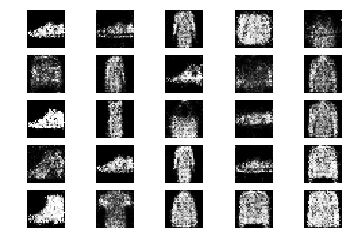

4401 [D loss: 0.659406, acc.: 57.81%] [G loss: 0.943285]
4402 [D loss: 0.663094, acc.: 57.81%] [G loss: 1.009888]
4403 [D loss: 0.660223, acc.: 54.69%] [G loss: 0.954004]
4404 [D loss: 0.684612, acc.: 53.12%] [G loss: 0.930012]
4405 [D loss: 0.657631, acc.: 56.25%] [G loss: 0.954533]
4406 [D loss: 0.688187, acc.: 50.00%] [G loss: 0.903607]
4407 [D loss: 0.585213, acc.: 70.31%] [G loss: 1.007927]
4408 [D loss: 0.662642, acc.: 57.81%] [G loss: 0.888903]
4409 [D loss: 0.591840, acc.: 71.88%] [G loss: 0.950933]
4410 [D loss: 0.614907, acc.: 65.62%] [G loss: 1.011851]
4411 [D loss: 0.655412, acc.: 65.62%] [G loss: 1.031847]
4412 [D loss: 0.657078, acc.: 64.06%] [G loss: 0.891299]
4413 [D loss: 0.631320, acc.: 65.62%] [G loss: 0.967210]
4414 [D loss: 0.604004, acc.: 68.75%] [G loss: 0.953146]
4415 [D loss: 0.670511, acc.: 57.81%] [G loss: 0.874605]
4416 [D loss: 0.640393, acc.: 70.31%] [G loss: 1.035271]
4417 [D loss: 0.655319, acc.: 62.50%] [G loss: 0.988103]
4418 [D loss: 0.613949, acc.: 6

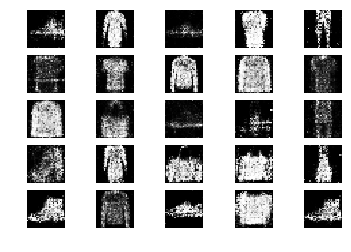

4451 [D loss: 0.630709, acc.: 67.19%] [G loss: 0.988328]
4452 [D loss: 0.602680, acc.: 64.06%] [G loss: 0.911882]
4453 [D loss: 0.636179, acc.: 70.31%] [G loss: 0.865767]
4454 [D loss: 0.597100, acc.: 73.44%] [G loss: 1.010259]
4455 [D loss: 0.610707, acc.: 71.88%] [G loss: 0.877738]
4456 [D loss: 0.656550, acc.: 62.50%] [G loss: 0.903687]
4457 [D loss: 0.612772, acc.: 64.06%] [G loss: 0.936487]
4458 [D loss: 0.657113, acc.: 59.38%] [G loss: 0.888443]
4459 [D loss: 0.633390, acc.: 68.75%] [G loss: 0.912297]
4460 [D loss: 0.568624, acc.: 73.44%] [G loss: 0.979548]
4461 [D loss: 0.647084, acc.: 60.94%] [G loss: 0.944703]
4462 [D loss: 0.680524, acc.: 53.12%] [G loss: 0.916088]
4463 [D loss: 0.652973, acc.: 51.56%] [G loss: 0.906900]
4464 [D loss: 0.696643, acc.: 50.00%] [G loss: 0.893464]
4465 [D loss: 0.750452, acc.: 39.06%] [G loss: 0.838305]
4466 [D loss: 0.691085, acc.: 57.81%] [G loss: 0.962605]
4467 [D loss: 0.695409, acc.: 51.56%] [G loss: 0.869710]
4468 [D loss: 0.713705, acc.: 5

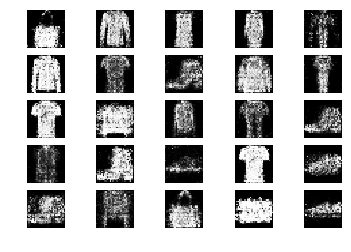

4501 [D loss: 0.683830, acc.: 57.81%] [G loss: 0.965009]
4502 [D loss: 0.635996, acc.: 56.25%] [G loss: 0.921913]
4503 [D loss: 0.696742, acc.: 59.38%] [G loss: 1.001227]
4504 [D loss: 0.650409, acc.: 60.94%] [G loss: 1.034447]
4505 [D loss: 0.694947, acc.: 57.81%] [G loss: 0.921836]
4506 [D loss: 0.699991, acc.: 54.69%] [G loss: 0.897846]
4507 [D loss: 0.607046, acc.: 68.75%] [G loss: 0.945686]
4508 [D loss: 0.626829, acc.: 64.06%] [G loss: 0.863302]
4509 [D loss: 0.642204, acc.: 60.94%] [G loss: 0.876819]
4510 [D loss: 0.692098, acc.: 57.81%] [G loss: 0.842724]
4511 [D loss: 0.645921, acc.: 59.38%] [G loss: 1.006199]
4512 [D loss: 0.657343, acc.: 62.50%] [G loss: 0.967395]
4513 [D loss: 0.608594, acc.: 70.31%] [G loss: 1.021599]
4514 [D loss: 0.665445, acc.: 56.25%] [G loss: 0.901149]
4515 [D loss: 0.648319, acc.: 60.94%] [G loss: 0.943543]
4516 [D loss: 0.649765, acc.: 60.94%] [G loss: 0.862475]
4517 [D loss: 0.689063, acc.: 57.81%] [G loss: 0.881040]
4518 [D loss: 0.638739, acc.: 6

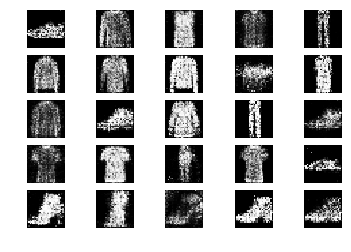

4551 [D loss: 0.710589, acc.: 53.12%] [G loss: 0.909370]
4552 [D loss: 0.684255, acc.: 57.81%] [G loss: 0.844609]
4553 [D loss: 0.638575, acc.: 67.19%] [G loss: 0.872113]
4554 [D loss: 0.645720, acc.: 54.69%] [G loss: 0.852285]
4555 [D loss: 0.691657, acc.: 60.94%] [G loss: 0.968078]
4556 [D loss: 0.690094, acc.: 56.25%] [G loss: 0.966257]
4557 [D loss: 0.647581, acc.: 65.62%] [G loss: 0.976871]
4558 [D loss: 0.619392, acc.: 68.75%] [G loss: 1.048015]
4559 [D loss: 0.657721, acc.: 60.94%] [G loss: 0.978905]
4560 [D loss: 0.646351, acc.: 68.75%] [G loss: 0.944386]
4561 [D loss: 0.664951, acc.: 60.94%] [G loss: 0.931601]
4562 [D loss: 0.693509, acc.: 54.69%] [G loss: 0.895158]
4563 [D loss: 0.641579, acc.: 59.38%] [G loss: 0.907193]
4564 [D loss: 0.722838, acc.: 57.81%] [G loss: 0.779495]
4565 [D loss: 0.682594, acc.: 56.25%] [G loss: 0.839737]
4566 [D loss: 0.648727, acc.: 62.50%] [G loss: 0.914269]
4567 [D loss: 0.721886, acc.: 53.12%] [G loss: 0.882835]
4568 [D loss: 0.706459, acc.: 4

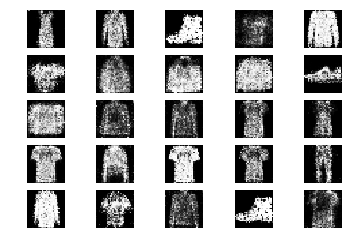

4601 [D loss: 0.653293, acc.: 60.94%] [G loss: 0.861357]
4602 [D loss: 0.639018, acc.: 62.50%] [G loss: 0.854491]
4603 [D loss: 0.686029, acc.: 50.00%] [G loss: 0.861257]
4604 [D loss: 0.693725, acc.: 53.12%] [G loss: 0.864816]
4605 [D loss: 0.590002, acc.: 73.44%] [G loss: 0.877919]
4606 [D loss: 0.576932, acc.: 68.75%] [G loss: 0.908250]
4607 [D loss: 0.630459, acc.: 67.19%] [G loss: 0.986248]
4608 [D loss: 0.702419, acc.: 59.38%] [G loss: 0.916064]
4609 [D loss: 0.641445, acc.: 64.06%] [G loss: 1.026757]
4610 [D loss: 0.660936, acc.: 56.25%] [G loss: 0.982839]
4611 [D loss: 0.657603, acc.: 60.94%] [G loss: 0.983790]
4612 [D loss: 0.652535, acc.: 70.31%] [G loss: 0.907217]
4613 [D loss: 0.658184, acc.: 59.38%] [G loss: 0.842722]
4614 [D loss: 0.653049, acc.: 57.81%] [G loss: 0.907746]
4615 [D loss: 0.622391, acc.: 68.75%] [G loss: 0.886302]
4616 [D loss: 0.630217, acc.: 59.38%] [G loss: 0.912798]
4617 [D loss: 0.670191, acc.: 56.25%] [G loss: 0.912710]
4618 [D loss: 0.663706, acc.: 6

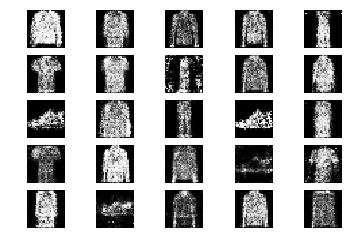

4651 [D loss: 0.650874, acc.: 60.94%] [G loss: 0.958408]
4652 [D loss: 0.616475, acc.: 68.75%] [G loss: 0.941542]
4653 [D loss: 0.677641, acc.: 62.50%] [G loss: 0.855931]
4654 [D loss: 0.689578, acc.: 59.38%] [G loss: 0.900358]
4655 [D loss: 0.651364, acc.: 68.75%] [G loss: 1.019964]
4656 [D loss: 0.659463, acc.: 60.94%] [G loss: 0.913465]
4657 [D loss: 0.738464, acc.: 54.69%] [G loss: 0.928905]
4658 [D loss: 0.743726, acc.: 50.00%] [G loss: 1.028702]
4659 [D loss: 0.740416, acc.: 48.44%] [G loss: 0.964060]
4660 [D loss: 0.673307, acc.: 62.50%] [G loss: 0.938587]
4661 [D loss: 0.723071, acc.: 51.56%] [G loss: 0.981289]
4662 [D loss: 0.670241, acc.: 56.25%] [G loss: 0.905512]
4663 [D loss: 0.700807, acc.: 56.25%] [G loss: 0.934972]
4664 [D loss: 0.639478, acc.: 64.06%] [G loss: 0.882454]
4665 [D loss: 0.660781, acc.: 57.81%] [G loss: 0.916825]
4666 [D loss: 0.627745, acc.: 65.62%] [G loss: 0.925944]
4667 [D loss: 0.639521, acc.: 59.38%] [G loss: 0.851900]
4668 [D loss: 0.653749, acc.: 6

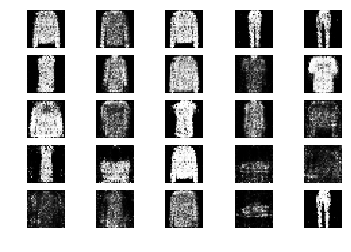

4701 [D loss: 0.617172, acc.: 70.31%] [G loss: 0.998460]
4702 [D loss: 0.585208, acc.: 67.19%] [G loss: 0.921526]
4703 [D loss: 0.708006, acc.: 56.25%] [G loss: 0.809957]
4704 [D loss: 0.668986, acc.: 51.56%] [G loss: 0.872136]
4705 [D loss: 0.645695, acc.: 57.81%] [G loss: 0.861486]
4706 [D loss: 0.602330, acc.: 65.62%] [G loss: 1.068875]
4707 [D loss: 0.742522, acc.: 45.31%] [G loss: 1.008168]
4708 [D loss: 0.680877, acc.: 56.25%] [G loss: 0.955411]
4709 [D loss: 0.632261, acc.: 64.06%] [G loss: 0.896911]
4710 [D loss: 0.580798, acc.: 73.44%] [G loss: 0.917974]
4711 [D loss: 0.653404, acc.: 59.38%] [G loss: 0.912297]
4712 [D loss: 0.649899, acc.: 56.25%] [G loss: 0.876961]
4713 [D loss: 0.704684, acc.: 48.44%] [G loss: 0.887858]
4714 [D loss: 0.688093, acc.: 54.69%] [G loss: 0.978690]
4715 [D loss: 0.751635, acc.: 50.00%] [G loss: 0.972274]
4716 [D loss: 0.610561, acc.: 67.19%] [G loss: 1.004401]
4717 [D loss: 0.654985, acc.: 59.38%] [G loss: 0.989483]
4718 [D loss: 0.651189, acc.: 6

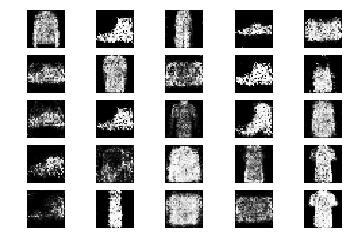

4751 [D loss: 0.667754, acc.: 54.69%] [G loss: 0.919367]
4752 [D loss: 0.680073, acc.: 50.00%] [G loss: 0.929917]
4753 [D loss: 0.694900, acc.: 57.81%] [G loss: 0.876649]
4754 [D loss: 0.602964, acc.: 67.19%] [G loss: 0.957944]
4755 [D loss: 0.698147, acc.: 51.56%] [G loss: 0.771998]
4756 [D loss: 0.659459, acc.: 56.25%] [G loss: 0.917653]
4757 [D loss: 0.699225, acc.: 54.69%] [G loss: 0.951355]
4758 [D loss: 0.639551, acc.: 60.94%] [G loss: 0.972571]
4759 [D loss: 0.621580, acc.: 71.88%] [G loss: 0.925481]
4760 [D loss: 0.637677, acc.: 57.81%] [G loss: 0.916273]
4761 [D loss: 0.620319, acc.: 70.31%] [G loss: 0.857579]
4762 [D loss: 0.698893, acc.: 57.81%] [G loss: 0.932150]
4763 [D loss: 0.711896, acc.: 48.44%] [G loss: 0.936963]
4764 [D loss: 0.640285, acc.: 64.06%] [G loss: 0.947656]
4765 [D loss: 0.653913, acc.: 60.94%] [G loss: 1.025725]
4766 [D loss: 0.690327, acc.: 59.38%] [G loss: 0.913253]
4767 [D loss: 0.621204, acc.: 68.75%] [G loss: 0.942630]
4768 [D loss: 0.666450, acc.: 5

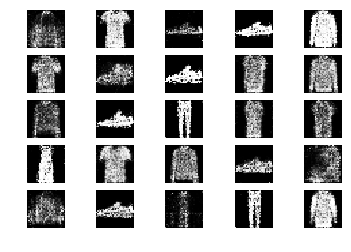

4801 [D loss: 0.649306, acc.: 62.50%] [G loss: 0.955159]
4802 [D loss: 0.631435, acc.: 68.75%] [G loss: 0.934852]
4803 [D loss: 0.622109, acc.: 71.88%] [G loss: 0.941748]
4804 [D loss: 0.649119, acc.: 60.94%] [G loss: 0.823172]
4805 [D loss: 0.733265, acc.: 50.00%] [G loss: 0.868206]
4806 [D loss: 0.669249, acc.: 59.38%] [G loss: 0.842046]
4807 [D loss: 0.614197, acc.: 62.50%] [G loss: 0.839746]
4808 [D loss: 0.675020, acc.: 56.25%] [G loss: 0.870900]
4809 [D loss: 0.685845, acc.: 59.38%] [G loss: 0.970782]
4810 [D loss: 0.636703, acc.: 65.62%] [G loss: 0.907353]
4811 [D loss: 0.652697, acc.: 64.06%] [G loss: 0.921468]
4812 [D loss: 0.636805, acc.: 70.31%] [G loss: 0.882016]
4813 [D loss: 0.705173, acc.: 54.69%] [G loss: 0.908716]
4814 [D loss: 0.543543, acc.: 76.56%] [G loss: 0.921217]
4815 [D loss: 0.648696, acc.: 59.38%] [G loss: 1.014468]
4816 [D loss: 0.621467, acc.: 65.62%] [G loss: 0.905048]
4817 [D loss: 0.697652, acc.: 56.25%] [G loss: 0.906528]
4818 [D loss: 0.645634, acc.: 5

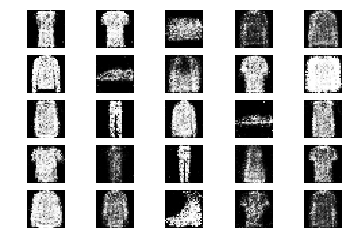

4851 [D loss: 0.658540, acc.: 62.50%] [G loss: 1.000066]
4852 [D loss: 0.674342, acc.: 59.38%] [G loss: 0.964604]
4853 [D loss: 0.652668, acc.: 56.25%] [G loss: 0.949805]
4854 [D loss: 0.580651, acc.: 70.31%] [G loss: 1.025381]
4855 [D loss: 0.592317, acc.: 68.75%] [G loss: 0.915795]
4856 [D loss: 0.641303, acc.: 57.81%] [G loss: 0.849077]
4857 [D loss: 0.678369, acc.: 59.38%] [G loss: 0.826193]
4858 [D loss: 0.663614, acc.: 59.38%] [G loss: 0.847513]
4859 [D loss: 0.618786, acc.: 67.19%] [G loss: 0.979883]
4860 [D loss: 0.632275, acc.: 62.50%] [G loss: 0.967596]
4861 [D loss: 0.618780, acc.: 64.06%] [G loss: 0.943754]
4862 [D loss: 0.643791, acc.: 60.94%] [G loss: 1.015087]
4863 [D loss: 0.652482, acc.: 57.81%] [G loss: 0.977037]
4864 [D loss: 0.609833, acc.: 62.50%] [G loss: 0.847088]
4865 [D loss: 0.642010, acc.: 56.25%] [G loss: 0.863427]
4866 [D loss: 0.663613, acc.: 62.50%] [G loss: 0.864695]
4867 [D loss: 0.660671, acc.: 64.06%] [G loss: 0.874278]
4868 [D loss: 0.644053, acc.: 6

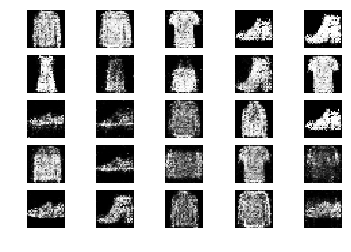

4901 [D loss: 0.625510, acc.: 65.62%] [G loss: 0.999161]
4902 [D loss: 0.638390, acc.: 65.62%] [G loss: 0.965739]
4903 [D loss: 0.699503, acc.: 57.81%] [G loss: 0.997988]
4904 [D loss: 0.711565, acc.: 57.81%] [G loss: 0.982443]
4905 [D loss: 0.672184, acc.: 57.81%] [G loss: 0.976006]
4906 [D loss: 0.645711, acc.: 65.62%] [G loss: 0.986086]
4907 [D loss: 0.688114, acc.: 56.25%] [G loss: 0.923958]
4908 [D loss: 0.559276, acc.: 75.00%] [G loss: 0.883955]
4909 [D loss: 0.674175, acc.: 56.25%] [G loss: 0.963507]
4910 [D loss: 0.646850, acc.: 59.38%] [G loss: 0.876478]
4911 [D loss: 0.661895, acc.: 65.62%] [G loss: 0.887705]
4912 [D loss: 0.633612, acc.: 65.62%] [G loss: 0.936147]
4913 [D loss: 0.671276, acc.: 65.62%] [G loss: 0.920431]
4914 [D loss: 0.659205, acc.: 60.94%] [G loss: 0.981740]
4915 [D loss: 0.658662, acc.: 59.38%] [G loss: 0.898484]
4916 [D loss: 0.614937, acc.: 65.62%] [G loss: 0.903280]
4917 [D loss: 0.596640, acc.: 67.19%] [G loss: 0.917291]
4918 [D loss: 0.650272, acc.: 6

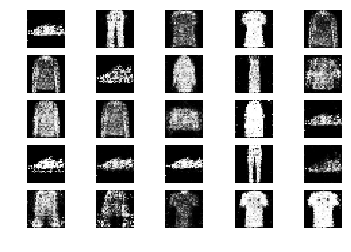

4951 [D loss: 0.634145, acc.: 65.62%] [G loss: 0.982065]
4952 [D loss: 0.682416, acc.: 59.38%] [G loss: 1.005660]
4953 [D loss: 0.615523, acc.: 65.62%] [G loss: 0.930140]
4954 [D loss: 0.686603, acc.: 50.00%] [G loss: 0.859179]
4955 [D loss: 0.626819, acc.: 64.06%] [G loss: 0.928001]
4956 [D loss: 0.637201, acc.: 57.81%] [G loss: 0.898262]
4957 [D loss: 0.714131, acc.: 53.12%] [G loss: 0.829144]
4958 [D loss: 0.636103, acc.: 64.06%] [G loss: 0.835631]
4959 [D loss: 0.585185, acc.: 70.31%] [G loss: 0.859653]
4960 [D loss: 0.603811, acc.: 68.75%] [G loss: 0.927108]
4961 [D loss: 0.649961, acc.: 60.94%] [G loss: 0.857102]
4962 [D loss: 0.631312, acc.: 64.06%] [G loss: 0.879261]
4963 [D loss: 0.678883, acc.: 54.69%] [G loss: 0.892104]
4964 [D loss: 0.673960, acc.: 56.25%] [G loss: 0.849623]
4965 [D loss: 0.703028, acc.: 48.44%] [G loss: 0.879753]
4966 [D loss: 0.696742, acc.: 56.25%] [G loss: 0.877416]
4967 [D loss: 0.692842, acc.: 62.50%] [G loss: 0.886314]
4968 [D loss: 0.675450, acc.: 6

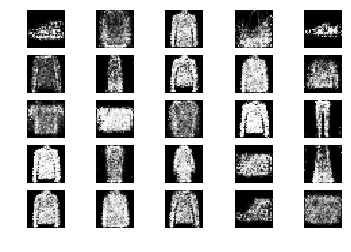

5001 [D loss: 0.687142, acc.: 64.06%] [G loss: 0.834975]
5002 [D loss: 0.622625, acc.: 73.44%] [G loss: 0.816745]
5003 [D loss: 0.682940, acc.: 51.56%] [G loss: 0.871182]
5004 [D loss: 0.651803, acc.: 56.25%] [G loss: 0.783577]
5005 [D loss: 0.640227, acc.: 67.19%] [G loss: 0.838732]
5006 [D loss: 0.641808, acc.: 54.69%] [G loss: 0.826747]
5007 [D loss: 0.606848, acc.: 64.06%] [G loss: 0.849108]
5008 [D loss: 0.649468, acc.: 59.38%] [G loss: 0.866777]
5009 [D loss: 0.634853, acc.: 62.50%] [G loss: 0.893935]
5010 [D loss: 0.594131, acc.: 75.00%] [G loss: 0.886150]
5011 [D loss: 0.649091, acc.: 59.38%] [G loss: 0.954028]
5012 [D loss: 0.673562, acc.: 56.25%] [G loss: 1.043741]
5013 [D loss: 0.602189, acc.: 65.62%] [G loss: 0.982721]
5014 [D loss: 0.651941, acc.: 57.81%] [G loss: 1.013272]
5015 [D loss: 0.666521, acc.: 67.19%] [G loss: 0.933439]
5016 [D loss: 0.630071, acc.: 64.06%] [G loss: 0.936642]
5017 [D loss: 0.637295, acc.: 62.50%] [G loss: 0.841295]
5018 [D loss: 0.623223, acc.: 6

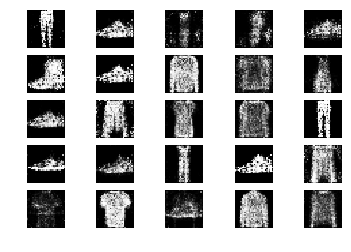

5051 [D loss: 0.619844, acc.: 64.06%] [G loss: 0.991427]
5052 [D loss: 0.661186, acc.: 56.25%] [G loss: 0.917281]
5053 [D loss: 0.583911, acc.: 64.06%] [G loss: 0.953570]
5054 [D loss: 0.620957, acc.: 67.19%] [G loss: 0.986272]
5055 [D loss: 0.617468, acc.: 62.50%] [G loss: 0.944090]
5056 [D loss: 0.643278, acc.: 62.50%] [G loss: 0.990073]
5057 [D loss: 0.651771, acc.: 62.50%] [G loss: 0.911955]
5058 [D loss: 0.635516, acc.: 53.12%] [G loss: 0.901337]
5059 [D loss: 0.732679, acc.: 51.56%] [G loss: 1.010388]
5060 [D loss: 0.652277, acc.: 53.12%] [G loss: 0.973361]
5061 [D loss: 0.681237, acc.: 57.81%] [G loss: 0.958324]
5062 [D loss: 0.666110, acc.: 53.12%] [G loss: 0.877501]
5063 [D loss: 0.663410, acc.: 54.69%] [G loss: 0.849750]
5064 [D loss: 0.651846, acc.: 57.81%] [G loss: 0.921765]
5065 [D loss: 0.680932, acc.: 56.25%] [G loss: 0.852664]
5066 [D loss: 0.637624, acc.: 65.62%] [G loss: 0.961724]
5067 [D loss: 0.642872, acc.: 60.94%] [G loss: 0.994611]
5068 [D loss: 0.711081, acc.: 5

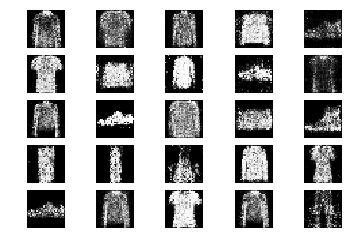

5101 [D loss: 0.674478, acc.: 64.06%] [G loss: 0.887240]
5102 [D loss: 0.684815, acc.: 51.56%] [G loss: 0.901772]
5103 [D loss: 0.704232, acc.: 54.69%] [G loss: 0.939153]
5104 [D loss: 0.680899, acc.: 57.81%] [G loss: 0.972806]
5105 [D loss: 0.679009, acc.: 57.81%] [G loss: 0.855919]
5106 [D loss: 0.653824, acc.: 67.19%] [G loss: 0.903304]
5107 [D loss: 0.676696, acc.: 57.81%] [G loss: 0.886071]
5108 [D loss: 0.713161, acc.: 51.56%] [G loss: 0.857107]
5109 [D loss: 0.666316, acc.: 60.94%] [G loss: 0.937940]
5110 [D loss: 0.605608, acc.: 67.19%] [G loss: 0.874885]
5111 [D loss: 0.602079, acc.: 71.88%] [G loss: 0.920786]
5112 [D loss: 0.633414, acc.: 62.50%] [G loss: 0.899448]
5113 [D loss: 0.671202, acc.: 62.50%] [G loss: 0.834747]
5114 [D loss: 0.661847, acc.: 68.75%] [G loss: 0.852279]
5115 [D loss: 0.584659, acc.: 67.19%] [G loss: 0.948079]
5116 [D loss: 0.636500, acc.: 65.62%] [G loss: 1.002393]
5117 [D loss: 0.637299, acc.: 62.50%] [G loss: 0.993270]
5118 [D loss: 0.641767, acc.: 6

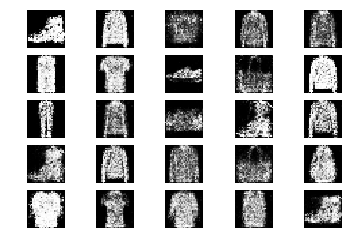

5151 [D loss: 0.712578, acc.: 48.44%] [G loss: 0.826877]
5152 [D loss: 0.651783, acc.: 57.81%] [G loss: 0.942094]
5153 [D loss: 0.621151, acc.: 64.06%] [G loss: 0.877815]
5154 [D loss: 0.636831, acc.: 70.31%] [G loss: 0.919477]
5155 [D loss: 0.601371, acc.: 65.62%] [G loss: 0.909345]
5156 [D loss: 0.719296, acc.: 56.25%] [G loss: 0.843058]
5157 [D loss: 0.628460, acc.: 57.81%] [G loss: 0.898941]
5158 [D loss: 0.706912, acc.: 60.94%] [G loss: 0.925951]
5159 [D loss: 0.693669, acc.: 54.69%] [G loss: 0.916563]
5160 [D loss: 0.653066, acc.: 60.94%] [G loss: 1.068689]
5161 [D loss: 0.695720, acc.: 57.81%] [G loss: 0.913419]
5162 [D loss: 0.631729, acc.: 59.38%] [G loss: 0.882271]
5163 [D loss: 0.579529, acc.: 71.88%] [G loss: 0.966383]
5164 [D loss: 0.683168, acc.: 60.94%] [G loss: 1.003315]
5165 [D loss: 0.621271, acc.: 70.31%] [G loss: 0.925101]
5166 [D loss: 0.643918, acc.: 56.25%] [G loss: 0.987821]
5167 [D loss: 0.631269, acc.: 64.06%] [G loss: 0.912954]
5168 [D loss: 0.655505, acc.: 6

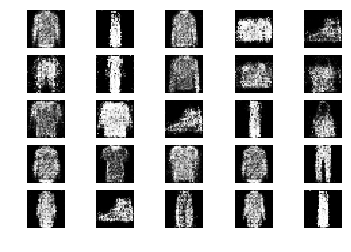

5201 [D loss: 0.662814, acc.: 65.62%] [G loss: 0.854987]
5202 [D loss: 0.627925, acc.: 71.88%] [G loss: 0.824672]
5203 [D loss: 0.682787, acc.: 59.38%] [G loss: 0.903777]
5204 [D loss: 0.667957, acc.: 57.81%] [G loss: 0.940188]
5205 [D loss: 0.629613, acc.: 60.94%] [G loss: 0.963250]
5206 [D loss: 0.609945, acc.: 67.19%] [G loss: 0.931197]
5207 [D loss: 0.671904, acc.: 53.12%] [G loss: 0.785932]
5208 [D loss: 0.591104, acc.: 75.00%] [G loss: 0.955334]
5209 [D loss: 0.629770, acc.: 70.31%] [G loss: 0.794517]
5210 [D loss: 0.662443, acc.: 64.06%] [G loss: 0.761194]
5211 [D loss: 0.616675, acc.: 65.62%] [G loss: 0.900958]
5212 [D loss: 0.663915, acc.: 60.94%] [G loss: 0.977026]
5213 [D loss: 0.683195, acc.: 64.06%] [G loss: 0.945473]
5214 [D loss: 0.649133, acc.: 64.06%] [G loss: 0.943296]
5215 [D loss: 0.591697, acc.: 68.75%] [G loss: 1.012724]
5216 [D loss: 0.670993, acc.: 56.25%] [G loss: 0.937749]
5217 [D loss: 0.676874, acc.: 67.19%] [G loss: 0.937840]
5218 [D loss: 0.677950, acc.: 5

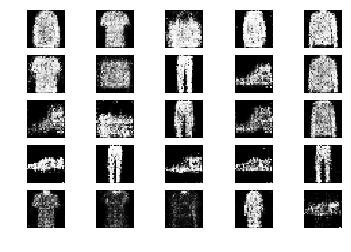

5251 [D loss: 0.633028, acc.: 59.38%] [G loss: 0.860695]
5252 [D loss: 0.614150, acc.: 64.06%] [G loss: 0.871838]
5253 [D loss: 0.595280, acc.: 64.06%] [G loss: 0.883556]
5254 [D loss: 0.735398, acc.: 59.38%] [G loss: 0.912056]
5255 [D loss: 0.655582, acc.: 60.94%] [G loss: 0.871894]
5256 [D loss: 0.603002, acc.: 60.94%] [G loss: 0.866718]
5257 [D loss: 0.643837, acc.: 64.06%] [G loss: 0.990472]
5258 [D loss: 0.712543, acc.: 56.25%] [G loss: 1.009849]
5259 [D loss: 0.646967, acc.: 64.06%] [G loss: 0.983008]
5260 [D loss: 0.654155, acc.: 62.50%] [G loss: 0.920278]
5261 [D loss: 0.676540, acc.: 56.25%] [G loss: 0.786240]
5262 [D loss: 0.650798, acc.: 59.38%] [G loss: 0.923788]
5263 [D loss: 0.643317, acc.: 67.19%] [G loss: 0.960708]
5264 [D loss: 0.660399, acc.: 64.06%] [G loss: 0.963860]
5265 [D loss: 0.625274, acc.: 67.19%] [G loss: 1.005334]
5266 [D loss: 0.627370, acc.: 65.62%] [G loss: 0.882420]
5267 [D loss: 0.625090, acc.: 62.50%] [G loss: 0.912510]
5268 [D loss: 0.652111, acc.: 5

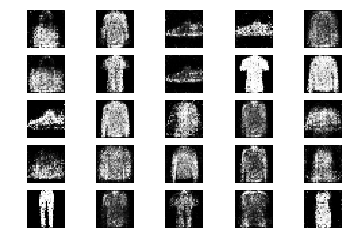

5301 [D loss: 0.630706, acc.: 67.19%] [G loss: 0.966809]
5302 [D loss: 0.707235, acc.: 50.00%] [G loss: 0.997491]
5303 [D loss: 0.656067, acc.: 64.06%] [G loss: 0.922274]
5304 [D loss: 0.615764, acc.: 67.19%] [G loss: 0.848409]
5305 [D loss: 0.657823, acc.: 59.38%] [G loss: 0.871639]
5306 [D loss: 0.567397, acc.: 75.00%] [G loss: 0.916016]
5307 [D loss: 0.651308, acc.: 67.19%] [G loss: 0.920358]
5308 [D loss: 0.649029, acc.: 62.50%] [G loss: 0.840379]
5309 [D loss: 0.680555, acc.: 65.62%] [G loss: 0.927573]
5310 [D loss: 0.664522, acc.: 59.38%] [G loss: 0.868893]
5311 [D loss: 0.648094, acc.: 57.81%] [G loss: 0.878272]
5312 [D loss: 0.630638, acc.: 60.94%] [G loss: 0.802060]
5313 [D loss: 0.677013, acc.: 57.81%] [G loss: 0.915592]
5314 [D loss: 0.599141, acc.: 67.19%] [G loss: 0.948378]
5315 [D loss: 0.624645, acc.: 62.50%] [G loss: 0.835953]
5316 [D loss: 0.639888, acc.: 62.50%] [G loss: 0.928137]
5317 [D loss: 0.654150, acc.: 59.38%] [G loss: 1.013486]
5318 [D loss: 0.615710, acc.: 6

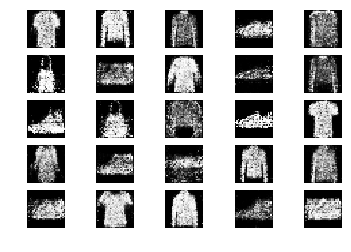

5351 [D loss: 0.749898, acc.: 46.88%] [G loss: 0.960605]
5352 [D loss: 0.720471, acc.: 50.00%] [G loss: 0.950336]
5353 [D loss: 0.634992, acc.: 64.06%] [G loss: 0.847233]
5354 [D loss: 0.653764, acc.: 56.25%] [G loss: 0.895844]
5355 [D loss: 0.628821, acc.: 62.50%] [G loss: 0.894788]
5356 [D loss: 0.728479, acc.: 51.56%] [G loss: 0.870906]
5357 [D loss: 0.724981, acc.: 59.38%] [G loss: 0.908094]
5358 [D loss: 0.644200, acc.: 62.50%] [G loss: 0.871340]
5359 [D loss: 0.680017, acc.: 57.81%] [G loss: 0.989157]
5360 [D loss: 0.687335, acc.: 60.94%] [G loss: 0.936254]
5361 [D loss: 0.626170, acc.: 64.06%] [G loss: 0.904969]
5362 [D loss: 0.640979, acc.: 65.62%] [G loss: 0.879844]
5363 [D loss: 0.673471, acc.: 59.38%] [G loss: 0.833977]
5364 [D loss: 0.720454, acc.: 53.12%] [G loss: 0.838645]
5365 [D loss: 0.656229, acc.: 59.38%] [G loss: 0.884386]
5366 [D loss: 0.608619, acc.: 64.06%] [G loss: 0.853963]
5367 [D loss: 0.631258, acc.: 65.62%] [G loss: 0.880547]
5368 [D loss: 0.638789, acc.: 6

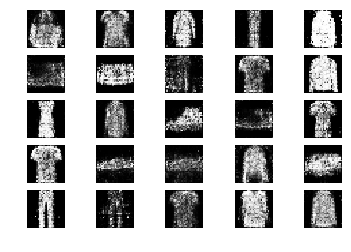

5401 [D loss: 0.635637, acc.: 64.06%] [G loss: 0.866495]
5402 [D loss: 0.632503, acc.: 67.19%] [G loss: 0.894742]
5403 [D loss: 0.616509, acc.: 68.75%] [G loss: 0.996987]
5404 [D loss: 0.630024, acc.: 70.31%] [G loss: 0.984903]
5405 [D loss: 0.623666, acc.: 62.50%] [G loss: 0.948039]
5406 [D loss: 0.611155, acc.: 68.75%] [G loss: 0.937342]
5407 [D loss: 0.689193, acc.: 56.25%] [G loss: 0.983797]
5408 [D loss: 0.664645, acc.: 59.38%] [G loss: 0.891568]
5409 [D loss: 0.628361, acc.: 64.06%] [G loss: 0.983547]
5410 [D loss: 0.621914, acc.: 70.31%] [G loss: 0.925471]
5411 [D loss: 0.649517, acc.: 60.94%] [G loss: 0.978952]
5412 [D loss: 0.644821, acc.: 59.38%] [G loss: 0.868776]
5413 [D loss: 0.555283, acc.: 75.00%] [G loss: 0.904511]
5414 [D loss: 0.658391, acc.: 60.94%] [G loss: 0.931634]
5415 [D loss: 0.591149, acc.: 71.88%] [G loss: 0.983164]
5416 [D loss: 0.609143, acc.: 64.06%] [G loss: 0.936159]
5417 [D loss: 0.704781, acc.: 48.44%] [G loss: 0.824010]
5418 [D loss: 0.662080, acc.: 6

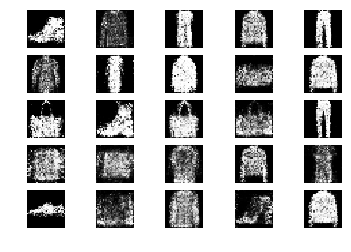

5451 [D loss: 0.588385, acc.: 65.62%] [G loss: 1.058226]
5452 [D loss: 0.648259, acc.: 59.38%] [G loss: 0.968213]
5453 [D loss: 0.630191, acc.: 62.50%] [G loss: 0.877814]
5454 [D loss: 0.632282, acc.: 67.19%] [G loss: 0.865339]
5455 [D loss: 0.679467, acc.: 56.25%] [G loss: 0.955549]
5456 [D loss: 0.634726, acc.: 64.06%] [G loss: 0.935733]
5457 [D loss: 0.653155, acc.: 64.06%] [G loss: 0.910083]
5458 [D loss: 0.632207, acc.: 64.06%] [G loss: 0.873240]
5459 [D loss: 0.608866, acc.: 64.06%] [G loss: 0.895799]
5460 [D loss: 0.607898, acc.: 70.31%] [G loss: 0.924781]
5461 [D loss: 0.625285, acc.: 62.50%] [G loss: 0.928801]
5462 [D loss: 0.705298, acc.: 54.69%] [G loss: 0.914442]
5463 [D loss: 0.790468, acc.: 43.75%] [G loss: 0.831229]
5464 [D loss: 0.641418, acc.: 57.81%] [G loss: 0.890898]
5465 [D loss: 0.703234, acc.: 51.56%] [G loss: 0.885214]
5466 [D loss: 0.660176, acc.: 60.94%] [G loss: 0.898828]
5467 [D loss: 0.616955, acc.: 64.06%] [G loss: 0.902556]
5468 [D loss: 0.627678, acc.: 6

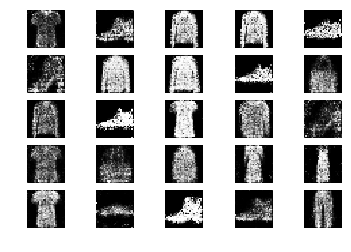

5501 [D loss: 0.609349, acc.: 67.19%] [G loss: 0.899653]
5502 [D loss: 0.641768, acc.: 67.19%] [G loss: 0.868478]
5503 [D loss: 0.700070, acc.: 56.25%] [G loss: 0.825909]
5504 [D loss: 0.623248, acc.: 65.62%] [G loss: 0.915941]
5505 [D loss: 0.639674, acc.: 59.38%] [G loss: 0.849230]
5506 [D loss: 0.646192, acc.: 57.81%] [G loss: 0.975638]
5507 [D loss: 0.660725, acc.: 60.94%] [G loss: 0.868286]
5508 [D loss: 0.718788, acc.: 48.44%] [G loss: 0.879905]
5509 [D loss: 0.620576, acc.: 70.31%] [G loss: 0.921636]
5510 [D loss: 0.628275, acc.: 65.62%] [G loss: 0.977309]
5511 [D loss: 0.625568, acc.: 65.62%] [G loss: 0.896592]
5512 [D loss: 0.627030, acc.: 59.38%] [G loss: 0.889215]
5513 [D loss: 0.761898, acc.: 48.44%] [G loss: 0.930705]
5514 [D loss: 0.634702, acc.: 64.06%] [G loss: 0.888752]
5515 [D loss: 0.646502, acc.: 65.62%] [G loss: 0.845334]
5516 [D loss: 0.638622, acc.: 65.62%] [G loss: 0.944829]
5517 [D loss: 0.692903, acc.: 48.44%] [G loss: 0.803467]
5518 [D loss: 0.700176, acc.: 6

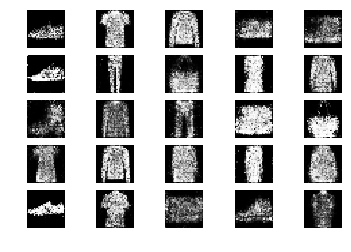

5551 [D loss: 0.612286, acc.: 67.19%] [G loss: 0.977285]
5552 [D loss: 0.611647, acc.: 64.06%] [G loss: 0.927532]
5553 [D loss: 0.655510, acc.: 57.81%] [G loss: 0.970545]
5554 [D loss: 0.688131, acc.: 56.25%] [G loss: 0.886869]
5555 [D loss: 0.713835, acc.: 53.12%] [G loss: 0.925830]
5556 [D loss: 0.627072, acc.: 65.62%] [G loss: 0.951950]
5557 [D loss: 0.638945, acc.: 53.12%] [G loss: 0.958401]
5558 [D loss: 0.743489, acc.: 46.88%] [G loss: 0.774103]
5559 [D loss: 0.673065, acc.: 57.81%] [G loss: 0.773714]
5560 [D loss: 0.645999, acc.: 62.50%] [G loss: 0.830819]
5561 [D loss: 0.640377, acc.: 62.50%] [G loss: 0.822077]
5562 [D loss: 0.671166, acc.: 57.81%] [G loss: 0.965505]
5563 [D loss: 0.640877, acc.: 56.25%] [G loss: 0.919633]
5564 [D loss: 0.646639, acc.: 64.06%] [G loss: 0.922091]
5565 [D loss: 0.632715, acc.: 62.50%] [G loss: 0.781363]
5566 [D loss: 0.658363, acc.: 56.25%] [G loss: 0.981241]
5567 [D loss: 0.603816, acc.: 70.31%] [G loss: 0.925634]
5568 [D loss: 0.666631, acc.: 6

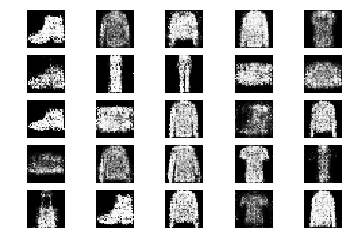

5601 [D loss: 0.656336, acc.: 57.81%] [G loss: 0.865723]
5602 [D loss: 0.581169, acc.: 70.31%] [G loss: 0.919466]
5603 [D loss: 0.671782, acc.: 53.12%] [G loss: 0.933666]
5604 [D loss: 0.619259, acc.: 68.75%] [G loss: 0.965434]
5605 [D loss: 0.643105, acc.: 56.25%] [G loss: 0.851103]
5606 [D loss: 0.646957, acc.: 62.50%] [G loss: 0.924212]
5607 [D loss: 0.680724, acc.: 62.50%] [G loss: 1.061059]
5608 [D loss: 0.678966, acc.: 59.38%] [G loss: 0.955297]
5609 [D loss: 0.679522, acc.: 57.81%] [G loss: 0.986603]
5610 [D loss: 0.698349, acc.: 50.00%] [G loss: 0.892061]
5611 [D loss: 0.639802, acc.: 64.06%] [G loss: 0.946854]
5612 [D loss: 0.707323, acc.: 56.25%] [G loss: 0.998657]
5613 [D loss: 0.737876, acc.: 43.75%] [G loss: 0.977698]
5614 [D loss: 0.656797, acc.: 60.94%] [G loss: 0.999844]
5615 [D loss: 0.645187, acc.: 64.06%] [G loss: 0.906462]
5616 [D loss: 0.618866, acc.: 59.38%] [G loss: 0.943526]
5617 [D loss: 0.710723, acc.: 51.56%] [G loss: 0.929845]
5618 [D loss: 0.616267, acc.: 6

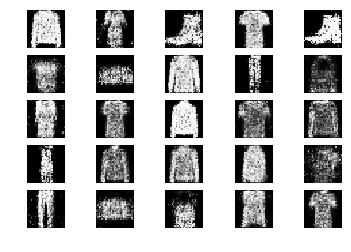

5651 [D loss: 0.677096, acc.: 57.81%] [G loss: 0.882867]
5652 [D loss: 0.668191, acc.: 54.69%] [G loss: 0.914489]
5653 [D loss: 0.679666, acc.: 59.38%] [G loss: 0.961813]
5654 [D loss: 0.658407, acc.: 62.50%] [G loss: 0.863125]
5655 [D loss: 0.625340, acc.: 60.94%] [G loss: 0.924489]
5656 [D loss: 0.695864, acc.: 54.69%] [G loss: 0.958911]
5657 [D loss: 0.627905, acc.: 64.06%] [G loss: 0.865229]
5658 [D loss: 0.620401, acc.: 64.06%] [G loss: 0.847610]
5659 [D loss: 0.653617, acc.: 57.81%] [G loss: 0.897287]
5660 [D loss: 0.657932, acc.: 64.06%] [G loss: 0.864462]
5661 [D loss: 0.597777, acc.: 67.19%] [G loss: 0.969799]
5662 [D loss: 0.663398, acc.: 60.94%] [G loss: 0.964707]
5663 [D loss: 0.601848, acc.: 71.88%] [G loss: 0.888108]
5664 [D loss: 0.645893, acc.: 57.81%] [G loss: 0.885841]
5665 [D loss: 0.670390, acc.: 60.94%] [G loss: 0.918459]
5666 [D loss: 0.685518, acc.: 62.50%] [G loss: 0.870371]
5667 [D loss: 0.622632, acc.: 65.62%] [G loss: 0.823680]
5668 [D loss: 0.598917, acc.: 7

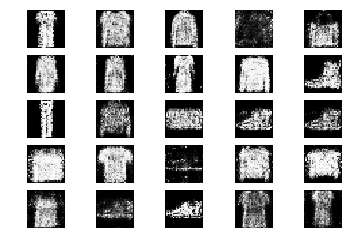

5701 [D loss: 0.648319, acc.: 64.06%] [G loss: 0.840197]
5702 [D loss: 0.635176, acc.: 56.25%] [G loss: 0.912571]
5703 [D loss: 0.663757, acc.: 65.62%] [G loss: 0.927440]
5704 [D loss: 0.645729, acc.: 62.50%] [G loss: 0.875823]
5705 [D loss: 0.676116, acc.: 56.25%] [G loss: 0.807603]
5706 [D loss: 0.650298, acc.: 59.38%] [G loss: 0.881664]
5707 [D loss: 0.642696, acc.: 60.94%] [G loss: 0.852405]
5708 [D loss: 0.634472, acc.: 56.25%] [G loss: 0.916929]
5709 [D loss: 0.637959, acc.: 65.62%] [G loss: 0.903559]
5710 [D loss: 0.602915, acc.: 68.75%] [G loss: 0.876432]
5711 [D loss: 0.633062, acc.: 67.19%] [G loss: 0.977439]
5712 [D loss: 0.644816, acc.: 59.38%] [G loss: 0.824998]
5713 [D loss: 0.653141, acc.: 60.94%] [G loss: 0.890897]
5714 [D loss: 0.644055, acc.: 60.94%] [G loss: 0.926275]
5715 [D loss: 0.663617, acc.: 62.50%] [G loss: 0.963558]
5716 [D loss: 0.655466, acc.: 68.75%] [G loss: 0.936973]
5717 [D loss: 0.624651, acc.: 67.19%] [G loss: 0.985936]
5718 [D loss: 0.658659, acc.: 5

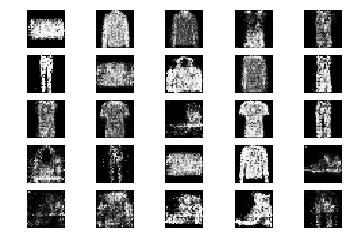

5751 [D loss: 0.600861, acc.: 67.19%] [G loss: 0.908747]
5752 [D loss: 0.618047, acc.: 68.75%] [G loss: 0.895221]
5753 [D loss: 0.700444, acc.: 51.56%] [G loss: 0.857432]
5754 [D loss: 0.561238, acc.: 76.56%] [G loss: 0.935882]
5755 [D loss: 0.682831, acc.: 57.81%] [G loss: 0.896878]
5756 [D loss: 0.659411, acc.: 62.50%] [G loss: 0.875542]
5757 [D loss: 0.709591, acc.: 57.81%] [G loss: 0.947781]
5758 [D loss: 0.659259, acc.: 60.94%] [G loss: 0.933462]
5759 [D loss: 0.669527, acc.: 62.50%] [G loss: 0.856450]
5760 [D loss: 0.597942, acc.: 67.19%] [G loss: 0.902082]
5761 [D loss: 0.680550, acc.: 48.44%] [G loss: 0.868428]
5762 [D loss: 0.650926, acc.: 70.31%] [G loss: 0.848283]
5763 [D loss: 0.631748, acc.: 64.06%] [G loss: 0.883243]
5764 [D loss: 0.598680, acc.: 67.19%] [G loss: 0.943115]
5765 [D loss: 0.599785, acc.: 70.31%] [G loss: 0.889191]
5766 [D loss: 0.671113, acc.: 56.25%] [G loss: 0.887334]
5767 [D loss: 0.704582, acc.: 60.94%] [G loss: 0.895491]
5768 [D loss: 0.610599, acc.: 6

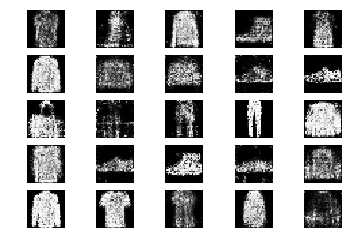

5801 [D loss: 0.658403, acc.: 60.94%] [G loss: 0.880660]
5802 [D loss: 0.592772, acc.: 62.50%] [G loss: 0.884711]
5803 [D loss: 0.615903, acc.: 68.75%] [G loss: 0.915504]
5804 [D loss: 0.615880, acc.: 65.62%] [G loss: 0.931361]
5805 [D loss: 0.660697, acc.: 57.81%] [G loss: 0.995721]
5806 [D loss: 0.688951, acc.: 54.69%] [G loss: 0.936479]
5807 [D loss: 0.645622, acc.: 64.06%] [G loss: 0.879359]
5808 [D loss: 0.642966, acc.: 59.38%] [G loss: 1.020660]
5809 [D loss: 0.621847, acc.: 70.31%] [G loss: 1.042343]
5810 [D loss: 0.686646, acc.: 57.81%] [G loss: 0.970119]
5811 [D loss: 0.634185, acc.: 68.75%] [G loss: 0.942525]
5812 [D loss: 0.608754, acc.: 65.62%] [G loss: 0.945098]
5813 [D loss: 0.632247, acc.: 60.94%] [G loss: 0.935854]
5814 [D loss: 0.650760, acc.: 70.31%] [G loss: 0.946437]
5815 [D loss: 0.596539, acc.: 73.44%] [G loss: 0.997296]
5816 [D loss: 0.685078, acc.: 60.94%] [G loss: 0.973878]
5817 [D loss: 0.648024, acc.: 68.75%] [G loss: 0.894744]
5818 [D loss: 0.629110, acc.: 6

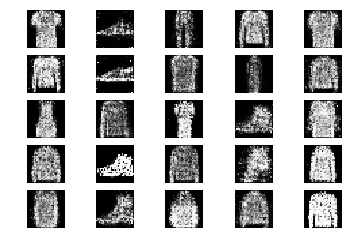

5851 [D loss: 0.650725, acc.: 67.19%] [G loss: 0.839901]
5852 [D loss: 0.667906, acc.: 65.62%] [G loss: 0.918764]
5853 [D loss: 0.670699, acc.: 54.69%] [G loss: 0.922783]
5854 [D loss: 0.639761, acc.: 62.50%] [G loss: 0.941563]
5855 [D loss: 0.637945, acc.: 64.06%] [G loss: 0.963374]
5856 [D loss: 0.642920, acc.: 59.38%] [G loss: 1.007397]
5857 [D loss: 0.640814, acc.: 62.50%] [G loss: 0.930149]
5858 [D loss: 0.630981, acc.: 60.94%] [G loss: 0.862250]
5859 [D loss: 0.617580, acc.: 65.62%] [G loss: 0.994544]
5860 [D loss: 0.702136, acc.: 50.00%] [G loss: 0.903292]
5861 [D loss: 0.714597, acc.: 54.69%] [G loss: 0.940964]
5862 [D loss: 0.667736, acc.: 57.81%] [G loss: 0.994943]
5863 [D loss: 0.691297, acc.: 56.25%] [G loss: 0.983667]
5864 [D loss: 0.605495, acc.: 62.50%] [G loss: 0.904768]
5865 [D loss: 0.601977, acc.: 68.75%] [G loss: 0.886595]
5866 [D loss: 0.629913, acc.: 60.94%] [G loss: 0.884203]
5867 [D loss: 0.717164, acc.: 50.00%] [G loss: 0.986635]
5868 [D loss: 0.647601, acc.: 6

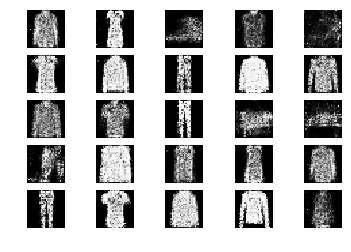

5901 [D loss: 0.609846, acc.: 70.31%] [G loss: 0.896875]
5902 [D loss: 0.668963, acc.: 60.94%] [G loss: 0.911493]
5903 [D loss: 0.706775, acc.: 56.25%] [G loss: 0.865128]
5904 [D loss: 0.753959, acc.: 46.88%] [G loss: 0.782504]
5905 [D loss: 0.662486, acc.: 48.44%] [G loss: 0.833701]
5906 [D loss: 0.664032, acc.: 57.81%] [G loss: 0.856237]
5907 [D loss: 0.709105, acc.: 50.00%] [G loss: 0.964200]
5908 [D loss: 0.690519, acc.: 56.25%] [G loss: 0.869381]
5909 [D loss: 0.660512, acc.: 56.25%] [G loss: 0.932218]
5910 [D loss: 0.655455, acc.: 64.06%] [G loss: 0.948158]
5911 [D loss: 0.704200, acc.: 56.25%] [G loss: 0.889111]
5912 [D loss: 0.626040, acc.: 65.62%] [G loss: 0.953350]
5913 [D loss: 0.549926, acc.: 78.12%] [G loss: 0.949932]
5914 [D loss: 0.652597, acc.: 67.19%] [G loss: 0.943162]
5915 [D loss: 0.706308, acc.: 54.69%] [G loss: 0.951037]
5916 [D loss: 0.660586, acc.: 62.50%] [G loss: 0.874048]
5917 [D loss: 0.664863, acc.: 59.38%] [G loss: 0.929860]
5918 [D loss: 0.649894, acc.: 7

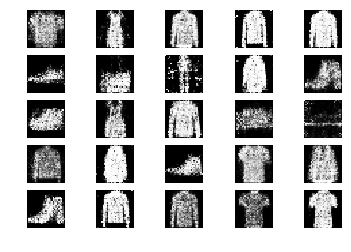

5951 [D loss: 0.688073, acc.: 60.94%] [G loss: 0.852398]
5952 [D loss: 0.637305, acc.: 65.62%] [G loss: 0.826781]
5953 [D loss: 0.652820, acc.: 60.94%] [G loss: 0.831728]
5954 [D loss: 0.653781, acc.: 56.25%] [G loss: 0.834266]
5955 [D loss: 0.647589, acc.: 60.94%] [G loss: 0.845292]
5956 [D loss: 0.616053, acc.: 62.50%] [G loss: 0.907521]
5957 [D loss: 0.686292, acc.: 54.69%] [G loss: 0.937136]
5958 [D loss: 0.662957, acc.: 51.56%] [G loss: 0.979086]
5959 [D loss: 0.643332, acc.: 68.75%] [G loss: 1.019022]
5960 [D loss: 0.677375, acc.: 57.81%] [G loss: 0.972114]
5961 [D loss: 0.654503, acc.: 60.94%] [G loss: 1.017760]
5962 [D loss: 0.657767, acc.: 60.94%] [G loss: 0.930519]
5963 [D loss: 0.642203, acc.: 59.38%] [G loss: 0.910622]
5964 [D loss: 0.605716, acc.: 65.62%] [G loss: 0.953124]
5965 [D loss: 0.638045, acc.: 68.75%] [G loss: 0.880863]
5966 [D loss: 0.622650, acc.: 68.75%] [G loss: 0.932000]
5967 [D loss: 0.710886, acc.: 51.56%] [G loss: 0.844804]
5968 [D loss: 0.611426, acc.: 6

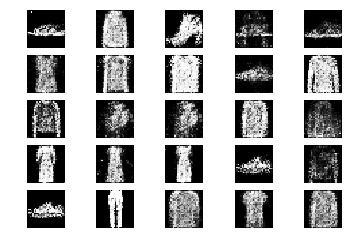

6001 [D loss: 0.618708, acc.: 65.62%] [G loss: 1.026096]
6002 [D loss: 0.643315, acc.: 59.38%] [G loss: 0.922651]
6003 [D loss: 0.624144, acc.: 67.19%] [G loss: 0.923570]
6004 [D loss: 0.628848, acc.: 67.19%] [G loss: 0.885345]
6005 [D loss: 0.623370, acc.: 64.06%] [G loss: 0.837793]
6006 [D loss: 0.683160, acc.: 56.25%] [G loss: 0.890751]
6007 [D loss: 0.685798, acc.: 57.81%] [G loss: 0.837347]
6008 [D loss: 0.622385, acc.: 64.06%] [G loss: 0.979595]
6009 [D loss: 0.627244, acc.: 62.50%] [G loss: 0.933886]
6010 [D loss: 0.676379, acc.: 62.50%] [G loss: 0.963602]
6011 [D loss: 0.675102, acc.: 54.69%] [G loss: 0.915717]
6012 [D loss: 0.658203, acc.: 54.69%] [G loss: 0.974751]
6013 [D loss: 0.691515, acc.: 54.69%] [G loss: 0.941482]
6014 [D loss: 0.654541, acc.: 67.19%] [G loss: 0.880399]
6015 [D loss: 0.629609, acc.: 65.62%] [G loss: 0.936800]
6016 [D loss: 0.675824, acc.: 57.81%] [G loss: 0.967467]
6017 [D loss: 0.622432, acc.: 71.88%] [G loss: 0.983895]
6018 [D loss: 0.679805, acc.: 6

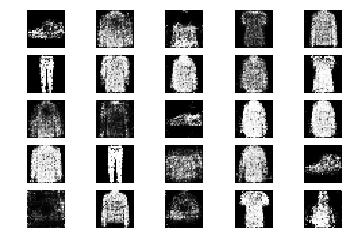

6051 [D loss: 0.664256, acc.: 57.81%] [G loss: 0.915652]
6052 [D loss: 0.615410, acc.: 68.75%] [G loss: 0.974368]
6053 [D loss: 0.663802, acc.: 59.38%] [G loss: 0.862811]
6054 [D loss: 0.673583, acc.: 57.81%] [G loss: 0.851581]
6055 [D loss: 0.735236, acc.: 51.56%] [G loss: 0.890042]
6056 [D loss: 0.616794, acc.: 64.06%] [G loss: 0.915029]
6057 [D loss: 0.563331, acc.: 75.00%] [G loss: 0.878300]
6058 [D loss: 0.717370, acc.: 60.94%] [G loss: 0.815158]
6059 [D loss: 0.623099, acc.: 65.62%] [G loss: 0.992976]
6060 [D loss: 0.618604, acc.: 67.19%] [G loss: 0.881522]
6061 [D loss: 0.700966, acc.: 57.81%] [G loss: 0.840980]
6062 [D loss: 0.696717, acc.: 46.88%] [G loss: 0.850868]
6063 [D loss: 0.686812, acc.: 59.38%] [G loss: 0.782394]
6064 [D loss: 0.654801, acc.: 60.94%] [G loss: 0.858521]
6065 [D loss: 0.603956, acc.: 70.31%] [G loss: 0.846961]
6066 [D loss: 0.574698, acc.: 68.75%] [G loss: 0.930649]
6067 [D loss: 0.700419, acc.: 57.81%] [G loss: 0.955731]
6068 [D loss: 0.618368, acc.: 6

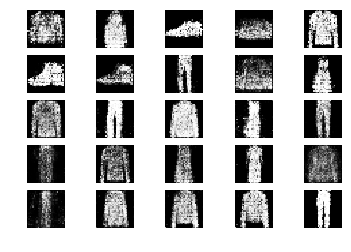

6101 [D loss: 0.647642, acc.: 65.62%] [G loss: 0.911283]
6102 [D loss: 0.605433, acc.: 71.88%] [G loss: 0.926781]
6103 [D loss: 0.632738, acc.: 56.25%] [G loss: 0.960495]
6104 [D loss: 0.588579, acc.: 65.62%] [G loss: 0.950721]
6105 [D loss: 0.584084, acc.: 65.62%] [G loss: 1.055512]
6106 [D loss: 0.709919, acc.: 53.12%] [G loss: 1.121209]
6107 [D loss: 0.718508, acc.: 53.12%] [G loss: 0.966274]
6108 [D loss: 0.657734, acc.: 60.94%] [G loss: 0.943246]
6109 [D loss: 0.678587, acc.: 60.94%] [G loss: 0.839132]
6110 [D loss: 0.664997, acc.: 57.81%] [G loss: 0.974020]
6111 [D loss: 0.654740, acc.: 57.81%] [G loss: 0.989116]
6112 [D loss: 0.707195, acc.: 48.44%] [G loss: 0.912453]
6113 [D loss: 0.661469, acc.: 57.81%] [G loss: 0.939895]
6114 [D loss: 0.673229, acc.: 62.50%] [G loss: 0.917057]
6115 [D loss: 0.652094, acc.: 59.38%] [G loss: 0.944612]
6116 [D loss: 0.631651, acc.: 64.06%] [G loss: 0.866929]
6117 [D loss: 0.689223, acc.: 53.12%] [G loss: 0.904372]
6118 [D loss: 0.651913, acc.: 6

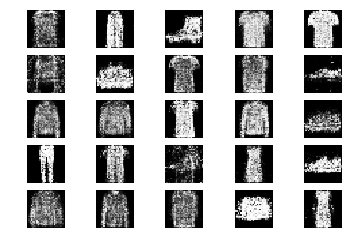

6151 [D loss: 0.625836, acc.: 65.62%] [G loss: 0.867643]
6152 [D loss: 0.671613, acc.: 56.25%] [G loss: 0.898758]
6153 [D loss: 0.712259, acc.: 46.88%] [G loss: 0.948463]
6154 [D loss: 0.675004, acc.: 54.69%] [G loss: 0.948958]
6155 [D loss: 0.667148, acc.: 56.25%] [G loss: 0.938145]
6156 [D loss: 0.703673, acc.: 50.00%] [G loss: 0.944187]
6157 [D loss: 0.654910, acc.: 62.50%] [G loss: 0.936939]
6158 [D loss: 0.610757, acc.: 71.88%] [G loss: 0.868045]
6159 [D loss: 0.623119, acc.: 68.75%] [G loss: 0.909271]
6160 [D loss: 0.666635, acc.: 50.00%] [G loss: 0.923747]
6161 [D loss: 0.725179, acc.: 48.44%] [G loss: 0.955218]
6162 [D loss: 0.689326, acc.: 57.81%] [G loss: 0.897326]
6163 [D loss: 0.629650, acc.: 59.38%] [G loss: 0.885161]
6164 [D loss: 0.699613, acc.: 54.69%] [G loss: 0.897869]
6165 [D loss: 0.630397, acc.: 60.94%] [G loss: 0.848495]
6166 [D loss: 0.650677, acc.: 57.81%] [G loss: 0.832727]
6167 [D loss: 0.658382, acc.: 62.50%] [G loss: 0.944833]
6168 [D loss: 0.683036, acc.: 6

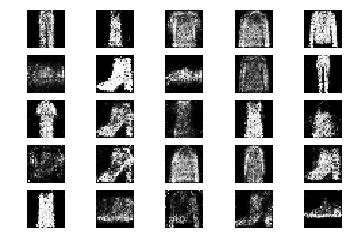

6201 [D loss: 0.612233, acc.: 71.88%] [G loss: 0.971080]
6202 [D loss: 0.646163, acc.: 62.50%] [G loss: 0.926754]
6203 [D loss: 0.635477, acc.: 59.38%] [G loss: 1.032414]
6204 [D loss: 0.646190, acc.: 62.50%] [G loss: 0.907680]
6205 [D loss: 0.653211, acc.: 59.38%] [G loss: 0.872534]
6206 [D loss: 0.668101, acc.: 60.94%] [G loss: 0.848568]
6207 [D loss: 0.626775, acc.: 64.06%] [G loss: 0.948244]
6208 [D loss: 0.687534, acc.: 59.38%] [G loss: 0.903947]
6209 [D loss: 0.622030, acc.: 62.50%] [G loss: 0.930760]
6210 [D loss: 0.662059, acc.: 56.25%] [G loss: 0.939762]
6211 [D loss: 0.676540, acc.: 59.38%] [G loss: 0.890209]
6212 [D loss: 0.648745, acc.: 59.38%] [G loss: 0.871830]
6213 [D loss: 0.610800, acc.: 59.38%] [G loss: 0.926637]
6214 [D loss: 0.606757, acc.: 68.75%] [G loss: 0.965757]
6215 [D loss: 0.721593, acc.: 51.56%] [G loss: 0.859430]
6216 [D loss: 0.702326, acc.: 56.25%] [G loss: 1.062652]
6217 [D loss: 0.660290, acc.: 60.94%] [G loss: 1.050387]
6218 [D loss: 0.602779, acc.: 6

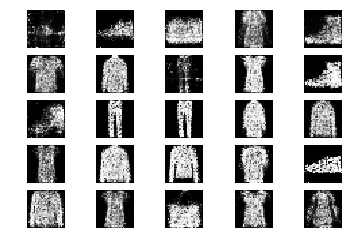

6251 [D loss: 0.642658, acc.: 64.06%] [G loss: 1.029083]
6252 [D loss: 0.651365, acc.: 67.19%] [G loss: 1.009870]
6253 [D loss: 0.702822, acc.: 60.94%] [G loss: 0.957137]
6254 [D loss: 0.619379, acc.: 70.31%] [G loss: 0.961106]
6255 [D loss: 0.644208, acc.: 70.31%] [G loss: 0.931878]
6256 [D loss: 0.678252, acc.: 54.69%] [G loss: 0.895179]
6257 [D loss: 0.551491, acc.: 81.25%] [G loss: 0.973796]
6258 [D loss: 0.659126, acc.: 64.06%] [G loss: 0.911900]
6259 [D loss: 0.632597, acc.: 60.94%] [G loss: 0.948398]
6260 [D loss: 0.604504, acc.: 67.19%] [G loss: 0.913726]
6261 [D loss: 0.702290, acc.: 54.69%] [G loss: 0.852206]
6262 [D loss: 0.655036, acc.: 60.94%] [G loss: 0.971236]
6263 [D loss: 0.646250, acc.: 59.38%] [G loss: 0.940126]
6264 [D loss: 0.721788, acc.: 53.12%] [G loss: 0.942373]
6265 [D loss: 0.681433, acc.: 54.69%] [G loss: 0.857481]
6266 [D loss: 0.638471, acc.: 60.94%] [G loss: 0.910626]
6267 [D loss: 0.657178, acc.: 51.56%] [G loss: 0.907844]
6268 [D loss: 0.691799, acc.: 5

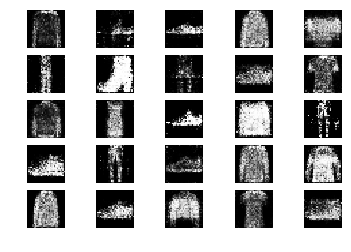

6301 [D loss: 0.611716, acc.: 68.75%] [G loss: 0.886189]
6302 [D loss: 0.663457, acc.: 62.50%] [G loss: 0.915010]
6303 [D loss: 0.668739, acc.: 59.38%] [G loss: 0.860391]
6304 [D loss: 0.645535, acc.: 70.31%] [G loss: 0.890301]
6305 [D loss: 0.717589, acc.: 54.69%] [G loss: 0.905973]
6306 [D loss: 0.592295, acc.: 67.19%] [G loss: 0.860369]
6307 [D loss: 0.604034, acc.: 62.50%] [G loss: 0.952982]
6308 [D loss: 0.666279, acc.: 60.94%] [G loss: 0.900108]
6309 [D loss: 0.709861, acc.: 50.00%] [G loss: 0.959034]
6310 [D loss: 0.620840, acc.: 64.06%] [G loss: 0.914515]
6311 [D loss: 0.676867, acc.: 62.50%] [G loss: 1.012789]
6312 [D loss: 0.611782, acc.: 79.69%] [G loss: 0.920319]
6313 [D loss: 0.603433, acc.: 65.62%] [G loss: 0.919233]
6314 [D loss: 0.651371, acc.: 62.50%] [G loss: 0.859216]
6315 [D loss: 0.669441, acc.: 64.06%] [G loss: 0.869686]
6316 [D loss: 0.579398, acc.: 71.88%] [G loss: 0.924283]
6317 [D loss: 0.660348, acc.: 62.50%] [G loss: 0.930328]
6318 [D loss: 0.736596, acc.: 5

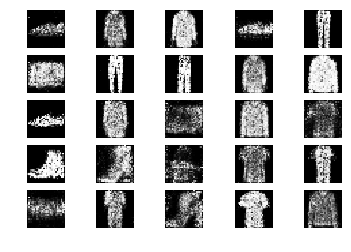

6351 [D loss: 0.682807, acc.: 54.69%] [G loss: 0.828197]
6352 [D loss: 0.636555, acc.: 62.50%] [G loss: 0.872894]
6353 [D loss: 0.653385, acc.: 62.50%] [G loss: 0.869410]
6354 [D loss: 0.610121, acc.: 71.88%] [G loss: 0.765769]
6355 [D loss: 0.652669, acc.: 57.81%] [G loss: 0.867319]
6356 [D loss: 0.686694, acc.: 62.50%] [G loss: 0.901403]
6357 [D loss: 0.688261, acc.: 57.81%] [G loss: 0.887498]
6358 [D loss: 0.658754, acc.: 60.94%] [G loss: 0.826632]
6359 [D loss: 0.643113, acc.: 59.38%] [G loss: 0.823589]
6360 [D loss: 0.638456, acc.: 65.62%] [G loss: 0.918194]
6361 [D loss: 0.646528, acc.: 56.25%] [G loss: 0.909566]
6362 [D loss: 0.732838, acc.: 53.12%] [G loss: 0.930173]
6363 [D loss: 0.648966, acc.: 59.38%] [G loss: 0.905861]
6364 [D loss: 0.650230, acc.: 65.62%] [G loss: 0.898325]
6365 [D loss: 0.640895, acc.: 57.81%] [G loss: 0.947805]
6366 [D loss: 0.606885, acc.: 71.88%] [G loss: 0.951487]
6367 [D loss: 0.686884, acc.: 56.25%] [G loss: 0.906213]
6368 [D loss: 0.722620, acc.: 5

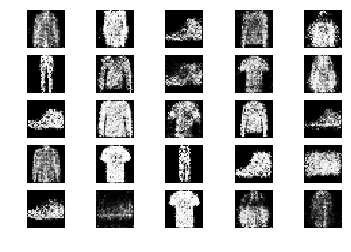

6401 [D loss: 0.625755, acc.: 62.50%] [G loss: 0.888324]
6402 [D loss: 0.678883, acc.: 62.50%] [G loss: 0.951197]
6403 [D loss: 0.693686, acc.: 62.50%] [G loss: 0.967256]
6404 [D loss: 0.707813, acc.: 57.81%] [G loss: 0.937451]
6405 [D loss: 0.693184, acc.: 54.69%] [G loss: 0.798423]
6406 [D loss: 0.612221, acc.: 62.50%] [G loss: 0.889376]
6407 [D loss: 0.667533, acc.: 59.38%] [G loss: 0.849265]
6408 [D loss: 0.689529, acc.: 60.94%] [G loss: 0.946260]
6409 [D loss: 0.641902, acc.: 56.25%] [G loss: 0.865730]
6410 [D loss: 0.648793, acc.: 56.25%] [G loss: 0.843123]
6411 [D loss: 0.689606, acc.: 64.06%] [G loss: 0.943124]
6412 [D loss: 0.639098, acc.: 65.62%] [G loss: 0.856358]
6413 [D loss: 0.656571, acc.: 67.19%] [G loss: 1.008459]
6414 [D loss: 0.684725, acc.: 53.12%] [G loss: 0.962809]
6415 [D loss: 0.646720, acc.: 62.50%] [G loss: 0.992449]
6416 [D loss: 0.713034, acc.: 53.12%] [G loss: 0.933209]
6417 [D loss: 0.699940, acc.: 54.69%] [G loss: 0.892573]
6418 [D loss: 0.643119, acc.: 6

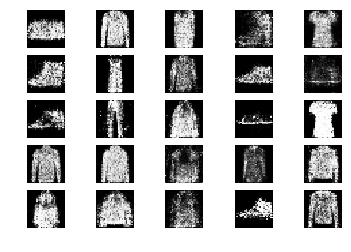

6451 [D loss: 0.636245, acc.: 60.94%] [G loss: 0.944845]
6452 [D loss: 0.624013, acc.: 62.50%] [G loss: 0.978933]
6453 [D loss: 0.678339, acc.: 57.81%] [G loss: 0.876704]
6454 [D loss: 0.624222, acc.: 68.75%] [G loss: 0.884621]
6455 [D loss: 0.665745, acc.: 59.38%] [G loss: 0.885274]
6456 [D loss: 0.608197, acc.: 67.19%] [G loss: 0.896995]
6457 [D loss: 0.660948, acc.: 64.06%] [G loss: 0.817628]
6458 [D loss: 0.699950, acc.: 59.38%] [G loss: 0.923890]
6459 [D loss: 0.627331, acc.: 70.31%] [G loss: 0.903548]
6460 [D loss: 0.701614, acc.: 56.25%] [G loss: 0.952490]
6461 [D loss: 0.675081, acc.: 56.25%] [G loss: 0.861340]
6462 [D loss: 0.683257, acc.: 62.50%] [G loss: 0.972416]
6463 [D loss: 0.619336, acc.: 64.06%] [G loss: 1.001710]
6464 [D loss: 0.644794, acc.: 64.06%] [G loss: 0.949139]
6465 [D loss: 0.658799, acc.: 65.62%] [G loss: 0.911777]
6466 [D loss: 0.652747, acc.: 67.19%] [G loss: 0.786526]
6467 [D loss: 0.686845, acc.: 67.19%] [G loss: 0.877714]
6468 [D loss: 0.658668, acc.: 5

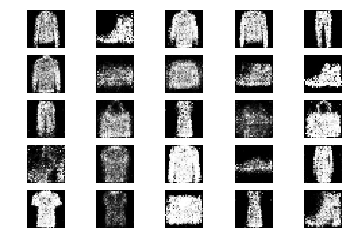

6501 [D loss: 0.677969, acc.: 64.06%] [G loss: 0.898468]
6502 [D loss: 0.645818, acc.: 59.38%] [G loss: 0.958139]
6503 [D loss: 0.706927, acc.: 51.56%] [G loss: 0.900628]
6504 [D loss: 0.625145, acc.: 64.06%] [G loss: 0.916380]
6505 [D loss: 0.707444, acc.: 54.69%] [G loss: 0.931440]
6506 [D loss: 0.628481, acc.: 65.62%] [G loss: 0.903020]
6507 [D loss: 0.608774, acc.: 68.75%] [G loss: 0.836178]
6508 [D loss: 0.696674, acc.: 59.38%] [G loss: 0.939116]
6509 [D loss: 0.702106, acc.: 62.50%] [G loss: 0.968131]
6510 [D loss: 0.674492, acc.: 53.12%] [G loss: 0.936523]
6511 [D loss: 0.628810, acc.: 64.06%] [G loss: 0.937243]
6512 [D loss: 0.702865, acc.: 54.69%] [G loss: 0.871372]
6513 [D loss: 0.645468, acc.: 64.06%] [G loss: 0.819731]
6514 [D loss: 0.681456, acc.: 64.06%] [G loss: 0.855295]
6515 [D loss: 0.632727, acc.: 64.06%] [G loss: 0.844362]
6516 [D loss: 0.684317, acc.: 64.06%] [G loss: 0.915916]
6517 [D loss: 0.679127, acc.: 64.06%] [G loss: 0.977603]
6518 [D loss: 0.747256, acc.: 4

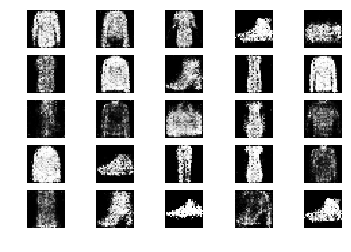

6551 [D loss: 0.719150, acc.: 51.56%] [G loss: 1.034282]
6552 [D loss: 0.661692, acc.: 59.38%] [G loss: 0.965338]
6553 [D loss: 0.671017, acc.: 62.50%] [G loss: 0.898460]
6554 [D loss: 0.604258, acc.: 70.31%] [G loss: 0.916938]
6555 [D loss: 0.660804, acc.: 57.81%] [G loss: 0.853139]
6556 [D loss: 0.644677, acc.: 65.62%] [G loss: 0.965046]
6557 [D loss: 0.600630, acc.: 62.50%] [G loss: 0.947905]
6558 [D loss: 0.658602, acc.: 64.06%] [G loss: 0.934896]
6559 [D loss: 0.630865, acc.: 68.75%] [G loss: 0.895904]
6560 [D loss: 0.663954, acc.: 59.38%] [G loss: 0.860686]
6561 [D loss: 0.710700, acc.: 56.25%] [G loss: 0.950616]
6562 [D loss: 0.640859, acc.: 65.62%] [G loss: 0.938147]
6563 [D loss: 0.630140, acc.: 75.00%] [G loss: 0.847854]
6564 [D loss: 0.660454, acc.: 56.25%] [G loss: 0.960472]
6565 [D loss: 0.695501, acc.: 46.88%] [G loss: 0.903946]
6566 [D loss: 0.658412, acc.: 57.81%] [G loss: 0.956574]
6567 [D loss: 0.633135, acc.: 70.31%] [G loss: 0.894195]
6568 [D loss: 0.731808, acc.: 4

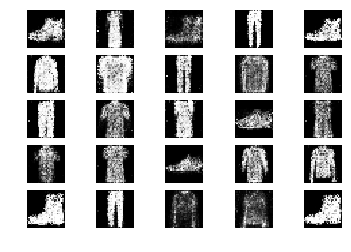

6601 [D loss: 0.609716, acc.: 70.31%] [G loss: 0.956689]
6602 [D loss: 0.679198, acc.: 57.81%] [G loss: 0.978943]
6603 [D loss: 0.686184, acc.: 54.69%] [G loss: 0.950841]
6604 [D loss: 0.656920, acc.: 60.94%] [G loss: 0.884248]
6605 [D loss: 0.661402, acc.: 70.31%] [G loss: 0.894882]
6606 [D loss: 0.627280, acc.: 62.50%] [G loss: 0.838427]
6607 [D loss: 0.597348, acc.: 75.00%] [G loss: 0.801888]
6608 [D loss: 0.650241, acc.: 59.38%] [G loss: 0.907570]
6609 [D loss: 0.688693, acc.: 57.81%] [G loss: 0.822194]
6610 [D loss: 0.622964, acc.: 59.38%] [G loss: 0.932718]
6611 [D loss: 0.652429, acc.: 59.38%] [G loss: 0.912205]
6612 [D loss: 0.651909, acc.: 64.06%] [G loss: 0.914477]
6613 [D loss: 0.667293, acc.: 56.25%] [G loss: 0.875971]
6614 [D loss: 0.602528, acc.: 70.31%] [G loss: 1.028124]
6615 [D loss: 0.583552, acc.: 70.31%] [G loss: 0.953293]
6616 [D loss: 0.649183, acc.: 57.81%] [G loss: 0.908441]
6617 [D loss: 0.619674, acc.: 65.62%] [G loss: 0.830377]
6618 [D loss: 0.631017, acc.: 6

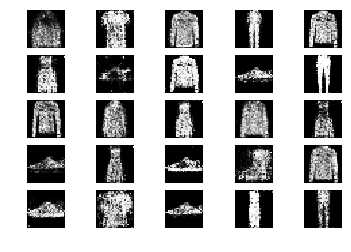

6651 [D loss: 0.670073, acc.: 57.81%] [G loss: 0.928580]
6652 [D loss: 0.633845, acc.: 67.19%] [G loss: 0.928122]
6653 [D loss: 0.623080, acc.: 60.94%] [G loss: 0.916876]
6654 [D loss: 0.642851, acc.: 65.62%] [G loss: 0.892517]
6655 [D loss: 0.640913, acc.: 64.06%] [G loss: 0.881101]
6656 [D loss: 0.655799, acc.: 57.81%] [G loss: 0.909831]
6657 [D loss: 0.708187, acc.: 53.12%] [G loss: 0.766069]
6658 [D loss: 0.645922, acc.: 57.81%] [G loss: 0.838970]
6659 [D loss: 0.615167, acc.: 65.62%] [G loss: 0.958544]
6660 [D loss: 0.659851, acc.: 67.19%] [G loss: 0.960122]
6661 [D loss: 0.708016, acc.: 59.38%] [G loss: 0.949769]
6662 [D loss: 0.688703, acc.: 59.38%] [G loss: 0.934038]
6663 [D loss: 0.615308, acc.: 70.31%] [G loss: 0.964053]
6664 [D loss: 0.588228, acc.: 75.00%] [G loss: 0.965741]
6665 [D loss: 0.689409, acc.: 54.69%] [G loss: 0.884609]
6666 [D loss: 0.661935, acc.: 64.06%] [G loss: 0.891611]
6667 [D loss: 0.570779, acc.: 76.56%] [G loss: 0.918053]
6668 [D loss: 0.618888, acc.: 6

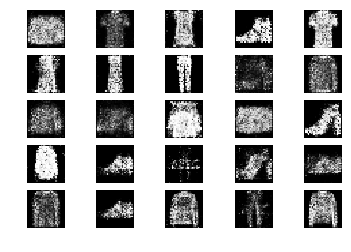

6701 [D loss: 0.570962, acc.: 68.75%] [G loss: 0.914043]
6702 [D loss: 0.639495, acc.: 64.06%] [G loss: 0.908091]
6703 [D loss: 0.579856, acc.: 68.75%] [G loss: 0.904316]
6704 [D loss: 0.643198, acc.: 62.50%] [G loss: 0.811112]
6705 [D loss: 0.680562, acc.: 64.06%] [G loss: 0.941168]
6706 [D loss: 0.729880, acc.: 54.69%] [G loss: 0.960630]
6707 [D loss: 0.682992, acc.: 64.06%] [G loss: 0.953007]
6708 [D loss: 0.624940, acc.: 68.75%] [G loss: 0.928523]
6709 [D loss: 0.685010, acc.: 53.12%] [G loss: 0.954326]
6710 [D loss: 0.666914, acc.: 60.94%] [G loss: 0.966224]
6711 [D loss: 0.627376, acc.: 67.19%] [G loss: 0.923459]
6712 [D loss: 0.649038, acc.: 64.06%] [G loss: 0.863011]
6713 [D loss: 0.675381, acc.: 59.38%] [G loss: 0.778889]
6714 [D loss: 0.683487, acc.: 51.56%] [G loss: 0.838348]
6715 [D loss: 0.631702, acc.: 59.38%] [G loss: 0.928099]
6716 [D loss: 0.659887, acc.: 54.69%] [G loss: 0.842021]
6717 [D loss: 0.624204, acc.: 67.19%] [G loss: 0.919993]
6718 [D loss: 0.559581, acc.: 7

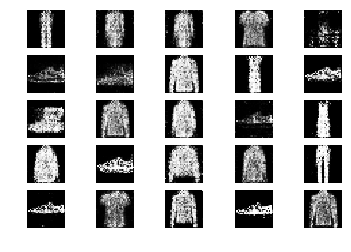

6751 [D loss: 0.692941, acc.: 60.94%] [G loss: 0.903073]
6752 [D loss: 0.637489, acc.: 64.06%] [G loss: 0.936436]
6753 [D loss: 0.648000, acc.: 60.94%] [G loss: 0.916069]
6754 [D loss: 0.602723, acc.: 68.75%] [G loss: 0.976172]
6755 [D loss: 0.681212, acc.: 59.38%] [G loss: 0.967618]
6756 [D loss: 0.604535, acc.: 71.88%] [G loss: 1.000518]
6757 [D loss: 0.622211, acc.: 67.19%] [G loss: 0.956495]
6758 [D loss: 0.696174, acc.: 56.25%] [G loss: 0.852764]
6759 [D loss: 0.695087, acc.: 56.25%] [G loss: 0.877453]
6760 [D loss: 0.691132, acc.: 57.81%] [G loss: 0.951550]
6761 [D loss: 0.654816, acc.: 60.94%] [G loss: 0.909943]
6762 [D loss: 0.679029, acc.: 51.56%] [G loss: 0.889007]
6763 [D loss: 0.651940, acc.: 56.25%] [G loss: 0.966859]
6764 [D loss: 0.614162, acc.: 70.31%] [G loss: 0.925292]
6765 [D loss: 0.676912, acc.: 64.06%] [G loss: 0.887311]
6766 [D loss: 0.678305, acc.: 57.81%] [G loss: 0.915012]
6767 [D loss: 0.599754, acc.: 70.31%] [G loss: 0.874589]
6768 [D loss: 0.626860, acc.: 6

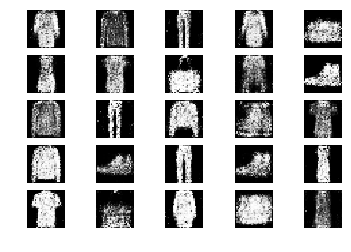

6801 [D loss: 0.641873, acc.: 57.81%] [G loss: 0.957245]
6802 [D loss: 0.729628, acc.: 50.00%] [G loss: 0.967380]
6803 [D loss: 0.674817, acc.: 51.56%] [G loss: 0.913594]
6804 [D loss: 0.711303, acc.: 53.12%] [G loss: 0.956273]
6805 [D loss: 0.660336, acc.: 60.94%] [G loss: 1.046521]
6806 [D loss: 0.622959, acc.: 59.38%] [G loss: 0.963788]
6807 [D loss: 0.709322, acc.: 54.69%] [G loss: 0.874153]
6808 [D loss: 0.634784, acc.: 65.62%] [G loss: 0.922522]
6809 [D loss: 0.682268, acc.: 60.94%] [G loss: 0.866559]
6810 [D loss: 0.577698, acc.: 73.44%] [G loss: 1.050885]
6811 [D loss: 0.722624, acc.: 53.12%] [G loss: 0.919053]
6812 [D loss: 0.663312, acc.: 59.38%] [G loss: 0.900463]
6813 [D loss: 0.674892, acc.: 62.50%] [G loss: 0.970808]
6814 [D loss: 0.615759, acc.: 65.62%] [G loss: 1.021403]
6815 [D loss: 0.656479, acc.: 60.94%] [G loss: 0.881285]
6816 [D loss: 0.616630, acc.: 67.19%] [G loss: 0.922740]
6817 [D loss: 0.733054, acc.: 48.44%] [G loss: 0.934773]
6818 [D loss: 0.685990, acc.: 5

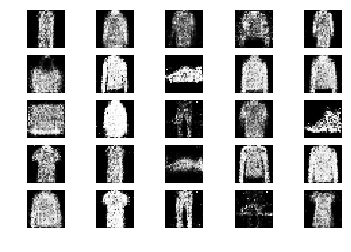

6851 [D loss: 0.607034, acc.: 65.62%] [G loss: 0.907624]
6852 [D loss: 0.687596, acc.: 60.94%] [G loss: 0.974280]
6853 [D loss: 0.661955, acc.: 62.50%] [G loss: 0.976266]
6854 [D loss: 0.590505, acc.: 68.75%] [G loss: 0.890079]
6855 [D loss: 0.637928, acc.: 62.50%] [G loss: 0.944084]
6856 [D loss: 0.683695, acc.: 57.81%] [G loss: 0.887205]
6857 [D loss: 0.692645, acc.: 54.69%] [G loss: 0.932410]
6858 [D loss: 0.648388, acc.: 60.94%] [G loss: 0.897469]
6859 [D loss: 0.568200, acc.: 78.12%] [G loss: 0.941337]
6860 [D loss: 0.663121, acc.: 59.38%] [G loss: 0.825596]
6861 [D loss: 0.644074, acc.: 57.81%] [G loss: 0.878296]
6862 [D loss: 0.600500, acc.: 67.19%] [G loss: 0.964135]
6863 [D loss: 0.726087, acc.: 54.69%] [G loss: 0.972366]
6864 [D loss: 0.658400, acc.: 62.50%] [G loss: 0.974670]
6865 [D loss: 0.675445, acc.: 54.69%] [G loss: 0.978919]
6866 [D loss: 0.654996, acc.: 62.50%] [G loss: 1.005124]
6867 [D loss: 0.659598, acc.: 62.50%] [G loss: 0.952778]
6868 [D loss: 0.679250, acc.: 5

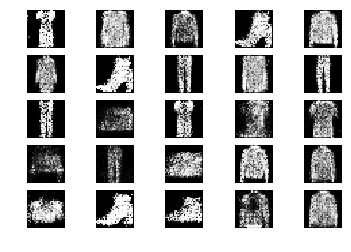

6901 [D loss: 0.604528, acc.: 65.62%] [G loss: 0.932851]
6902 [D loss: 0.657281, acc.: 56.25%] [G loss: 0.915173]
6903 [D loss: 0.602784, acc.: 65.62%] [G loss: 0.995886]
6904 [D loss: 0.693526, acc.: 50.00%] [G loss: 0.962216]
6905 [D loss: 0.699596, acc.: 45.31%] [G loss: 1.033413]
6906 [D loss: 0.701463, acc.: 53.12%] [G loss: 0.905604]
6907 [D loss: 0.687227, acc.: 57.81%] [G loss: 0.862816]
6908 [D loss: 0.615786, acc.: 62.50%] [G loss: 0.953487]
6909 [D loss: 0.640802, acc.: 60.94%] [G loss: 0.924760]
6910 [D loss: 0.666928, acc.: 57.81%] [G loss: 1.007024]
6911 [D loss: 0.668477, acc.: 57.81%] [G loss: 0.970329]
6912 [D loss: 0.612246, acc.: 64.06%] [G loss: 0.849869]
6913 [D loss: 0.638133, acc.: 71.88%] [G loss: 0.836339]
6914 [D loss: 0.633200, acc.: 56.25%] [G loss: 0.818883]
6915 [D loss: 0.677866, acc.: 53.12%] [G loss: 0.912456]
6916 [D loss: 0.718641, acc.: 50.00%] [G loss: 0.976987]
6917 [D loss: 0.739128, acc.: 46.88%] [G loss: 0.833751]
6918 [D loss: 0.612612, acc.: 6

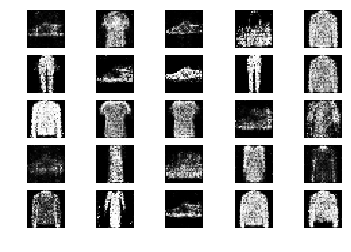

6951 [D loss: 0.652201, acc.: 62.50%] [G loss: 0.895577]
6952 [D loss: 0.619744, acc.: 62.50%] [G loss: 0.862183]
6953 [D loss: 0.627005, acc.: 65.62%] [G loss: 0.869521]
6954 [D loss: 0.669307, acc.: 57.81%] [G loss: 0.896430]
6955 [D loss: 0.679104, acc.: 53.12%] [G loss: 0.834828]
6956 [D loss: 0.674670, acc.: 59.38%] [G loss: 0.922595]
6957 [D loss: 0.595937, acc.: 68.75%] [G loss: 0.920998]
6958 [D loss: 0.728175, acc.: 53.12%] [G loss: 0.905448]
6959 [D loss: 0.611397, acc.: 73.44%] [G loss: 0.948596]
6960 [D loss: 0.659256, acc.: 54.69%] [G loss: 0.891726]
6961 [D loss: 0.621233, acc.: 60.94%] [G loss: 0.935952]
6962 [D loss: 0.655688, acc.: 62.50%] [G loss: 0.851961]
6963 [D loss: 0.682364, acc.: 57.81%] [G loss: 0.807193]
6964 [D loss: 0.644535, acc.: 62.50%] [G loss: 0.854361]
6965 [D loss: 0.660280, acc.: 56.25%] [G loss: 0.912591]
6966 [D loss: 0.598486, acc.: 73.44%] [G loss: 0.963165]
6967 [D loss: 0.636496, acc.: 64.06%] [G loss: 0.922793]
6968 [D loss: 0.649072, acc.: 6

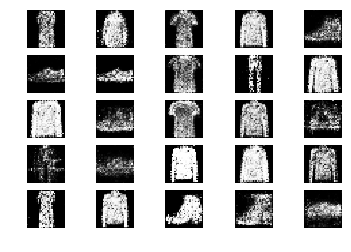

7001 [D loss: 0.642725, acc.: 57.81%] [G loss: 0.974379]
7002 [D loss: 0.665776, acc.: 59.38%] [G loss: 0.947984]
7003 [D loss: 0.675481, acc.: 60.94%] [G loss: 0.795775]
7004 [D loss: 0.705929, acc.: 57.81%] [G loss: 0.878184]
7005 [D loss: 0.581920, acc.: 71.88%] [G loss: 0.917405]
7006 [D loss: 0.688309, acc.: 50.00%] [G loss: 0.931043]
7007 [D loss: 0.606935, acc.: 67.19%] [G loss: 0.928846]
7008 [D loss: 0.643694, acc.: 60.94%] [G loss: 0.871023]
7009 [D loss: 0.628849, acc.: 67.19%] [G loss: 0.874507]
7010 [D loss: 0.672718, acc.: 51.56%] [G loss: 0.965475]
7011 [D loss: 0.588744, acc.: 65.62%] [G loss: 0.992609]
7012 [D loss: 0.692631, acc.: 57.81%] [G loss: 0.954380]
7013 [D loss: 0.650638, acc.: 54.69%] [G loss: 0.947823]
7014 [D loss: 0.680701, acc.: 54.69%] [G loss: 0.911624]
7015 [D loss: 0.595684, acc.: 68.75%] [G loss: 1.011834]
7016 [D loss: 0.606776, acc.: 68.75%] [G loss: 0.927162]
7017 [D loss: 0.623322, acc.: 67.19%] [G loss: 0.947049]
7018 [D loss: 0.632123, acc.: 6

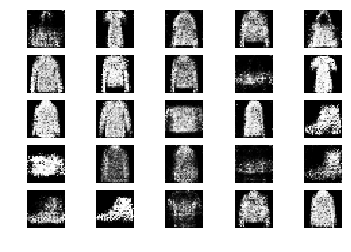

7051 [D loss: 0.675885, acc.: 57.81%] [G loss: 0.927224]
7052 [D loss: 0.701308, acc.: 54.69%] [G loss: 0.916166]
7053 [D loss: 0.661226, acc.: 60.94%] [G loss: 0.825617]
7054 [D loss: 0.592666, acc.: 65.62%] [G loss: 1.042113]
7055 [D loss: 0.650756, acc.: 60.94%] [G loss: 0.923944]
7056 [D loss: 0.648522, acc.: 59.38%] [G loss: 0.975681]
7057 [D loss: 0.630904, acc.: 65.62%] [G loss: 1.022265]
7058 [D loss: 0.645440, acc.: 68.75%] [G loss: 1.024353]
7059 [D loss: 0.664972, acc.: 57.81%] [G loss: 0.918823]
7060 [D loss: 0.622909, acc.: 64.06%] [G loss: 0.831925]
7061 [D loss: 0.684496, acc.: 57.81%] [G loss: 0.945546]
7062 [D loss: 0.607437, acc.: 68.75%] [G loss: 0.862034]
7063 [D loss: 0.722261, acc.: 54.69%] [G loss: 0.816134]
7064 [D loss: 0.690885, acc.: 65.62%] [G loss: 0.883924]
7065 [D loss: 0.677020, acc.: 54.69%] [G loss: 0.963114]
7066 [D loss: 0.586922, acc.: 68.75%] [G loss: 0.979006]
7067 [D loss: 0.679543, acc.: 51.56%] [G loss: 0.954574]
7068 [D loss: 0.656459, acc.: 6

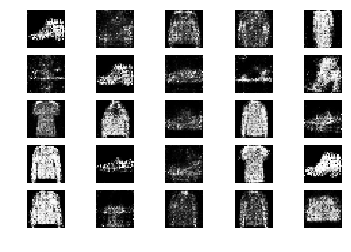

7101 [D loss: 0.637945, acc.: 60.94%] [G loss: 0.939275]
7102 [D loss: 0.650575, acc.: 57.81%] [G loss: 0.926289]
7103 [D loss: 0.603860, acc.: 67.19%] [G loss: 0.935373]
7104 [D loss: 0.655988, acc.: 62.50%] [G loss: 0.947977]
7105 [D loss: 0.678676, acc.: 59.38%] [G loss: 0.917742]
7106 [D loss: 0.621935, acc.: 68.75%] [G loss: 0.891232]
7107 [D loss: 0.712346, acc.: 51.56%] [G loss: 0.940779]
7108 [D loss: 0.717342, acc.: 53.12%] [G loss: 0.976318]
7109 [D loss: 0.665036, acc.: 57.81%] [G loss: 0.924303]
7110 [D loss: 0.605707, acc.: 73.44%] [G loss: 0.966817]
7111 [D loss: 0.656887, acc.: 60.94%] [G loss: 0.863696]
7112 [D loss: 0.654645, acc.: 68.75%] [G loss: 0.895477]
7113 [D loss: 0.629483, acc.: 64.06%] [G loss: 0.985101]
7114 [D loss: 0.617597, acc.: 68.75%] [G loss: 0.989255]
7115 [D loss: 0.716701, acc.: 50.00%] [G loss: 0.942660]
7116 [D loss: 0.661770, acc.: 62.50%] [G loss: 0.863224]
7117 [D loss: 0.637336, acc.: 62.50%] [G loss: 0.923871]
7118 [D loss: 0.633614, acc.: 6

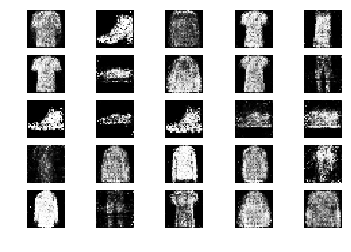

7151 [D loss: 0.684277, acc.: 56.25%] [G loss: 0.865059]
7152 [D loss: 0.578638, acc.: 73.44%] [G loss: 0.892761]
7153 [D loss: 0.599103, acc.: 62.50%] [G loss: 0.953323]
7154 [D loss: 0.640754, acc.: 62.50%] [G loss: 0.934883]
7155 [D loss: 0.620344, acc.: 60.94%] [G loss: 1.004502]
7156 [D loss: 0.677203, acc.: 57.81%] [G loss: 0.919390]
7157 [D loss: 0.615355, acc.: 70.31%] [G loss: 0.887255]
7158 [D loss: 0.682107, acc.: 53.12%] [G loss: 0.813102]
7159 [D loss: 0.662627, acc.: 64.06%] [G loss: 0.868301]
7160 [D loss: 0.719784, acc.: 42.19%] [G loss: 0.886555]
7161 [D loss: 0.681929, acc.: 53.12%] [G loss: 0.918534]
7162 [D loss: 0.677821, acc.: 54.69%] [G loss: 1.001246]
7163 [D loss: 0.707730, acc.: 48.44%] [G loss: 0.848446]
7164 [D loss: 0.680277, acc.: 57.81%] [G loss: 0.936795]
7165 [D loss: 0.649871, acc.: 62.50%] [G loss: 0.906512]
7166 [D loss: 0.664531, acc.: 60.94%] [G loss: 0.925568]
7167 [D loss: 0.593168, acc.: 75.00%] [G loss: 0.939383]
7168 [D loss: 0.702091, acc.: 5

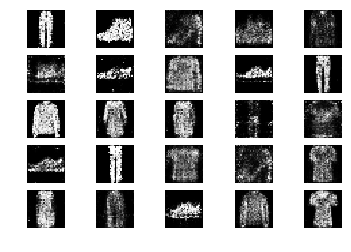

7201 [D loss: 0.602066, acc.: 73.44%] [G loss: 0.910215]
7202 [D loss: 0.630566, acc.: 68.75%] [G loss: 1.050099]
7203 [D loss: 0.590553, acc.: 67.19%] [G loss: 1.010223]
7204 [D loss: 0.673193, acc.: 56.25%] [G loss: 0.902942]
7205 [D loss: 0.737697, acc.: 54.69%] [G loss: 0.827063]
7206 [D loss: 0.669871, acc.: 53.12%] [G loss: 0.828050]
7207 [D loss: 0.623449, acc.: 64.06%] [G loss: 0.832661]
7208 [D loss: 0.667046, acc.: 64.06%] [G loss: 0.881354]
7209 [D loss: 0.665897, acc.: 60.94%] [G loss: 0.880016]
7210 [D loss: 0.594155, acc.: 71.88%] [G loss: 0.976793]
7211 [D loss: 0.675826, acc.: 62.50%] [G loss: 0.920852]
7212 [D loss: 0.647208, acc.: 54.69%] [G loss: 0.848179]
7213 [D loss: 0.669536, acc.: 60.94%] [G loss: 0.808509]
7214 [D loss: 0.587786, acc.: 71.88%] [G loss: 0.943090]
7215 [D loss: 0.612480, acc.: 67.19%] [G loss: 0.924052]
7216 [D loss: 0.711026, acc.: 56.25%] [G loss: 0.944758]
7217 [D loss: 0.654226, acc.: 57.81%] [G loss: 0.820762]
7218 [D loss: 0.685878, acc.: 5

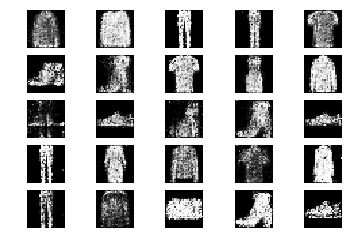

7251 [D loss: 0.689523, acc.: 59.38%] [G loss: 0.891121]
7252 [D loss: 0.726011, acc.: 46.88%] [G loss: 0.856837]
7253 [D loss: 0.666038, acc.: 59.38%] [G loss: 0.942226]
7254 [D loss: 0.694824, acc.: 59.38%] [G loss: 0.922853]
7255 [D loss: 0.659165, acc.: 59.38%] [G loss: 0.890578]
7256 [D loss: 0.621841, acc.: 65.62%] [G loss: 1.020918]
7257 [D loss: 0.648182, acc.: 59.38%] [G loss: 0.910276]
7258 [D loss: 0.674918, acc.: 50.00%] [G loss: 0.927318]
7259 [D loss: 0.646734, acc.: 60.94%] [G loss: 0.945133]
7260 [D loss: 0.642724, acc.: 65.62%] [G loss: 0.909398]
7261 [D loss: 0.702763, acc.: 54.69%] [G loss: 0.869531]
7262 [D loss: 0.626503, acc.: 56.25%] [G loss: 0.956029]
7263 [D loss: 0.672055, acc.: 54.69%] [G loss: 0.947155]
7264 [D loss: 0.647187, acc.: 64.06%] [G loss: 0.855383]
7265 [D loss: 0.643638, acc.: 57.81%] [G loss: 0.864804]
7266 [D loss: 0.696934, acc.: 65.62%] [G loss: 0.935304]
7267 [D loss: 0.643672, acc.: 60.94%] [G loss: 0.975333]
7268 [D loss: 0.640049, acc.: 6

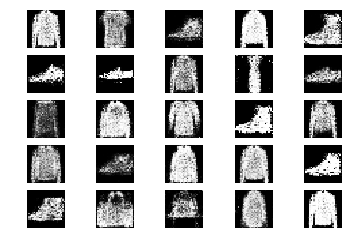

7301 [D loss: 0.681785, acc.: 53.12%] [G loss: 0.948961]
7302 [D loss: 0.629335, acc.: 65.62%] [G loss: 0.945241]
7303 [D loss: 0.687837, acc.: 51.56%] [G loss: 0.927368]
7304 [D loss: 0.648543, acc.: 68.75%] [G loss: 0.901268]
7305 [D loss: 0.668784, acc.: 57.81%] [G loss: 0.940319]
7306 [D loss: 0.592085, acc.: 78.12%] [G loss: 0.920483]
7307 [D loss: 0.652731, acc.: 54.69%] [G loss: 0.960028]
7308 [D loss: 0.667975, acc.: 57.81%] [G loss: 0.938056]
7309 [D loss: 0.659168, acc.: 64.06%] [G loss: 0.881592]
7310 [D loss: 0.639454, acc.: 65.62%] [G loss: 0.935879]
7311 [D loss: 0.657566, acc.: 57.81%] [G loss: 0.856776]
7312 [D loss: 0.611506, acc.: 68.75%] [G loss: 0.958151]
7313 [D loss: 0.613228, acc.: 59.38%] [G loss: 0.945796]
7314 [D loss: 0.653723, acc.: 62.50%] [G loss: 0.960761]
7315 [D loss: 0.670113, acc.: 57.81%] [G loss: 0.919400]
7316 [D loss: 0.703304, acc.: 51.56%] [G loss: 0.948710]
7317 [D loss: 0.595800, acc.: 67.19%] [G loss: 0.876859]
7318 [D loss: 0.689101, acc.: 5

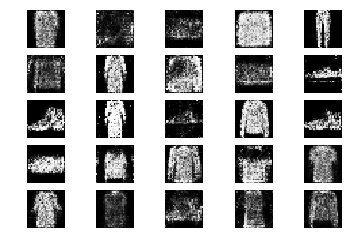

7351 [D loss: 0.710572, acc.: 53.12%] [G loss: 0.938116]
7352 [D loss: 0.662557, acc.: 56.25%] [G loss: 0.858158]
7353 [D loss: 0.637657, acc.: 51.56%] [G loss: 0.933931]
7354 [D loss: 0.645026, acc.: 67.19%] [G loss: 1.037574]
7355 [D loss: 0.633169, acc.: 65.62%] [G loss: 0.978271]
7356 [D loss: 0.715857, acc.: 54.69%] [G loss: 0.976014]
7357 [D loss: 0.622975, acc.: 62.50%] [G loss: 0.934955]
7358 [D loss: 0.631147, acc.: 57.81%] [G loss: 0.816226]
7359 [D loss: 0.713185, acc.: 51.56%] [G loss: 0.855370]
7360 [D loss: 0.635500, acc.: 65.62%] [G loss: 0.798621]
7361 [D loss: 0.654456, acc.: 64.06%] [G loss: 0.851010]
7362 [D loss: 0.629000, acc.: 67.19%] [G loss: 0.865302]
7363 [D loss: 0.662068, acc.: 53.12%] [G loss: 0.981980]
7364 [D loss: 0.667917, acc.: 59.38%] [G loss: 0.987312]
7365 [D loss: 0.683466, acc.: 48.44%] [G loss: 0.929263]
7366 [D loss: 0.795947, acc.: 43.75%] [G loss: 0.848238]
7367 [D loss: 0.665293, acc.: 56.25%] [G loss: 0.895325]
7368 [D loss: 0.786538, acc.: 4

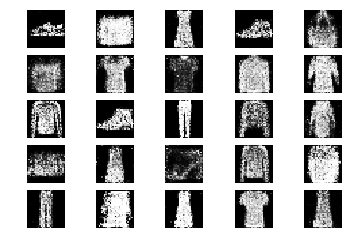

7401 [D loss: 0.643338, acc.: 67.19%] [G loss: 0.935002]
7402 [D loss: 0.650225, acc.: 62.50%] [G loss: 0.887567]
7403 [D loss: 0.665922, acc.: 57.81%] [G loss: 0.885878]
7404 [D loss: 0.676492, acc.: 54.69%] [G loss: 0.870879]
7405 [D loss: 0.618502, acc.: 65.62%] [G loss: 0.928058]
7406 [D loss: 0.648098, acc.: 62.50%] [G loss: 0.937374]
7407 [D loss: 0.644244, acc.: 65.62%] [G loss: 0.943377]
7408 [D loss: 0.661597, acc.: 59.38%] [G loss: 0.881736]
7409 [D loss: 0.660710, acc.: 59.38%] [G loss: 0.965566]
7410 [D loss: 0.613788, acc.: 56.25%] [G loss: 0.966314]
7411 [D loss: 0.639211, acc.: 70.31%] [G loss: 0.979991]
7412 [D loss: 0.687747, acc.: 53.12%] [G loss: 0.899582]
7413 [D loss: 0.700468, acc.: 56.25%] [G loss: 0.993476]
7414 [D loss: 0.657678, acc.: 62.50%] [G loss: 0.863510]
7415 [D loss: 0.597971, acc.: 73.44%] [G loss: 0.860290]
7416 [D loss: 0.672505, acc.: 62.50%] [G loss: 0.837924]
7417 [D loss: 0.644359, acc.: 65.62%] [G loss: 0.953669]
7418 [D loss: 0.589411, acc.: 6

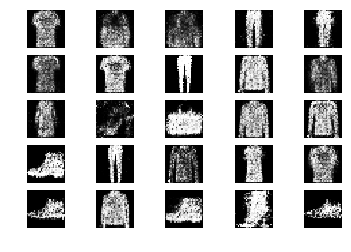

7451 [D loss: 0.599210, acc.: 62.50%] [G loss: 0.918166]
7452 [D loss: 0.729919, acc.: 45.31%] [G loss: 0.917323]
7453 [D loss: 0.704077, acc.: 57.81%] [G loss: 0.896587]
7454 [D loss: 0.636023, acc.: 64.06%] [G loss: 0.932065]
7455 [D loss: 0.586849, acc.: 78.12%] [G loss: 0.997352]
7456 [D loss: 0.672152, acc.: 60.94%] [G loss: 0.906389]
7457 [D loss: 0.632769, acc.: 64.06%] [G loss: 0.909829]
7458 [D loss: 0.698556, acc.: 56.25%] [G loss: 0.841838]
7459 [D loss: 0.715030, acc.: 56.25%] [G loss: 0.842000]
7460 [D loss: 0.657334, acc.: 64.06%] [G loss: 1.051524]
7461 [D loss: 0.705471, acc.: 56.25%] [G loss: 0.942941]
7462 [D loss: 0.698924, acc.: 50.00%] [G loss: 0.964036]
7463 [D loss: 0.707178, acc.: 56.25%] [G loss: 0.895273]
7464 [D loss: 0.659645, acc.: 57.81%] [G loss: 0.898088]
7465 [D loss: 0.669991, acc.: 64.06%] [G loss: 0.970604]
7466 [D loss: 0.614378, acc.: 70.31%] [G loss: 0.869036]
7467 [D loss: 0.636591, acc.: 65.62%] [G loss: 0.945271]
7468 [D loss: 0.646247, acc.: 6

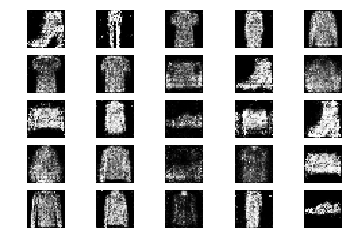

7501 [D loss: 0.576357, acc.: 75.00%] [G loss: 0.913100]
7502 [D loss: 0.635548, acc.: 65.62%] [G loss: 0.948327]
7503 [D loss: 0.650849, acc.: 67.19%] [G loss: 0.869075]
7504 [D loss: 0.629335, acc.: 64.06%] [G loss: 0.941218]
7505 [D loss: 0.683364, acc.: 51.56%] [G loss: 0.944897]
7506 [D loss: 0.618726, acc.: 68.75%] [G loss: 0.968260]
7507 [D loss: 0.728889, acc.: 53.12%] [G loss: 0.852347]
7508 [D loss: 0.614746, acc.: 62.50%] [G loss: 0.860688]
7509 [D loss: 0.631676, acc.: 68.75%] [G loss: 0.929180]
7510 [D loss: 0.695010, acc.: 56.25%] [G loss: 0.937468]
7511 [D loss: 0.632618, acc.: 67.19%] [G loss: 0.966591]
7512 [D loss: 0.565560, acc.: 79.69%] [G loss: 0.799324]
7513 [D loss: 0.656149, acc.: 60.94%] [G loss: 0.936409]
7514 [D loss: 0.569381, acc.: 70.31%] [G loss: 0.944797]
7515 [D loss: 0.616034, acc.: 67.19%] [G loss: 0.821330]
7516 [D loss: 0.619187, acc.: 67.19%] [G loss: 0.865682]
7517 [D loss: 0.622172, acc.: 65.62%] [G loss: 0.946387]
7518 [D loss: 0.659143, acc.: 6

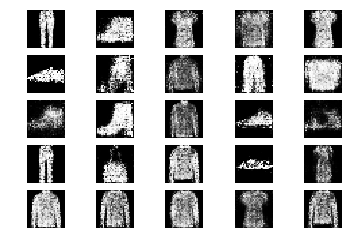

7551 [D loss: 0.680407, acc.: 53.12%] [G loss: 0.893024]
7552 [D loss: 0.698326, acc.: 54.69%] [G loss: 0.933118]
7553 [D loss: 0.670658, acc.: 59.38%] [G loss: 0.881521]
7554 [D loss: 0.728514, acc.: 53.12%] [G loss: 0.938932]
7555 [D loss: 0.638823, acc.: 67.19%] [G loss: 1.011576]
7556 [D loss: 0.649660, acc.: 68.75%] [G loss: 0.921991]
7557 [D loss: 0.654417, acc.: 68.75%] [G loss: 0.943795]
7558 [D loss: 0.691796, acc.: 54.69%] [G loss: 0.974409]
7559 [D loss: 0.641480, acc.: 62.50%] [G loss: 0.948129]
7560 [D loss: 0.610003, acc.: 70.31%] [G loss: 0.934486]
7561 [D loss: 0.631594, acc.: 57.81%] [G loss: 0.878809]
7562 [D loss: 0.646036, acc.: 65.62%] [G loss: 0.915441]
7563 [D loss: 0.603793, acc.: 71.88%] [G loss: 0.944573]
7564 [D loss: 0.602697, acc.: 67.19%] [G loss: 0.975061]
7565 [D loss: 0.628489, acc.: 62.50%] [G loss: 0.891739]
7566 [D loss: 0.659131, acc.: 62.50%] [G loss: 0.908290]
7567 [D loss: 0.660901, acc.: 54.69%] [G loss: 0.899886]
7568 [D loss: 0.676828, acc.: 5

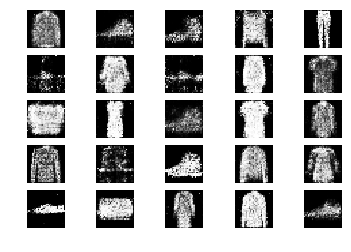

7601 [D loss: 0.677343, acc.: 59.38%] [G loss: 0.828382]
7602 [D loss: 0.633830, acc.: 64.06%] [G loss: 0.877431]
7603 [D loss: 0.709137, acc.: 57.81%] [G loss: 0.909454]
7604 [D loss: 0.628292, acc.: 65.62%] [G loss: 0.820547]
7605 [D loss: 0.682739, acc.: 57.81%] [G loss: 0.889106]
7606 [D loss: 0.712141, acc.: 53.12%] [G loss: 0.850989]
7607 [D loss: 0.750926, acc.: 46.88%] [G loss: 0.856432]
7608 [D loss: 0.695433, acc.: 51.56%] [G loss: 0.902662]
7609 [D loss: 0.666384, acc.: 60.94%] [G loss: 0.917671]
7610 [D loss: 0.639962, acc.: 64.06%] [G loss: 0.904649]
7611 [D loss: 0.644496, acc.: 68.75%] [G loss: 0.877684]
7612 [D loss: 0.733991, acc.: 64.06%] [G loss: 0.938346]
7613 [D loss: 0.630558, acc.: 65.62%] [G loss: 0.885066]
7614 [D loss: 0.695932, acc.: 56.25%] [G loss: 0.862252]
7615 [D loss: 0.613496, acc.: 71.88%] [G loss: 0.760971]
7616 [D loss: 0.694021, acc.: 60.94%] [G loss: 0.921122]
7617 [D loss: 0.635389, acc.: 59.38%] [G loss: 0.865605]
7618 [D loss: 0.611946, acc.: 6

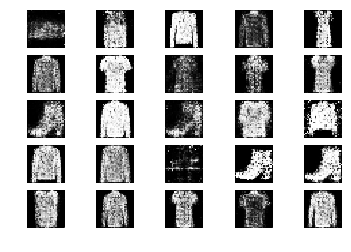

7651 [D loss: 0.583118, acc.: 78.12%] [G loss: 0.878979]
7652 [D loss: 0.585957, acc.: 73.44%] [G loss: 0.815581]
7653 [D loss: 0.642022, acc.: 68.75%] [G loss: 0.828212]
7654 [D loss: 0.701459, acc.: 65.62%] [G loss: 0.852457]
7655 [D loss: 0.675799, acc.: 54.69%] [G loss: 0.797848]
7656 [D loss: 0.706689, acc.: 53.12%] [G loss: 0.958542]
7657 [D loss: 0.656466, acc.: 64.06%] [G loss: 1.014890]
7658 [D loss: 0.628161, acc.: 62.50%] [G loss: 0.919776]
7659 [D loss: 0.570580, acc.: 73.44%] [G loss: 0.912854]
7660 [D loss: 0.672028, acc.: 60.94%] [G loss: 0.962233]
7661 [D loss: 0.664923, acc.: 54.69%] [G loss: 0.875841]
7662 [D loss: 0.649637, acc.: 65.62%] [G loss: 0.920795]
7663 [D loss: 0.635001, acc.: 64.06%] [G loss: 0.908893]
7664 [D loss: 0.629891, acc.: 68.75%] [G loss: 0.921986]
7665 [D loss: 0.620684, acc.: 60.94%] [G loss: 0.925012]
7666 [D loss: 0.751023, acc.: 48.44%] [G loss: 0.849900]
7667 [D loss: 0.671282, acc.: 59.38%] [G loss: 0.854611]
7668 [D loss: 0.696989, acc.: 4

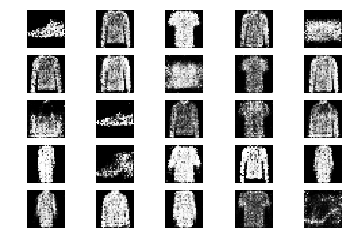

7701 [D loss: 0.690872, acc.: 62.50%] [G loss: 1.021028]
7702 [D loss: 0.626774, acc.: 64.06%] [G loss: 1.002440]
7703 [D loss: 0.623086, acc.: 60.94%] [G loss: 0.894329]
7704 [D loss: 0.614543, acc.: 57.81%] [G loss: 0.942099]
7705 [D loss: 0.662499, acc.: 65.62%] [G loss: 0.907847]
7706 [D loss: 0.655130, acc.: 57.81%] [G loss: 0.913705]
7707 [D loss: 0.643492, acc.: 65.62%] [G loss: 0.930551]
7708 [D loss: 0.657752, acc.: 59.38%] [G loss: 0.987695]
7709 [D loss: 0.659254, acc.: 62.50%] [G loss: 0.963819]
7710 [D loss: 0.600474, acc.: 67.19%] [G loss: 0.942809]
7711 [D loss: 0.618637, acc.: 68.75%] [G loss: 0.891090]
7712 [D loss: 0.588098, acc.: 65.62%] [G loss: 0.872138]
7713 [D loss: 0.652005, acc.: 54.69%] [G loss: 0.913848]
7714 [D loss: 0.631543, acc.: 59.38%] [G loss: 0.905508]
7715 [D loss: 0.669524, acc.: 51.56%] [G loss: 0.942637]
7716 [D loss: 0.681865, acc.: 50.00%] [G loss: 0.937998]
7717 [D loss: 0.671207, acc.: 56.25%] [G loss: 0.896029]
7718 [D loss: 0.647699, acc.: 5

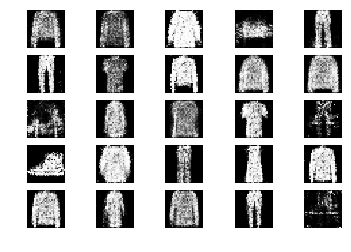

7751 [D loss: 0.726311, acc.: 54.69%] [G loss: 0.896158]
7752 [D loss: 0.638421, acc.: 59.38%] [G loss: 0.931173]
7753 [D loss: 0.633537, acc.: 65.62%] [G loss: 0.964280]
7754 [D loss: 0.676987, acc.: 60.94%] [G loss: 0.962331]
7755 [D loss: 0.585881, acc.: 76.56%] [G loss: 0.998771]
7756 [D loss: 0.665808, acc.: 62.50%] [G loss: 1.025960]
7757 [D loss: 0.639046, acc.: 64.06%] [G loss: 0.926748]
7758 [D loss: 0.623673, acc.: 64.06%] [G loss: 0.969418]
7759 [D loss: 0.622266, acc.: 57.81%] [G loss: 1.062308]
7760 [D loss: 0.675930, acc.: 59.38%] [G loss: 0.849516]
7761 [D loss: 0.692411, acc.: 60.94%] [G loss: 0.940572]
7762 [D loss: 0.634649, acc.: 67.19%] [G loss: 0.887162]
7763 [D loss: 0.637522, acc.: 54.69%] [G loss: 0.887852]
7764 [D loss: 0.658582, acc.: 57.81%] [G loss: 0.844390]
7765 [D loss: 0.638311, acc.: 65.62%] [G loss: 0.895872]
7766 [D loss: 0.588739, acc.: 70.31%] [G loss: 0.998858]
7767 [D loss: 0.697452, acc.: 46.88%] [G loss: 1.084566]
7768 [D loss: 0.668149, acc.: 5

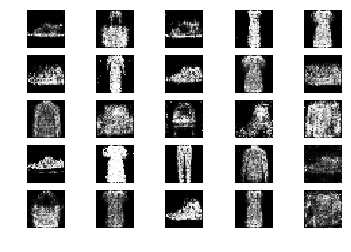

7801 [D loss: 0.652234, acc.: 64.06%] [G loss: 0.958656]
7802 [D loss: 0.691889, acc.: 54.69%] [G loss: 0.936613]
7803 [D loss: 0.623399, acc.: 62.50%] [G loss: 0.983174]
7804 [D loss: 0.693345, acc.: 53.12%] [G loss: 0.896114]
7805 [D loss: 0.695739, acc.: 54.69%] [G loss: 0.925782]
7806 [D loss: 0.722228, acc.: 54.69%] [G loss: 0.856400]
7807 [D loss: 0.689069, acc.: 56.25%] [G loss: 0.857616]
7808 [D loss: 0.711729, acc.: 60.94%] [G loss: 0.883969]
7809 [D loss: 0.582974, acc.: 75.00%] [G loss: 0.946485]
7810 [D loss: 0.577234, acc.: 78.12%] [G loss: 0.981786]
7811 [D loss: 0.611907, acc.: 60.94%] [G loss: 0.991778]
7812 [D loss: 0.661323, acc.: 57.81%] [G loss: 0.932340]
7813 [D loss: 0.749839, acc.: 50.00%] [G loss: 0.873376]
7814 [D loss: 0.663174, acc.: 67.19%] [G loss: 0.965463]
7815 [D loss: 0.689224, acc.: 67.19%] [G loss: 0.910210]
7816 [D loss: 0.652844, acc.: 60.94%] [G loss: 0.941578]
7817 [D loss: 0.599532, acc.: 67.19%] [G loss: 0.860123]
7818 [D loss: 0.623304, acc.: 6

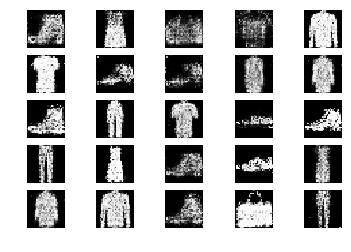

7851 [D loss: 0.616527, acc.: 64.06%] [G loss: 0.917593]
7852 [D loss: 0.600980, acc.: 71.88%] [G loss: 0.868143]
7853 [D loss: 0.682978, acc.: 62.50%] [G loss: 0.905573]
7854 [D loss: 0.698907, acc.: 56.25%] [G loss: 0.971905]
7855 [D loss: 0.572182, acc.: 70.31%] [G loss: 0.949271]
7856 [D loss: 0.715725, acc.: 56.25%] [G loss: 0.888084]
7857 [D loss: 0.629010, acc.: 59.38%] [G loss: 0.797825]
7858 [D loss: 0.684063, acc.: 57.81%] [G loss: 0.807158]
7859 [D loss: 0.678363, acc.: 57.81%] [G loss: 0.884731]
7860 [D loss: 0.647109, acc.: 60.94%] [G loss: 0.965289]
7861 [D loss: 0.641318, acc.: 65.62%] [G loss: 0.934265]
7862 [D loss: 0.677503, acc.: 57.81%] [G loss: 0.921495]
7863 [D loss: 0.680966, acc.: 57.81%] [G loss: 0.917240]
7864 [D loss: 0.656708, acc.: 64.06%] [G loss: 0.855887]
7865 [D loss: 0.634031, acc.: 68.75%] [G loss: 0.961898]
7866 [D loss: 0.682649, acc.: 53.12%] [G loss: 0.917856]
7867 [D loss: 0.689122, acc.: 59.38%] [G loss: 0.878357]
7868 [D loss: 0.637797, acc.: 5

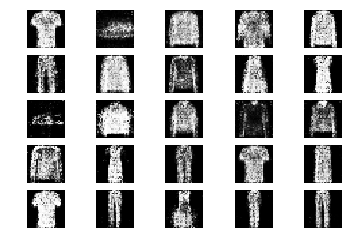

7901 [D loss: 0.636560, acc.: 62.50%] [G loss: 0.866876]
7902 [D loss: 0.673308, acc.: 60.94%] [G loss: 0.892109]
7903 [D loss: 0.642484, acc.: 70.31%] [G loss: 0.802262]
7904 [D loss: 0.687054, acc.: 57.81%] [G loss: 1.041921]
7905 [D loss: 0.642191, acc.: 64.06%] [G loss: 0.957946]
7906 [D loss: 0.732558, acc.: 48.44%] [G loss: 0.897575]
7907 [D loss: 0.634441, acc.: 59.38%] [G loss: 0.912452]
7908 [D loss: 0.630733, acc.: 65.62%] [G loss: 1.022209]
7909 [D loss: 0.646478, acc.: 64.06%] [G loss: 0.902126]
7910 [D loss: 0.540151, acc.: 76.56%] [G loss: 0.861599]
7911 [D loss: 0.686053, acc.: 62.50%] [G loss: 0.898744]
7912 [D loss: 0.650050, acc.: 60.94%] [G loss: 0.861687]
7913 [D loss: 0.627786, acc.: 64.06%] [G loss: 0.922811]
7914 [D loss: 0.659872, acc.: 64.06%] [G loss: 0.824981]
7915 [D loss: 0.692966, acc.: 53.12%] [G loss: 0.925512]
7916 [D loss: 0.668432, acc.: 59.38%] [G loss: 0.839308]
7917 [D loss: 0.629513, acc.: 64.06%] [G loss: 0.820904]
7918 [D loss: 0.650877, acc.: 5

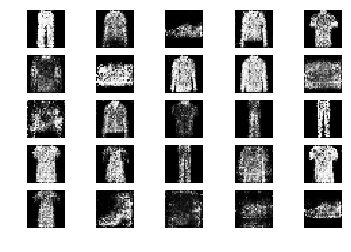

7951 [D loss: 0.564013, acc.: 76.56%] [G loss: 0.844204]
7952 [D loss: 0.693948, acc.: 53.12%] [G loss: 0.941345]
7953 [D loss: 0.656632, acc.: 67.19%] [G loss: 0.971798]
7954 [D loss: 0.648572, acc.: 56.25%] [G loss: 0.910765]
7955 [D loss: 0.619749, acc.: 70.31%] [G loss: 1.029974]
7956 [D loss: 0.608105, acc.: 68.75%] [G loss: 0.943405]
7957 [D loss: 0.678850, acc.: 59.38%] [G loss: 0.991899]
7958 [D loss: 0.612427, acc.: 67.19%] [G loss: 0.850179]
7959 [D loss: 0.649806, acc.: 62.50%] [G loss: 0.973818]
7960 [D loss: 0.652839, acc.: 65.62%] [G loss: 0.897566]
7961 [D loss: 0.722363, acc.: 54.69%] [G loss: 0.936581]
7962 [D loss: 0.610846, acc.: 65.62%] [G loss: 0.954764]
7963 [D loss: 0.704037, acc.: 51.56%] [G loss: 0.997771]
7964 [D loss: 0.644184, acc.: 64.06%] [G loss: 0.945717]
7965 [D loss: 0.682264, acc.: 57.81%] [G loss: 0.970608]
7966 [D loss: 0.662023, acc.: 60.94%] [G loss: 0.919687]
7967 [D loss: 0.682203, acc.: 50.00%] [G loss: 0.938166]
7968 [D loss: 0.656858, acc.: 6

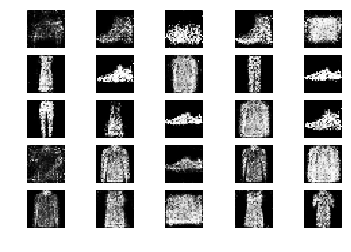

8001 [D loss: 0.664408, acc.: 57.81%] [G loss: 0.950136]
8002 [D loss: 0.656742, acc.: 60.94%] [G loss: 0.906924]
8003 [D loss: 0.645803, acc.: 60.94%] [G loss: 0.892318]
8004 [D loss: 0.670891, acc.: 60.94%] [G loss: 0.926273]
8005 [D loss: 0.634445, acc.: 53.12%] [G loss: 0.897844]
8006 [D loss: 0.666643, acc.: 57.81%] [G loss: 0.878359]
8007 [D loss: 0.731668, acc.: 56.25%] [G loss: 0.883333]
8008 [D loss: 0.680146, acc.: 60.94%] [G loss: 0.896595]
8009 [D loss: 0.623822, acc.: 68.75%] [G loss: 0.918871]
8010 [D loss: 0.649044, acc.: 70.31%] [G loss: 1.030430]
8011 [D loss: 0.644953, acc.: 57.81%] [G loss: 0.884755]
8012 [D loss: 0.685239, acc.: 57.81%] [G loss: 0.906024]
8013 [D loss: 0.690014, acc.: 65.62%] [G loss: 0.864399]
8014 [D loss: 0.642153, acc.: 65.62%] [G loss: 0.898243]
8015 [D loss: 0.635186, acc.: 65.62%] [G loss: 0.943418]
8016 [D loss: 0.684864, acc.: 60.94%] [G loss: 0.888194]
8017 [D loss: 0.666159, acc.: 62.50%] [G loss: 0.852003]
8018 [D loss: 0.658932, acc.: 6

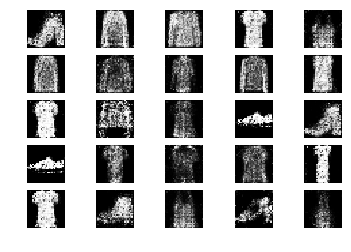

8051 [D loss: 0.635986, acc.: 64.06%] [G loss: 0.914276]
8052 [D loss: 0.696654, acc.: 60.94%] [G loss: 0.819822]
8053 [D loss: 0.656819, acc.: 60.94%] [G loss: 0.894037]
8054 [D loss: 0.649488, acc.: 62.50%] [G loss: 0.855890]
8055 [D loss: 0.627510, acc.: 68.75%] [G loss: 0.882595]
8056 [D loss: 0.656227, acc.: 57.81%] [G loss: 0.896218]
8057 [D loss: 0.640937, acc.: 62.50%] [G loss: 0.864946]
8058 [D loss: 0.610337, acc.: 68.75%] [G loss: 0.920146]
8059 [D loss: 0.605441, acc.: 75.00%] [G loss: 0.770437]
8060 [D loss: 0.672820, acc.: 53.12%] [G loss: 0.805481]
8061 [D loss: 0.673670, acc.: 60.94%] [G loss: 0.898131]
8062 [D loss: 0.708121, acc.: 53.12%] [G loss: 0.970633]
8063 [D loss: 0.647315, acc.: 65.62%] [G loss: 0.880312]
8064 [D loss: 0.737648, acc.: 53.12%] [G loss: 0.828334]
8065 [D loss: 0.656939, acc.: 64.06%] [G loss: 0.827238]
8066 [D loss: 0.646679, acc.: 67.19%] [G loss: 0.827685]
8067 [D loss: 0.728368, acc.: 48.44%] [G loss: 0.926687]
8068 [D loss: 0.641600, acc.: 6

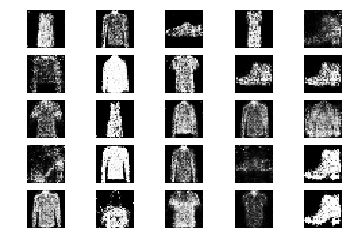

8101 [D loss: 0.689071, acc.: 60.94%] [G loss: 0.941337]
8102 [D loss: 0.687450, acc.: 54.69%] [G loss: 0.877573]
8103 [D loss: 0.679819, acc.: 54.69%] [G loss: 0.922793]
8104 [D loss: 0.608665, acc.: 57.81%] [G loss: 0.937168]
8105 [D loss: 0.722192, acc.: 46.88%] [G loss: 0.919688]
8106 [D loss: 0.669204, acc.: 59.38%] [G loss: 0.905512]
8107 [D loss: 0.649427, acc.: 57.81%] [G loss: 0.911929]
8108 [D loss: 0.653735, acc.: 65.62%] [G loss: 0.920671]
8109 [D loss: 0.628908, acc.: 64.06%] [G loss: 0.902080]
8110 [D loss: 0.618230, acc.: 71.88%] [G loss: 1.023729]
8111 [D loss: 0.641405, acc.: 67.19%] [G loss: 0.983164]
8112 [D loss: 0.710843, acc.: 48.44%] [G loss: 0.991274]
8113 [D loss: 0.677162, acc.: 59.38%] [G loss: 0.904754]
8114 [D loss: 0.644817, acc.: 68.75%] [G loss: 0.884507]
8115 [D loss: 0.626952, acc.: 67.19%] [G loss: 0.895725]
8116 [D loss: 0.615680, acc.: 68.75%] [G loss: 0.925220]
8117 [D loss: 0.705402, acc.: 54.69%] [G loss: 0.940042]
8118 [D loss: 0.626999, acc.: 6

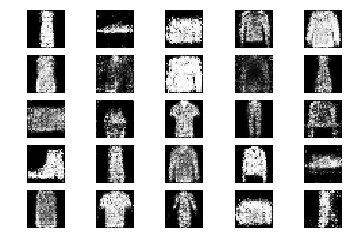

8151 [D loss: 0.634504, acc.: 64.06%] [G loss: 0.928330]
8152 [D loss: 0.669711, acc.: 65.62%] [G loss: 0.882712]
8153 [D loss: 0.626761, acc.: 62.50%] [G loss: 0.950870]
8154 [D loss: 0.613891, acc.: 68.75%] [G loss: 0.914201]
8155 [D loss: 0.740893, acc.: 50.00%] [G loss: 0.976364]
8156 [D loss: 0.659410, acc.: 60.94%] [G loss: 0.917482]
8157 [D loss: 0.669814, acc.: 54.69%] [G loss: 0.901444]
8158 [D loss: 0.621480, acc.: 64.06%] [G loss: 0.913743]
8159 [D loss: 0.661618, acc.: 48.44%] [G loss: 0.968426]
8160 [D loss: 0.641828, acc.: 60.94%] [G loss: 0.991039]
8161 [D loss: 0.609090, acc.: 67.19%] [G loss: 0.970688]
8162 [D loss: 0.677544, acc.: 62.50%] [G loss: 0.966241]
8163 [D loss: 0.622504, acc.: 62.50%] [G loss: 0.941013]
8164 [D loss: 0.689569, acc.: 54.69%] [G loss: 0.867619]
8165 [D loss: 0.658374, acc.: 67.19%] [G loss: 0.901871]
8166 [D loss: 0.630729, acc.: 67.19%] [G loss: 0.930722]
8167 [D loss: 0.560744, acc.: 76.56%] [G loss: 0.884243]
8168 [D loss: 0.660948, acc.: 6

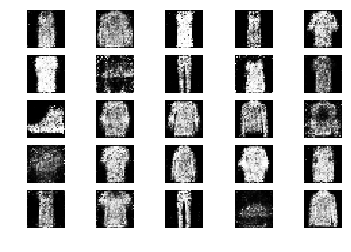

8201 [D loss: 0.660271, acc.: 65.62%] [G loss: 0.883342]
8202 [D loss: 0.684789, acc.: 62.50%] [G loss: 0.868610]
8203 [D loss: 0.584761, acc.: 73.44%] [G loss: 0.858125]
8204 [D loss: 0.666330, acc.: 60.94%] [G loss: 0.922167]
8205 [D loss: 0.631997, acc.: 65.62%] [G loss: 0.921540]
8206 [D loss: 0.699983, acc.: 51.56%] [G loss: 0.900101]
8207 [D loss: 0.653674, acc.: 62.50%] [G loss: 0.841982]
8208 [D loss: 0.693959, acc.: 57.81%] [G loss: 0.935858]
8209 [D loss: 0.632345, acc.: 62.50%] [G loss: 0.992002]
8210 [D loss: 0.632709, acc.: 62.50%] [G loss: 0.897455]
8211 [D loss: 0.652604, acc.: 59.38%] [G loss: 0.845270]
8212 [D loss: 0.653567, acc.: 56.25%] [G loss: 0.825538]
8213 [D loss: 0.654886, acc.: 64.06%] [G loss: 0.914497]
8214 [D loss: 0.644698, acc.: 59.38%] [G loss: 0.933808]
8215 [D loss: 0.626539, acc.: 64.06%] [G loss: 0.902709]
8216 [D loss: 0.654384, acc.: 62.50%] [G loss: 0.924770]
8217 [D loss: 0.658304, acc.: 60.94%] [G loss: 0.917233]
8218 [D loss: 0.630935, acc.: 6

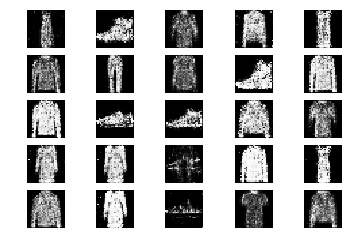

8251 [D loss: 0.622998, acc.: 64.06%] [G loss: 0.854090]
8252 [D loss: 0.719796, acc.: 53.12%] [G loss: 0.851802]
8253 [D loss: 0.698778, acc.: 56.25%] [G loss: 0.901742]
8254 [D loss: 0.587073, acc.: 70.31%] [G loss: 0.964113]
8255 [D loss: 0.633128, acc.: 59.38%] [G loss: 0.913658]
8256 [D loss: 0.668040, acc.: 60.94%] [G loss: 0.906895]
8257 [D loss: 0.647166, acc.: 62.50%] [G loss: 0.953360]
8258 [D loss: 0.641481, acc.: 57.81%] [G loss: 0.914081]
8259 [D loss: 0.704256, acc.: 48.44%] [G loss: 0.918311]
8260 [D loss: 0.670716, acc.: 57.81%] [G loss: 0.942339]
8261 [D loss: 0.649174, acc.: 57.81%] [G loss: 0.916661]
8262 [D loss: 0.680367, acc.: 59.38%] [G loss: 0.822599]
8263 [D loss: 0.624750, acc.: 62.50%] [G loss: 0.907615]
8264 [D loss: 0.687274, acc.: 57.81%] [G loss: 0.900296]
8265 [D loss: 0.649115, acc.: 62.50%] [G loss: 0.856184]
8266 [D loss: 0.636360, acc.: 56.25%] [G loss: 0.975742]
8267 [D loss: 0.676643, acc.: 59.38%] [G loss: 0.929694]
8268 [D loss: 0.694813, acc.: 5

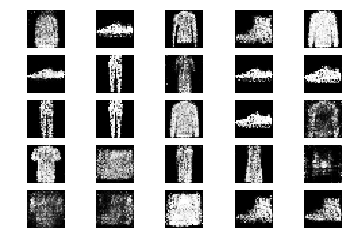

8301 [D loss: 0.629925, acc.: 64.06%] [G loss: 0.786689]
8302 [D loss: 0.602225, acc.: 67.19%] [G loss: 0.870434]
8303 [D loss: 0.660502, acc.: 65.62%] [G loss: 0.840120]
8304 [D loss: 0.644888, acc.: 60.94%] [G loss: 0.859615]
8305 [D loss: 0.696557, acc.: 59.38%] [G loss: 0.853450]
8306 [D loss: 0.671312, acc.: 56.25%] [G loss: 0.883549]
8307 [D loss: 0.661062, acc.: 67.19%] [G loss: 0.931411]
8308 [D loss: 0.641586, acc.: 60.94%] [G loss: 0.866063]
8309 [D loss: 0.622090, acc.: 68.75%] [G loss: 0.881402]
8310 [D loss: 0.604548, acc.: 67.19%] [G loss: 0.887137]
8311 [D loss: 0.630556, acc.: 71.88%] [G loss: 0.917128]
8312 [D loss: 0.659043, acc.: 64.06%] [G loss: 0.909392]
8313 [D loss: 0.692831, acc.: 53.12%] [G loss: 0.926752]
8314 [D loss: 0.567687, acc.: 76.56%] [G loss: 0.875634]
8315 [D loss: 0.611815, acc.: 68.75%] [G loss: 0.972021]
8316 [D loss: 0.634383, acc.: 65.62%] [G loss: 0.938053]
8317 [D loss: 0.718050, acc.: 50.00%] [G loss: 0.915217]
8318 [D loss: 0.686277, acc.: 5

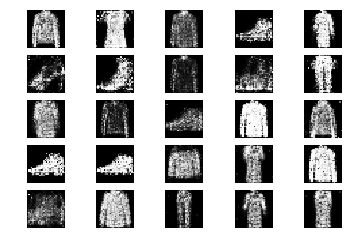

8351 [D loss: 0.604764, acc.: 67.19%] [G loss: 0.949739]
8352 [D loss: 0.633200, acc.: 65.62%] [G loss: 1.025594]
8353 [D loss: 0.635168, acc.: 62.50%] [G loss: 0.958074]
8354 [D loss: 0.649571, acc.: 57.81%] [G loss: 0.981098]
8355 [D loss: 0.715888, acc.: 50.00%] [G loss: 0.954157]
8356 [D loss: 0.648967, acc.: 62.50%] [G loss: 0.972340]
8357 [D loss: 0.616337, acc.: 70.31%] [G loss: 0.873440]
8358 [D loss: 0.643724, acc.: 64.06%] [G loss: 0.956528]
8359 [D loss: 0.623526, acc.: 67.19%] [G loss: 0.885716]
8360 [D loss: 0.635216, acc.: 62.50%] [G loss: 0.917380]
8361 [D loss: 0.660484, acc.: 53.12%] [G loss: 0.930916]
8362 [D loss: 0.688965, acc.: 59.38%] [G loss: 0.909721]
8363 [D loss: 0.666922, acc.: 60.94%] [G loss: 0.891852]
8364 [D loss: 0.667965, acc.: 54.69%] [G loss: 0.962584]
8365 [D loss: 0.641829, acc.: 62.50%] [G loss: 1.006951]
8366 [D loss: 0.674830, acc.: 60.94%] [G loss: 1.025357]
8367 [D loss: 0.645330, acc.: 64.06%] [G loss: 0.975413]
8368 [D loss: 0.677088, acc.: 5

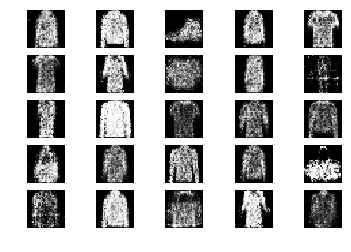

8401 [D loss: 0.686681, acc.: 51.56%] [G loss: 0.955746]
8402 [D loss: 0.660855, acc.: 64.06%] [G loss: 0.868817]
8403 [D loss: 0.739195, acc.: 50.00%] [G loss: 0.815237]
8404 [D loss: 0.623815, acc.: 65.62%] [G loss: 0.887196]
8405 [D loss: 0.723580, acc.: 54.69%] [G loss: 0.998532]
8406 [D loss: 0.693886, acc.: 54.69%] [G loss: 0.948903]
8407 [D loss: 0.667686, acc.: 60.94%] [G loss: 0.916658]
8408 [D loss: 0.665404, acc.: 56.25%] [G loss: 0.869786]
8409 [D loss: 0.677050, acc.: 54.69%] [G loss: 0.841139]
8410 [D loss: 0.662337, acc.: 60.94%] [G loss: 0.958098]
8411 [D loss: 0.630978, acc.: 60.94%] [G loss: 0.935316]
8412 [D loss: 0.657979, acc.: 57.81%] [G loss: 0.852854]
8413 [D loss: 0.673170, acc.: 56.25%] [G loss: 0.827878]
8414 [D loss: 0.652716, acc.: 62.50%] [G loss: 0.943139]
8415 [D loss: 0.568663, acc.: 78.12%] [G loss: 0.891296]
8416 [D loss: 0.666871, acc.: 62.50%] [G loss: 0.855833]
8417 [D loss: 0.680952, acc.: 56.25%] [G loss: 0.901372]
8418 [D loss: 0.626827, acc.: 6

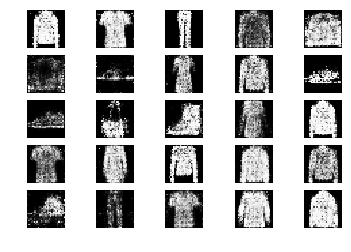

8451 [D loss: 0.640391, acc.: 64.06%] [G loss: 0.930245]
8452 [D loss: 0.631590, acc.: 67.19%] [G loss: 0.894714]
8453 [D loss: 0.598673, acc.: 75.00%] [G loss: 0.962302]
8454 [D loss: 0.696800, acc.: 60.94%] [G loss: 0.972034]
8455 [D loss: 0.632723, acc.: 62.50%] [G loss: 0.886188]
8456 [D loss: 0.595544, acc.: 70.31%] [G loss: 0.978678]
8457 [D loss: 0.711259, acc.: 53.12%] [G loss: 0.878183]
8458 [D loss: 0.613404, acc.: 68.75%] [G loss: 0.954758]
8459 [D loss: 0.688557, acc.: 56.25%] [G loss: 1.011771]
8460 [D loss: 0.647881, acc.: 57.81%] [G loss: 0.940559]
8461 [D loss: 0.639058, acc.: 60.94%] [G loss: 0.936864]
8462 [D loss: 0.689408, acc.: 56.25%] [G loss: 0.867560]
8463 [D loss: 0.757239, acc.: 45.31%] [G loss: 1.001830]
8464 [D loss: 0.650059, acc.: 57.81%] [G loss: 0.873968]
8465 [D loss: 0.638731, acc.: 64.06%] [G loss: 0.960872]
8466 [D loss: 0.648035, acc.: 65.62%] [G loss: 0.940105]
8467 [D loss: 0.627208, acc.: 64.06%] [G loss: 0.961739]
8468 [D loss: 0.622465, acc.: 6

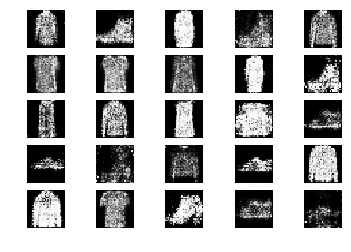

8501 [D loss: 0.591675, acc.: 65.62%] [G loss: 0.956302]
8502 [D loss: 0.629037, acc.: 73.44%] [G loss: 0.908385]
8503 [D loss: 0.671827, acc.: 56.25%] [G loss: 0.910585]
8504 [D loss: 0.629003, acc.: 62.50%] [G loss: 0.857087]
8505 [D loss: 0.723933, acc.: 45.31%] [G loss: 0.855817]
8506 [D loss: 0.583454, acc.: 73.44%] [G loss: 0.844903]
8507 [D loss: 0.766900, acc.: 42.19%] [G loss: 0.789689]
8508 [D loss: 0.567359, acc.: 71.88%] [G loss: 0.890071]
8509 [D loss: 0.676814, acc.: 57.81%] [G loss: 0.884151]
8510 [D loss: 0.656450, acc.: 59.38%] [G loss: 0.887537]
8511 [D loss: 0.627474, acc.: 65.62%] [G loss: 0.977373]
8512 [D loss: 0.697081, acc.: 56.25%] [G loss: 0.968556]
8513 [D loss: 0.678848, acc.: 57.81%] [G loss: 0.926307]
8514 [D loss: 0.560843, acc.: 78.12%] [G loss: 0.934049]
8515 [D loss: 0.623945, acc.: 64.06%] [G loss: 0.951830]
8516 [D loss: 0.675032, acc.: 51.56%] [G loss: 0.887445]
8517 [D loss: 0.662150, acc.: 65.62%] [G loss: 0.910707]
8518 [D loss: 0.639782, acc.: 6

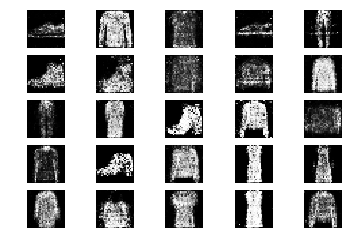

8551 [D loss: 0.639129, acc.: 57.81%] [G loss: 0.783536]
8552 [D loss: 0.648509, acc.: 60.94%] [G loss: 0.876382]
8553 [D loss: 0.663451, acc.: 56.25%] [G loss: 0.864226]
8554 [D loss: 0.619958, acc.: 65.62%] [G loss: 0.902330]
8555 [D loss: 0.634178, acc.: 57.81%] [G loss: 1.029170]
8556 [D loss: 0.661105, acc.: 62.50%] [G loss: 0.916114]
8557 [D loss: 0.716098, acc.: 54.69%] [G loss: 0.938474]
8558 [D loss: 0.672876, acc.: 56.25%] [G loss: 0.943353]
8559 [D loss: 0.602007, acc.: 75.00%] [G loss: 1.041705]
8560 [D loss: 0.604504, acc.: 70.31%] [G loss: 0.897079]
8561 [D loss: 0.693247, acc.: 51.56%] [G loss: 1.017917]
8562 [D loss: 0.659022, acc.: 57.81%] [G loss: 0.949383]
8563 [D loss: 0.609551, acc.: 64.06%] [G loss: 0.981735]
8564 [D loss: 0.672361, acc.: 57.81%] [G loss: 0.928922]
8565 [D loss: 0.589788, acc.: 71.88%] [G loss: 0.823034]
8566 [D loss: 0.669961, acc.: 64.06%] [G loss: 0.856558]
8567 [D loss: 0.659535, acc.: 59.38%] [G loss: 0.934589]
8568 [D loss: 0.615004, acc.: 6

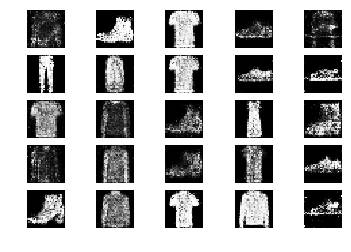

8601 [D loss: 0.623549, acc.: 65.62%] [G loss: 0.914220]
8602 [D loss: 0.611962, acc.: 65.62%] [G loss: 0.904175]
8603 [D loss: 0.575630, acc.: 75.00%] [G loss: 0.977630]
8604 [D loss: 0.626427, acc.: 60.94%] [G loss: 0.960000]
8605 [D loss: 0.551856, acc.: 67.19%] [G loss: 0.960545]
8606 [D loss: 0.608562, acc.: 64.06%] [G loss: 0.888847]
8607 [D loss: 0.731256, acc.: 54.69%] [G loss: 0.867581]
8608 [D loss: 0.724079, acc.: 53.12%] [G loss: 0.953812]
8609 [D loss: 0.651948, acc.: 62.50%] [G loss: 0.954616]
8610 [D loss: 0.667197, acc.: 64.06%] [G loss: 0.828570]
8611 [D loss: 0.670587, acc.: 57.81%] [G loss: 0.941280]
8612 [D loss: 0.652064, acc.: 59.38%] [G loss: 0.960382]
8613 [D loss: 0.601275, acc.: 68.75%] [G loss: 0.938088]
8614 [D loss: 0.652382, acc.: 64.06%] [G loss: 0.852371]
8615 [D loss: 0.695720, acc.: 57.81%] [G loss: 0.933819]
8616 [D loss: 0.613220, acc.: 67.19%] [G loss: 0.828889]
8617 [D loss: 0.652693, acc.: 60.94%] [G loss: 0.839290]
8618 [D loss: 0.622994, acc.: 7

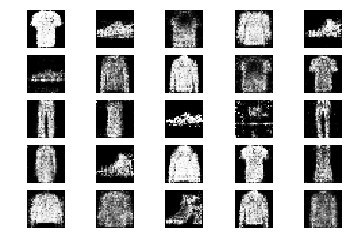

8651 [D loss: 0.639940, acc.: 60.94%] [G loss: 0.922556]
8652 [D loss: 0.677129, acc.: 54.69%] [G loss: 0.952138]
8653 [D loss: 0.644725, acc.: 62.50%] [G loss: 0.943272]
8654 [D loss: 0.709978, acc.: 56.25%] [G loss: 0.949952]
8655 [D loss: 0.754011, acc.: 54.69%] [G loss: 0.865657]
8656 [D loss: 0.659398, acc.: 59.38%] [G loss: 0.903912]
8657 [D loss: 0.603512, acc.: 64.06%] [G loss: 0.859659]
8658 [D loss: 0.645200, acc.: 70.31%] [G loss: 0.850495]
8659 [D loss: 0.627233, acc.: 64.06%] [G loss: 0.924634]
8660 [D loss: 0.680352, acc.: 53.12%] [G loss: 0.911458]
8661 [D loss: 0.703388, acc.: 60.94%] [G loss: 1.024145]
8662 [D loss: 0.630439, acc.: 65.62%] [G loss: 0.971782]
8663 [D loss: 0.683199, acc.: 60.94%] [G loss: 0.864793]
8664 [D loss: 0.686625, acc.: 56.25%] [G loss: 0.808619]
8665 [D loss: 0.722471, acc.: 54.69%] [G loss: 0.904140]
8666 [D loss: 0.655178, acc.: 56.25%] [G loss: 0.871796]
8667 [D loss: 0.660979, acc.: 64.06%] [G loss: 0.904587]
8668 [D loss: 0.618571, acc.: 7

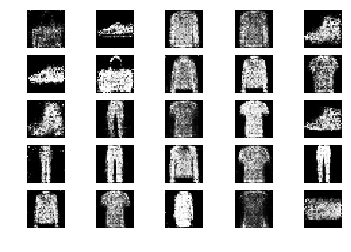

8701 [D loss: 0.608245, acc.: 68.75%] [G loss: 0.968813]
8702 [D loss: 0.690097, acc.: 56.25%] [G loss: 0.914136]
8703 [D loss: 0.561075, acc.: 78.12%] [G loss: 0.938546]
8704 [D loss: 0.620253, acc.: 59.38%] [G loss: 0.874668]
8705 [D loss: 0.677843, acc.: 65.62%] [G loss: 0.874517]
8706 [D loss: 0.589143, acc.: 67.19%] [G loss: 1.020580]
8707 [D loss: 0.652739, acc.: 60.94%] [G loss: 0.916519]
8708 [D loss: 0.609488, acc.: 71.88%] [G loss: 0.899506]
8709 [D loss: 0.630026, acc.: 62.50%] [G loss: 0.990586]
8710 [D loss: 0.561681, acc.: 78.12%] [G loss: 1.006641]
8711 [D loss: 0.645980, acc.: 71.88%] [G loss: 0.993327]
8712 [D loss: 0.678655, acc.: 65.62%] [G loss: 0.936939]
8713 [D loss: 0.626766, acc.: 65.62%] [G loss: 1.007102]
8714 [D loss: 0.706262, acc.: 53.12%] [G loss: 1.001990]
8715 [D loss: 0.603955, acc.: 70.31%] [G loss: 1.014221]
8716 [D loss: 0.649028, acc.: 60.94%] [G loss: 0.907336]
8717 [D loss: 0.645028, acc.: 62.50%] [G loss: 0.980436]
8718 [D loss: 0.679241, acc.: 5

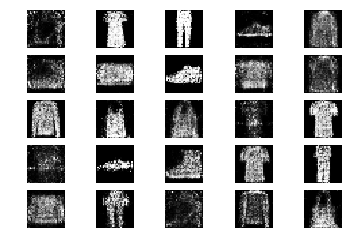

8751 [D loss: 0.682332, acc.: 57.81%] [G loss: 0.853486]
8752 [D loss: 0.686212, acc.: 62.50%] [G loss: 0.857997]
8753 [D loss: 0.662566, acc.: 56.25%] [G loss: 0.932979]
8754 [D loss: 0.592533, acc.: 78.12%] [G loss: 1.005077]
8755 [D loss: 0.667016, acc.: 59.38%] [G loss: 0.998051]
8756 [D loss: 0.602621, acc.: 67.19%] [G loss: 0.968010]
8757 [D loss: 0.697234, acc.: 54.69%] [G loss: 0.898422]
8758 [D loss: 0.648028, acc.: 64.06%] [G loss: 0.808679]
8759 [D loss: 0.703492, acc.: 54.69%] [G loss: 0.927971]
8760 [D loss: 0.677268, acc.: 60.94%] [G loss: 0.865593]
8761 [D loss: 0.696698, acc.: 54.69%] [G loss: 0.961988]
8762 [D loss: 0.609816, acc.: 70.31%] [G loss: 0.870189]
8763 [D loss: 0.699416, acc.: 56.25%] [G loss: 0.960274]
8764 [D loss: 0.705479, acc.: 59.38%] [G loss: 0.814425]
8765 [D loss: 0.662098, acc.: 67.19%] [G loss: 0.856827]
8766 [D loss: 0.657608, acc.: 62.50%] [G loss: 0.864606]
8767 [D loss: 0.664734, acc.: 64.06%] [G loss: 0.963230]
8768 [D loss: 0.610134, acc.: 7

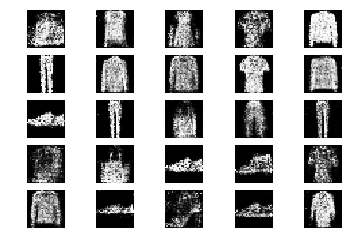

8801 [D loss: 0.682928, acc.: 60.94%] [G loss: 0.880362]
8802 [D loss: 0.702132, acc.: 57.81%] [G loss: 0.942193]
8803 [D loss: 0.660559, acc.: 57.81%] [G loss: 0.934985]
8804 [D loss: 0.686050, acc.: 56.25%] [G loss: 0.949682]
8805 [D loss: 0.595835, acc.: 78.12%] [G loss: 0.908238]
8806 [D loss: 0.659236, acc.: 65.62%] [G loss: 0.906243]
8807 [D loss: 0.698272, acc.: 48.44%] [G loss: 0.846485]
8808 [D loss: 0.606020, acc.: 67.19%] [G loss: 0.868566]
8809 [D loss: 0.702218, acc.: 54.69%] [G loss: 0.908736]
8810 [D loss: 0.672115, acc.: 59.38%] [G loss: 0.903855]
8811 [D loss: 0.689547, acc.: 54.69%] [G loss: 0.864029]
8812 [D loss: 0.665162, acc.: 57.81%] [G loss: 0.986623]
8813 [D loss: 0.667332, acc.: 59.38%] [G loss: 1.021673]
8814 [D loss: 0.568131, acc.: 71.88%] [G loss: 1.017692]
8815 [D loss: 0.678057, acc.: 56.25%] [G loss: 0.853454]
8816 [D loss: 0.621944, acc.: 64.06%] [G loss: 0.820257]
8817 [D loss: 0.622031, acc.: 73.44%] [G loss: 0.878985]
8818 [D loss: 0.672436, acc.: 5

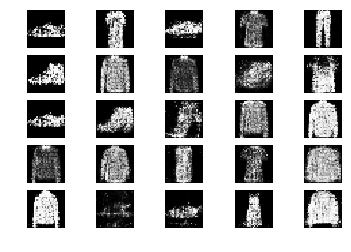

8851 [D loss: 0.650275, acc.: 60.94%] [G loss: 0.821589]
8852 [D loss: 0.700650, acc.: 51.56%] [G loss: 0.886883]
8853 [D loss: 0.612725, acc.: 67.19%] [G loss: 0.901911]
8854 [D loss: 0.622584, acc.: 60.94%] [G loss: 0.846928]
8855 [D loss: 0.693476, acc.: 50.00%] [G loss: 0.930802]
8856 [D loss: 0.690618, acc.: 54.69%] [G loss: 0.895418]
8857 [D loss: 0.704395, acc.: 53.12%] [G loss: 0.891853]
8858 [D loss: 0.582121, acc.: 73.44%] [G loss: 0.880870]
8859 [D loss: 0.613652, acc.: 62.50%] [G loss: 0.957966]
8860 [D loss: 0.641589, acc.: 64.06%] [G loss: 0.932915]
8861 [D loss: 0.672902, acc.: 59.38%] [G loss: 0.939387]
8862 [D loss: 0.630496, acc.: 67.19%] [G loss: 0.992366]
8863 [D loss: 0.672863, acc.: 56.25%] [G loss: 0.942192]
8864 [D loss: 0.704479, acc.: 51.56%] [G loss: 0.912738]
8865 [D loss: 0.719458, acc.: 53.12%] [G loss: 0.961819]
8866 [D loss: 0.666428, acc.: 59.38%] [G loss: 0.946953]
8867 [D loss: 0.667953, acc.: 57.81%] [G loss: 0.894800]
8868 [D loss: 0.626684, acc.: 6

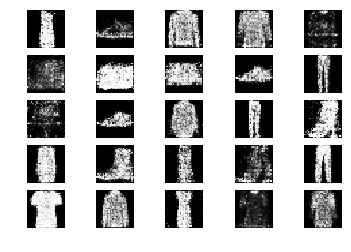

8901 [D loss: 0.666024, acc.: 59.38%] [G loss: 0.927049]
8902 [D loss: 0.606403, acc.: 64.06%] [G loss: 0.867083]
8903 [D loss: 0.640214, acc.: 68.75%] [G loss: 0.938331]
8904 [D loss: 0.681141, acc.: 57.81%] [G loss: 0.925680]
8905 [D loss: 0.669141, acc.: 53.12%] [G loss: 0.960227]
8906 [D loss: 0.639600, acc.: 60.94%] [G loss: 0.988860]
8907 [D loss: 0.703408, acc.: 56.25%] [G loss: 0.939230]
8908 [D loss: 0.628664, acc.: 65.62%] [G loss: 0.923256]
8909 [D loss: 0.633655, acc.: 62.50%] [G loss: 0.962190]
8910 [D loss: 0.664571, acc.: 62.50%] [G loss: 0.976791]
8911 [D loss: 0.616681, acc.: 59.38%] [G loss: 0.948400]
8912 [D loss: 0.683513, acc.: 64.06%] [G loss: 0.988855]
8913 [D loss: 0.655265, acc.: 56.25%] [G loss: 0.936002]
8914 [D loss: 0.703107, acc.: 57.81%] [G loss: 0.963606]
8915 [D loss: 0.597340, acc.: 65.62%] [G loss: 0.875048]
8916 [D loss: 0.656917, acc.: 64.06%] [G loss: 0.859728]
8917 [D loss: 0.636159, acc.: 64.06%] [G loss: 0.900261]
8918 [D loss: 0.633018, acc.: 7

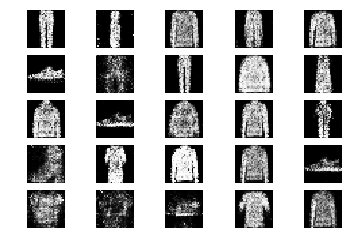

8951 [D loss: 0.693156, acc.: 51.56%] [G loss: 0.996632]
8952 [D loss: 0.620829, acc.: 59.38%] [G loss: 1.019685]
8953 [D loss: 0.635762, acc.: 60.94%] [G loss: 0.982851]
8954 [D loss: 0.579818, acc.: 71.88%] [G loss: 0.870616]
8955 [D loss: 0.550609, acc.: 75.00%] [G loss: 1.022888]
8956 [D loss: 0.614654, acc.: 62.50%] [G loss: 0.858897]
8957 [D loss: 0.672237, acc.: 56.25%] [G loss: 0.846438]
8958 [D loss: 0.673335, acc.: 53.12%] [G loss: 0.878272]
8959 [D loss: 0.639495, acc.: 64.06%] [G loss: 0.971520]
8960 [D loss: 0.597597, acc.: 67.19%] [G loss: 0.807059]
8961 [D loss: 0.655225, acc.: 54.69%] [G loss: 0.819763]
8962 [D loss: 0.620323, acc.: 73.44%] [G loss: 0.852085]
8963 [D loss: 0.681677, acc.: 62.50%] [G loss: 0.881965]
8964 [D loss: 0.628798, acc.: 65.62%] [G loss: 0.967566]
8965 [D loss: 0.686916, acc.: 62.50%] [G loss: 0.953084]
8966 [D loss: 0.658087, acc.: 62.50%] [G loss: 0.967032]
8967 [D loss: 0.641596, acc.: 65.62%] [G loss: 0.963875]
8968 [D loss: 0.633177, acc.: 7

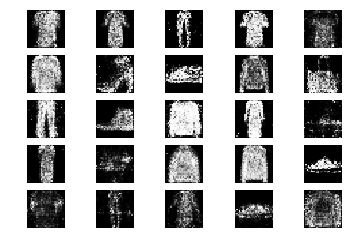

9001 [D loss: 0.627107, acc.: 64.06%] [G loss: 0.952709]
9002 [D loss: 0.645482, acc.: 65.62%] [G loss: 0.802604]
9003 [D loss: 0.571425, acc.: 71.88%] [G loss: 0.938272]
9004 [D loss: 0.713334, acc.: 51.56%] [G loss: 0.909709]
9005 [D loss: 0.658972, acc.: 59.38%] [G loss: 0.935886]
9006 [D loss: 0.713757, acc.: 48.44%] [G loss: 0.867263]
9007 [D loss: 0.641785, acc.: 64.06%] [G loss: 0.891466]
9008 [D loss: 0.685513, acc.: 59.38%] [G loss: 0.903425]
9009 [D loss: 0.587353, acc.: 68.75%] [G loss: 0.967802]
9010 [D loss: 0.608114, acc.: 67.19%] [G loss: 0.937370]
9011 [D loss: 0.635762, acc.: 57.81%] [G loss: 0.933708]
9012 [D loss: 0.627296, acc.: 68.75%] [G loss: 0.905292]
9013 [D loss: 0.658031, acc.: 65.62%] [G loss: 0.897483]
9014 [D loss: 0.720716, acc.: 54.69%] [G loss: 0.952703]
9015 [D loss: 0.701440, acc.: 48.44%] [G loss: 0.963330]
9016 [D loss: 0.627812, acc.: 75.00%] [G loss: 0.929782]
9017 [D loss: 0.636163, acc.: 65.62%] [G loss: 0.923311]
9018 [D loss: 0.720153, acc.: 5

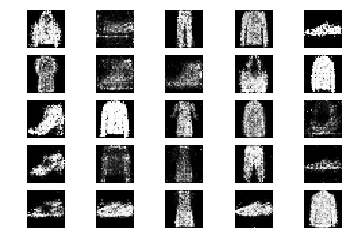

9051 [D loss: 0.654179, acc.: 67.19%] [G loss: 0.965902]
9052 [D loss: 0.653628, acc.: 59.38%] [G loss: 0.826471]
9053 [D loss: 0.628148, acc.: 67.19%] [G loss: 0.864728]
9054 [D loss: 0.709444, acc.: 56.25%] [G loss: 0.914158]
9055 [D loss: 0.675444, acc.: 56.25%] [G loss: 0.877344]
9056 [D loss: 0.622468, acc.: 68.75%] [G loss: 0.957597]
9057 [D loss: 0.653281, acc.: 60.94%] [G loss: 0.883761]
9058 [D loss: 0.624906, acc.: 68.75%] [G loss: 0.924733]
9059 [D loss: 0.649352, acc.: 62.50%] [G loss: 0.912562]
9060 [D loss: 0.628044, acc.: 60.94%] [G loss: 0.947505]
9061 [D loss: 0.607387, acc.: 78.12%] [G loss: 1.056577]
9062 [D loss: 0.629307, acc.: 64.06%] [G loss: 0.911832]
9063 [D loss: 0.648498, acc.: 56.25%] [G loss: 0.977321]
9064 [D loss: 0.657267, acc.: 64.06%] [G loss: 0.889514]
9065 [D loss: 0.682587, acc.: 53.12%] [G loss: 0.943381]
9066 [D loss: 0.598922, acc.: 70.31%] [G loss: 0.956659]
9067 [D loss: 0.625351, acc.: 65.62%] [G loss: 0.930103]
9068 [D loss: 0.684097, acc.: 5

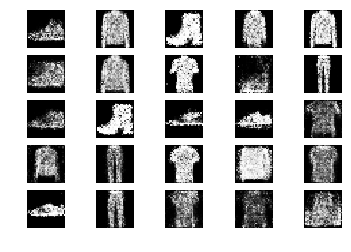

9101 [D loss: 0.642386, acc.: 65.62%] [G loss: 0.895538]
9102 [D loss: 0.691052, acc.: 65.62%] [G loss: 0.932379]
9103 [D loss: 0.675275, acc.: 50.00%] [G loss: 0.902361]
9104 [D loss: 0.699159, acc.: 53.12%] [G loss: 0.928074]
9105 [D loss: 0.631990, acc.: 62.50%] [G loss: 0.939170]
9106 [D loss: 0.581897, acc.: 67.19%] [G loss: 1.078046]
9107 [D loss: 0.726972, acc.: 53.12%] [G loss: 0.935947]
9108 [D loss: 0.642359, acc.: 64.06%] [G loss: 0.945519]
9109 [D loss: 0.676047, acc.: 54.69%] [G loss: 0.891383]
9110 [D loss: 0.695371, acc.: 53.12%] [G loss: 0.899009]
9111 [D loss: 0.697149, acc.: 53.12%] [G loss: 0.949727]
9112 [D loss: 0.600595, acc.: 70.31%] [G loss: 0.947651]
9113 [D loss: 0.670799, acc.: 57.81%] [G loss: 0.947370]
9114 [D loss: 0.626820, acc.: 64.06%] [G loss: 0.874891]
9115 [D loss: 0.646081, acc.: 54.69%] [G loss: 0.875435]
9116 [D loss: 0.676522, acc.: 64.06%] [G loss: 0.837904]
9117 [D loss: 0.672600, acc.: 59.38%] [G loss: 0.826628]
9118 [D loss: 0.579375, acc.: 6

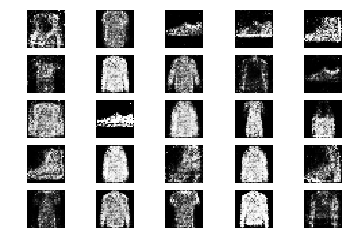

9151 [D loss: 0.648174, acc.: 62.50%] [G loss: 0.937852]
9152 [D loss: 0.691902, acc.: 54.69%] [G loss: 0.850366]
9153 [D loss: 0.650719, acc.: 59.38%] [G loss: 0.953078]
9154 [D loss: 0.670756, acc.: 56.25%] [G loss: 0.945378]
9155 [D loss: 0.605030, acc.: 70.31%] [G loss: 0.911521]
9156 [D loss: 0.674675, acc.: 56.25%] [G loss: 0.853695]
9157 [D loss: 0.633536, acc.: 64.06%] [G loss: 0.990920]
9158 [D loss: 0.571230, acc.: 73.44%] [G loss: 0.997584]
9159 [D loss: 0.667678, acc.: 57.81%] [G loss: 0.993727]
9160 [D loss: 0.708518, acc.: 54.69%] [G loss: 0.965178]
9161 [D loss: 0.647199, acc.: 56.25%] [G loss: 1.012459]
9162 [D loss: 0.627698, acc.: 62.50%] [G loss: 1.006736]
9163 [D loss: 0.737546, acc.: 56.25%] [G loss: 0.980719]
9164 [D loss: 0.616050, acc.: 68.75%] [G loss: 0.885777]
9165 [D loss: 0.630419, acc.: 60.94%] [G loss: 0.909742]
9166 [D loss: 0.621244, acc.: 67.19%] [G loss: 0.945801]
9167 [D loss: 0.611637, acc.: 71.88%] [G loss: 1.046377]
9168 [D loss: 0.652907, acc.: 6

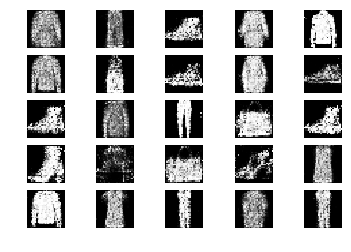

9201 [D loss: 0.663792, acc.: 56.25%] [G loss: 0.928661]
9202 [D loss: 0.608636, acc.: 68.75%] [G loss: 0.964875]
9203 [D loss: 0.594139, acc.: 67.19%] [G loss: 0.847010]
9204 [D loss: 0.570411, acc.: 73.44%] [G loss: 0.916621]
9205 [D loss: 0.609608, acc.: 75.00%] [G loss: 1.008595]
9206 [D loss: 0.628557, acc.: 62.50%] [G loss: 0.937358]
9207 [D loss: 0.610370, acc.: 65.62%] [G loss: 0.882422]
9208 [D loss: 0.727649, acc.: 54.69%] [G loss: 0.905609]
9209 [D loss: 0.565765, acc.: 75.00%] [G loss: 0.910984]
9210 [D loss: 0.637877, acc.: 59.38%] [G loss: 0.985194]
9211 [D loss: 0.640324, acc.: 54.69%] [G loss: 0.887363]
9212 [D loss: 0.611439, acc.: 59.38%] [G loss: 0.829929]
9213 [D loss: 0.630246, acc.: 68.75%] [G loss: 0.900474]
9214 [D loss: 0.691706, acc.: 54.69%] [G loss: 0.985449]
9215 [D loss: 0.687977, acc.: 56.25%] [G loss: 0.898945]
9216 [D loss: 0.730955, acc.: 48.44%] [G loss: 0.988814]
9217 [D loss: 0.682904, acc.: 60.94%] [G loss: 0.951241]
9218 [D loss: 0.636741, acc.: 6

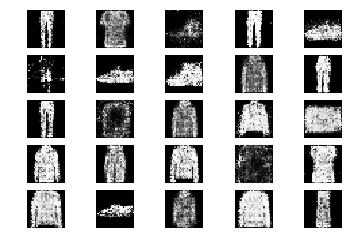

9251 [D loss: 0.672143, acc.: 60.94%] [G loss: 1.013083]
9252 [D loss: 0.616572, acc.: 65.62%] [G loss: 0.997386]
9253 [D loss: 0.682271, acc.: 51.56%] [G loss: 0.959484]
9254 [D loss: 0.624094, acc.: 68.75%] [G loss: 0.940006]
9255 [D loss: 0.663571, acc.: 60.94%] [G loss: 0.853049]
9256 [D loss: 0.611031, acc.: 65.62%] [G loss: 0.817118]
9257 [D loss: 0.664392, acc.: 60.94%] [G loss: 0.900095]
9258 [D loss: 0.679031, acc.: 62.50%] [G loss: 0.888167]
9259 [D loss: 0.656698, acc.: 60.94%] [G loss: 0.891337]
9260 [D loss: 0.566009, acc.: 71.88%] [G loss: 0.851953]
9261 [D loss: 0.659353, acc.: 51.56%] [G loss: 0.933119]
9262 [D loss: 0.631076, acc.: 71.88%] [G loss: 0.935978]
9263 [D loss: 0.680644, acc.: 59.38%] [G loss: 0.922292]
9264 [D loss: 0.676640, acc.: 62.50%] [G loss: 0.868583]
9265 [D loss: 0.650788, acc.: 57.81%] [G loss: 0.877673]
9266 [D loss: 0.656640, acc.: 67.19%] [G loss: 0.838092]
9267 [D loss: 0.677651, acc.: 57.81%] [G loss: 0.984451]
9268 [D loss: 0.634912, acc.: 5

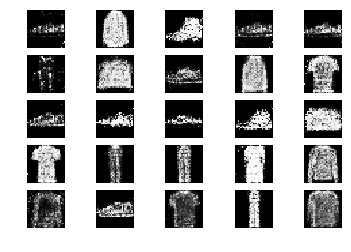

9301 [D loss: 0.631143, acc.: 65.62%] [G loss: 0.902683]
9302 [D loss: 0.684673, acc.: 54.69%] [G loss: 0.822548]
9303 [D loss: 0.633141, acc.: 57.81%] [G loss: 0.862373]
9304 [D loss: 0.664313, acc.: 59.38%] [G loss: 0.971330]
9305 [D loss: 0.569554, acc.: 68.75%] [G loss: 1.051405]
9306 [D loss: 0.645050, acc.: 67.19%] [G loss: 0.997290]
9307 [D loss: 0.541582, acc.: 78.12%] [G loss: 0.962773]
9308 [D loss: 0.662975, acc.: 57.81%] [G loss: 0.943394]
9309 [D loss: 0.608898, acc.: 70.31%] [G loss: 0.882533]
9310 [D loss: 0.708761, acc.: 57.81%] [G loss: 0.765495]
9311 [D loss: 0.670725, acc.: 62.50%] [G loss: 0.899633]
9312 [D loss: 0.593752, acc.: 65.62%] [G loss: 0.930795]
9313 [D loss: 0.701250, acc.: 50.00%] [G loss: 0.931388]
9314 [D loss: 0.622762, acc.: 71.88%] [G loss: 0.882764]
9315 [D loss: 0.657156, acc.: 59.38%] [G loss: 0.961063]
9316 [D loss: 0.589508, acc.: 76.56%] [G loss: 0.890204]
9317 [D loss: 0.661797, acc.: 57.81%] [G loss: 0.940178]
9318 [D loss: 0.659836, acc.: 6

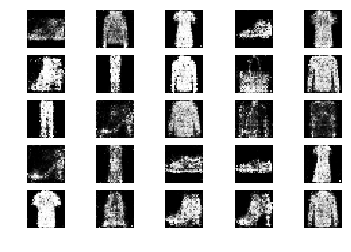

9351 [D loss: 0.726851, acc.: 46.88%] [G loss: 0.860617]
9352 [D loss: 0.724544, acc.: 59.38%] [G loss: 0.891273]
9353 [D loss: 0.647955, acc.: 60.94%] [G loss: 0.923048]
9354 [D loss: 0.647988, acc.: 59.38%] [G loss: 0.881909]
9355 [D loss: 0.625851, acc.: 62.50%] [G loss: 0.896760]
9356 [D loss: 0.652003, acc.: 54.69%] [G loss: 0.927690]
9357 [D loss: 0.604372, acc.: 70.31%] [G loss: 0.940466]
9358 [D loss: 0.676619, acc.: 54.69%] [G loss: 0.974532]
9359 [D loss: 0.594763, acc.: 68.75%] [G loss: 0.935795]
9360 [D loss: 0.724961, acc.: 53.12%] [G loss: 0.940179]
9361 [D loss: 0.706602, acc.: 51.56%] [G loss: 0.869401]
9362 [D loss: 0.707980, acc.: 54.69%] [G loss: 0.907410]
9363 [D loss: 0.668413, acc.: 59.38%] [G loss: 0.893975]
9364 [D loss: 0.654556, acc.: 68.75%] [G loss: 0.863619]
9365 [D loss: 0.634498, acc.: 71.88%] [G loss: 0.930810]
9366 [D loss: 0.671623, acc.: 56.25%] [G loss: 0.837743]
9367 [D loss: 0.674169, acc.: 57.81%] [G loss: 0.867861]
9368 [D loss: 0.633571, acc.: 6

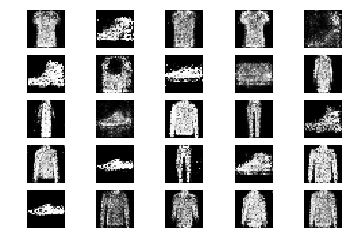

9401 [D loss: 0.705825, acc.: 48.44%] [G loss: 0.835371]
9402 [D loss: 0.654066, acc.: 60.94%] [G loss: 0.833936]
9403 [D loss: 0.695693, acc.: 54.69%] [G loss: 0.918950]
9404 [D loss: 0.625757, acc.: 68.75%] [G loss: 0.998336]
9405 [D loss: 0.636322, acc.: 68.75%] [G loss: 0.987599]
9406 [D loss: 0.698161, acc.: 59.38%] [G loss: 0.967498]
9407 [D loss: 0.621411, acc.: 60.94%] [G loss: 0.979730]
9408 [D loss: 0.627821, acc.: 65.62%] [G loss: 0.931794]
9409 [D loss: 0.696837, acc.: 53.12%] [G loss: 0.941392]
9410 [D loss: 0.602381, acc.: 67.19%] [G loss: 0.914105]
9411 [D loss: 0.633713, acc.: 60.94%] [G loss: 0.857776]
9412 [D loss: 0.608176, acc.: 68.75%] [G loss: 0.949225]
9413 [D loss: 0.634753, acc.: 62.50%] [G loss: 0.888803]
9414 [D loss: 0.624092, acc.: 64.06%] [G loss: 0.904193]
9415 [D loss: 0.656077, acc.: 57.81%] [G loss: 0.893819]
9416 [D loss: 0.606532, acc.: 67.19%] [G loss: 0.852726]
9417 [D loss: 0.601856, acc.: 73.44%] [G loss: 0.839826]
9418 [D loss: 0.679966, acc.: 5

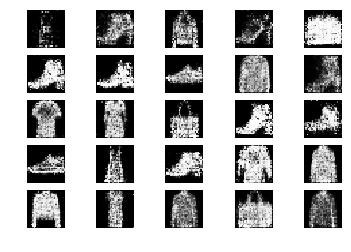

9451 [D loss: 0.675067, acc.: 54.69%] [G loss: 0.900085]
9452 [D loss: 0.642162, acc.: 64.06%] [G loss: 1.019032]
9453 [D loss: 0.666455, acc.: 60.94%] [G loss: 0.919303]
9454 [D loss: 0.652603, acc.: 56.25%] [G loss: 0.932607]
9455 [D loss: 0.643108, acc.: 60.94%] [G loss: 0.873723]
9456 [D loss: 0.680874, acc.: 60.94%] [G loss: 0.945973]
9457 [D loss: 0.626931, acc.: 68.75%] [G loss: 0.812998]
9458 [D loss: 0.667249, acc.: 60.94%] [G loss: 0.900366]
9459 [D loss: 0.675550, acc.: 57.81%] [G loss: 0.880618]
9460 [D loss: 0.681787, acc.: 59.38%] [G loss: 0.889736]
9461 [D loss: 0.567818, acc.: 71.88%] [G loss: 0.834569]
9462 [D loss: 0.631802, acc.: 59.38%] [G loss: 0.963233]
9463 [D loss: 0.576801, acc.: 68.75%] [G loss: 0.962915]
9464 [D loss: 0.684949, acc.: 59.38%] [G loss: 0.894336]
9465 [D loss: 0.596366, acc.: 65.62%] [G loss: 1.004955]
9466 [D loss: 0.652218, acc.: 56.25%] [G loss: 0.921046]
9467 [D loss: 0.600126, acc.: 70.31%] [G loss: 1.004274]
9468 [D loss: 0.685461, acc.: 6

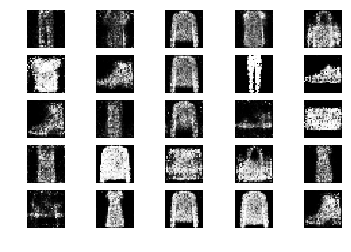

9501 [D loss: 0.678566, acc.: 62.50%] [G loss: 0.789678]
9502 [D loss: 0.615829, acc.: 73.44%] [G loss: 0.909090]
9503 [D loss: 0.644062, acc.: 60.94%] [G loss: 0.902011]
9504 [D loss: 0.664276, acc.: 70.31%] [G loss: 0.907139]
9505 [D loss: 0.601799, acc.: 65.62%] [G loss: 0.921605]
9506 [D loss: 0.616931, acc.: 59.38%] [G loss: 0.848863]
9507 [D loss: 0.692725, acc.: 51.56%] [G loss: 0.940293]
9508 [D loss: 0.586661, acc.: 71.88%] [G loss: 0.919316]
9509 [D loss: 0.602968, acc.: 70.31%] [G loss: 0.975116]
9510 [D loss: 0.661948, acc.: 62.50%] [G loss: 0.920039]
9511 [D loss: 0.614139, acc.: 65.62%] [G loss: 0.917069]
9512 [D loss: 0.624972, acc.: 70.31%] [G loss: 0.840981]
9513 [D loss: 0.639472, acc.: 68.75%] [G loss: 0.791097]
9514 [D loss: 0.570212, acc.: 68.75%] [G loss: 0.818850]
9515 [D loss: 0.720253, acc.: 43.75%] [G loss: 0.841092]
9516 [D loss: 0.637933, acc.: 68.75%] [G loss: 0.915774]
9517 [D loss: 0.664643, acc.: 60.94%] [G loss: 0.975392]
9518 [D loss: 0.582977, acc.: 7

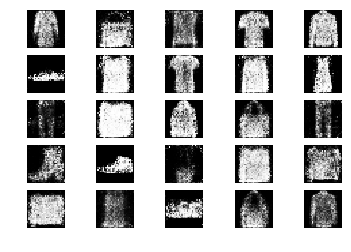

9551 [D loss: 0.711393, acc.: 56.25%] [G loss: 0.852913]
9552 [D loss: 0.597597, acc.: 75.00%] [G loss: 0.972997]
9553 [D loss: 0.633364, acc.: 64.06%] [G loss: 0.931400]
9554 [D loss: 0.654250, acc.: 56.25%] [G loss: 0.952480]
9555 [D loss: 0.650596, acc.: 56.25%] [G loss: 0.996431]
9556 [D loss: 0.633084, acc.: 70.31%] [G loss: 0.935871]
9557 [D loss: 0.704793, acc.: 51.56%] [G loss: 0.982650]
9558 [D loss: 0.618732, acc.: 70.31%] [G loss: 0.940037]
9559 [D loss: 0.646655, acc.: 57.81%] [G loss: 0.926300]
9560 [D loss: 0.676731, acc.: 62.50%] [G loss: 0.994099]
9561 [D loss: 0.608608, acc.: 68.75%] [G loss: 0.897229]
9562 [D loss: 0.692141, acc.: 60.94%] [G loss: 0.854484]
9563 [D loss: 0.699647, acc.: 64.06%] [G loss: 0.925362]
9564 [D loss: 0.676438, acc.: 60.94%] [G loss: 0.910807]
9565 [D loss: 0.663029, acc.: 57.81%] [G loss: 0.975057]
9566 [D loss: 0.656203, acc.: 67.19%] [G loss: 0.900720]
9567 [D loss: 0.617574, acc.: 65.62%] [G loss: 0.926840]
9568 [D loss: 0.597643, acc.: 7

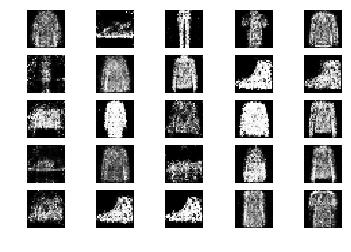

9601 [D loss: 0.623186, acc.: 73.44%] [G loss: 1.044537]
9602 [D loss: 0.658366, acc.: 65.62%] [G loss: 0.967214]
9603 [D loss: 0.729311, acc.: 54.69%] [G loss: 0.935648]
9604 [D loss: 0.686490, acc.: 56.25%] [G loss: 0.936290]
9605 [D loss: 0.674649, acc.: 54.69%] [G loss: 0.909754]
9606 [D loss: 0.650131, acc.: 60.94%] [G loss: 0.885203]
9607 [D loss: 0.645687, acc.: 64.06%] [G loss: 0.905458]
9608 [D loss: 0.627834, acc.: 65.62%] [G loss: 0.879257]
9609 [D loss: 0.637443, acc.: 65.62%] [G loss: 0.857610]
9610 [D loss: 0.582893, acc.: 75.00%] [G loss: 0.833391]
9611 [D loss: 0.638081, acc.: 68.75%] [G loss: 0.906351]
9612 [D loss: 0.705453, acc.: 50.00%] [G loss: 0.868750]
9613 [D loss: 0.651198, acc.: 60.94%] [G loss: 0.812673]
9614 [D loss: 0.666218, acc.: 62.50%] [G loss: 0.908883]
9615 [D loss: 0.623601, acc.: 73.44%] [G loss: 0.851068]
9616 [D loss: 0.664049, acc.: 59.38%] [G loss: 0.945049]
9617 [D loss: 0.674734, acc.: 56.25%] [G loss: 0.964241]
9618 [D loss: 0.739498, acc.: 4

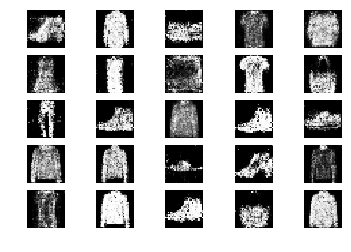

9651 [D loss: 0.738585, acc.: 54.69%] [G loss: 0.855548]
9652 [D loss: 0.642905, acc.: 59.38%] [G loss: 1.036090]
9653 [D loss: 0.635376, acc.: 57.81%] [G loss: 1.017486]
9654 [D loss: 0.643020, acc.: 64.06%] [G loss: 1.031179]
9655 [D loss: 0.665922, acc.: 60.94%] [G loss: 0.895905]
9656 [D loss: 0.681838, acc.: 50.00%] [G loss: 0.895480]
9657 [D loss: 0.662764, acc.: 62.50%] [G loss: 0.889982]
9658 [D loss: 0.663758, acc.: 60.94%] [G loss: 0.930308]
9659 [D loss: 0.628561, acc.: 64.06%] [G loss: 0.890813]
9660 [D loss: 0.648587, acc.: 59.38%] [G loss: 0.917380]
9661 [D loss: 0.643738, acc.: 53.12%] [G loss: 0.930309]
9662 [D loss: 0.651843, acc.: 60.94%] [G loss: 0.884341]
9663 [D loss: 0.616812, acc.: 65.62%] [G loss: 0.922715]
9664 [D loss: 0.694937, acc.: 56.25%] [G loss: 0.992289]
9665 [D loss: 0.734329, acc.: 54.69%] [G loss: 0.966385]
9666 [D loss: 0.567920, acc.: 64.06%] [G loss: 1.012516]
9667 [D loss: 0.612133, acc.: 68.75%] [G loss: 0.917692]
9668 [D loss: 0.660771, acc.: 6

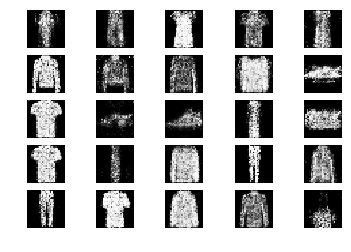

9701 [D loss: 0.663642, acc.: 65.62%] [G loss: 1.017803]
9702 [D loss: 0.669670, acc.: 54.69%] [G loss: 0.980610]
9703 [D loss: 0.641389, acc.: 60.94%] [G loss: 1.081962]
9704 [D loss: 0.671560, acc.: 60.94%] [G loss: 0.903056]
9705 [D loss: 0.674402, acc.: 56.25%] [G loss: 1.001887]
9706 [D loss: 0.611058, acc.: 65.62%] [G loss: 0.915581]
9707 [D loss: 0.632169, acc.: 64.06%] [G loss: 0.912691]
9708 [D loss: 0.636467, acc.: 59.38%] [G loss: 0.904995]
9709 [D loss: 0.613153, acc.: 71.88%] [G loss: 0.978091]
9710 [D loss: 0.643872, acc.: 59.38%] [G loss: 0.994377]
9711 [D loss: 0.654500, acc.: 50.00%] [G loss: 0.979467]
9712 [D loss: 0.696422, acc.: 53.12%] [G loss: 0.867122]
9713 [D loss: 0.668722, acc.: 67.19%] [G loss: 0.994941]
9714 [D loss: 0.605072, acc.: 75.00%] [G loss: 0.994333]
9715 [D loss: 0.649432, acc.: 57.81%] [G loss: 0.945951]
9716 [D loss: 0.637128, acc.: 65.62%] [G loss: 0.869890]
9717 [D loss: 0.644836, acc.: 59.38%] [G loss: 0.854552]
9718 [D loss: 0.638075, acc.: 6

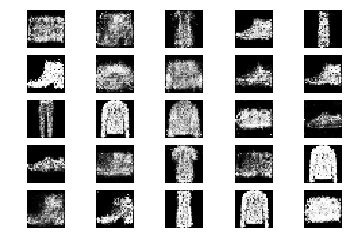

9751 [D loss: 0.606499, acc.: 68.75%] [G loss: 0.844661]
9752 [D loss: 0.612842, acc.: 65.62%] [G loss: 0.882957]
9753 [D loss: 0.711238, acc.: 48.44%] [G loss: 0.852364]
9754 [D loss: 0.650148, acc.: 59.38%] [G loss: 0.888198]
9755 [D loss: 0.669615, acc.: 60.94%] [G loss: 0.934396]
9756 [D loss: 0.641203, acc.: 65.62%] [G loss: 0.964249]
9757 [D loss: 0.623492, acc.: 68.75%] [G loss: 1.065176]
9758 [D loss: 0.711384, acc.: 62.50%] [G loss: 0.929755]
9759 [D loss: 0.682992, acc.: 54.69%] [G loss: 0.877215]
9760 [D loss: 0.651361, acc.: 59.38%] [G loss: 0.893555]
9761 [D loss: 0.720201, acc.: 45.31%] [G loss: 0.867633]
9762 [D loss: 0.636548, acc.: 64.06%] [G loss: 0.920495]
9763 [D loss: 0.683375, acc.: 57.81%] [G loss: 0.857157]
9764 [D loss: 0.747974, acc.: 56.25%] [G loss: 0.953308]
9765 [D loss: 0.626177, acc.: 64.06%] [G loss: 0.942916]
9766 [D loss: 0.655775, acc.: 60.94%] [G loss: 0.962838]
9767 [D loss: 0.642702, acc.: 64.06%] [G loss: 0.924011]
9768 [D loss: 0.661460, acc.: 5

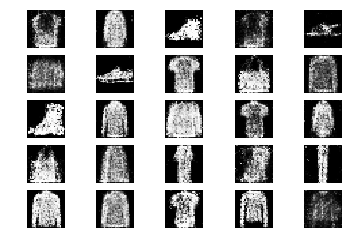

9801 [D loss: 0.659769, acc.: 64.06%] [G loss: 0.884534]
9802 [D loss: 0.603172, acc.: 68.75%] [G loss: 0.901153]
9803 [D loss: 0.642043, acc.: 59.38%] [G loss: 0.959307]
9804 [D loss: 0.700803, acc.: 51.56%] [G loss: 1.063729]
9805 [D loss: 0.672657, acc.: 64.06%] [G loss: 1.002604]
9806 [D loss: 0.619111, acc.: 64.06%] [G loss: 0.971467]
9807 [D loss: 0.627879, acc.: 67.19%] [G loss: 0.930214]
9808 [D loss: 0.675261, acc.: 51.56%] [G loss: 0.924380]
9809 [D loss: 0.650735, acc.: 65.62%] [G loss: 0.919280]
9810 [D loss: 0.674889, acc.: 59.38%] [G loss: 0.845861]
9811 [D loss: 0.635980, acc.: 59.38%] [G loss: 0.873362]
9812 [D loss: 0.640978, acc.: 60.94%] [G loss: 0.898809]
9813 [D loss: 0.668583, acc.: 59.38%] [G loss: 0.909596]
9814 [D loss: 0.668418, acc.: 57.81%] [G loss: 0.854806]
9815 [D loss: 0.613857, acc.: 71.88%] [G loss: 0.875966]
9816 [D loss: 0.645890, acc.: 64.06%] [G loss: 0.906526]
9817 [D loss: 0.672116, acc.: 53.12%] [G loss: 0.943864]
9818 [D loss: 0.647886, acc.: 6

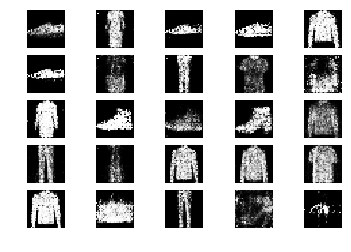

9851 [D loss: 0.675482, acc.: 54.69%] [G loss: 1.014354]
9852 [D loss: 0.626419, acc.: 62.50%] [G loss: 0.960107]
9853 [D loss: 0.695732, acc.: 51.56%] [G loss: 0.958375]
9854 [D loss: 0.642496, acc.: 60.94%] [G loss: 0.893409]
9855 [D loss: 0.644423, acc.: 65.62%] [G loss: 0.902741]
9856 [D loss: 0.686103, acc.: 62.50%] [G loss: 0.885909]
9857 [D loss: 0.645558, acc.: 62.50%] [G loss: 0.924723]
9858 [D loss: 0.624662, acc.: 71.88%] [G loss: 0.969860]
9859 [D loss: 0.658926, acc.: 65.62%] [G loss: 0.947700]
9860 [D loss: 0.633841, acc.: 62.50%] [G loss: 0.819098]
9861 [D loss: 0.633846, acc.: 59.38%] [G loss: 0.869014]
9862 [D loss: 0.646634, acc.: 64.06%] [G loss: 0.875261]
9863 [D loss: 0.647533, acc.: 60.94%] [G loss: 0.913239]
9864 [D loss: 0.680087, acc.: 56.25%] [G loss: 0.861171]
9865 [D loss: 0.618077, acc.: 67.19%] [G loss: 0.939076]
9866 [D loss: 0.691923, acc.: 46.88%] [G loss: 0.951207]
9867 [D loss: 0.687571, acc.: 51.56%] [G loss: 1.017052]
9868 [D loss: 0.694866, acc.: 5

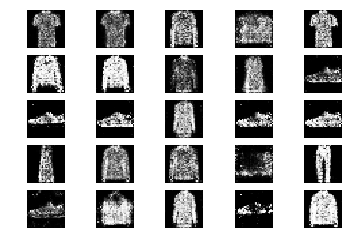

9901 [D loss: 0.625398, acc.: 67.19%] [G loss: 0.948287]
9902 [D loss: 0.650795, acc.: 68.75%] [G loss: 0.934070]
9903 [D loss: 0.643869, acc.: 64.06%] [G loss: 0.979820]
9904 [D loss: 0.700440, acc.: 60.94%] [G loss: 0.907754]
9905 [D loss: 0.637395, acc.: 64.06%] [G loss: 0.848610]
9906 [D loss: 0.655109, acc.: 65.62%] [G loss: 0.847802]
9907 [D loss: 0.702553, acc.: 62.50%] [G loss: 0.913787]
9908 [D loss: 0.628698, acc.: 65.62%] [G loss: 0.930141]
9909 [D loss: 0.694558, acc.: 51.56%] [G loss: 0.917182]
9910 [D loss: 0.582389, acc.: 70.31%] [G loss: 0.985921]
9911 [D loss: 0.670766, acc.: 60.94%] [G loss: 0.962622]
9912 [D loss: 0.702650, acc.: 51.56%] [G loss: 0.920271]
9913 [D loss: 0.632394, acc.: 62.50%] [G loss: 0.936061]
9914 [D loss: 0.656908, acc.: 57.81%] [G loss: 0.872542]
9915 [D loss: 0.725828, acc.: 46.88%] [G loss: 0.937919]
9916 [D loss: 0.607975, acc.: 67.19%] [G loss: 0.887477]
9917 [D loss: 0.685650, acc.: 59.38%] [G loss: 0.920101]
9918 [D loss: 0.723264, acc.: 5

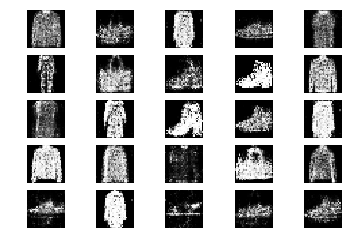

9951 [D loss: 0.662301, acc.: 60.94%] [G loss: 0.990605]
9952 [D loss: 0.622104, acc.: 65.62%] [G loss: 0.932401]
9953 [D loss: 0.627893, acc.: 62.50%] [G loss: 0.918815]
9954 [D loss: 0.673893, acc.: 62.50%] [G loss: 0.984104]
9955 [D loss: 0.631648, acc.: 57.81%] [G loss: 0.935675]
9956 [D loss: 0.704916, acc.: 59.38%] [G loss: 0.928274]
9957 [D loss: 0.693977, acc.: 57.81%] [G loss: 0.879545]
9958 [D loss: 0.648345, acc.: 65.62%] [G loss: 0.933583]
9959 [D loss: 0.657351, acc.: 60.94%] [G loss: 0.925689]
9960 [D loss: 0.587839, acc.: 75.00%] [G loss: 0.933425]
9961 [D loss: 0.715909, acc.: 48.44%] [G loss: 0.908985]
9962 [D loss: 0.616000, acc.: 62.50%] [G loss: 0.886503]
9963 [D loss: 0.639449, acc.: 67.19%] [G loss: 0.916154]
9964 [D loss: 0.580362, acc.: 64.06%] [G loss: 0.935571]
9965 [D loss: 0.717316, acc.: 56.25%] [G loss: 0.937585]
9966 [D loss: 0.655326, acc.: 57.81%] [G loss: 0.971305]
9967 [D loss: 0.632081, acc.: 59.38%] [G loss: 0.906476]
9968 [D loss: 0.696642, acc.: 5

In [15]:
epochs = 10000

batch_size = 32
valid = np.ones((batch_size, 1))
fake = np.zeros((batch_size, 1))

for epoch in range(epochs):
  # Train discriminator
  idx = np.random.randint(0, x_train.shape[0], batch_size)
  imgs = x_train[idx]

  noise = np.random.normal(0, 1, (batch_size, 100))

  gen_imgs = generator.predict(noise)

  d_loss_real = discriminator.train_on_batch(imgs, valid)
  d_loss_fake = discriminator.train_on_batch(gen_imgs, fake)
  d_loss = 0.5*np.add(d_loss_real, d_loss_fake)

  # Train generator
  noise = np.random.normal(0, 1, (batch_size, 100))

  g_loss = combined.train_on_batch(noise, valid)

  print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

  if epoch % 50 == 0:
    sample_images(epoch)

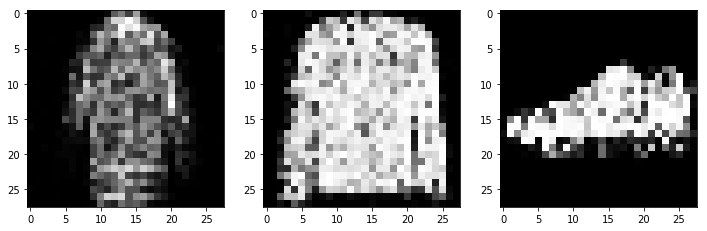

In [16]:
r, c = 5, 5
noise = np.random.normal(0, 1, (r*c, 100))
gen_imgs = generator.predict(noise)

gen_imgs = 0.5*gen_imgs+0.5

plt.figure(figsize=(12, 6))
plt.subplot(131)
plt.imshow(gen_imgs[0, :, :, 0], cmap='gray')
plt.subplot(132)
plt.imshow(gen_imgs[1, :, :, 0], cmap='gray')
plt.subplot(133)
plt.imshow(gen_imgs[2, :, :, 0], cmap='gray')
plt.show()
plt.close()